# Importing

## Importing modules

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
import time
import random
import math
from multiprocessing import Process, Queue

import keras
from keras.models import Sequential
from keras.layers import Activation, Dense
from keras.models import load_model
from keras.optimizers import SGD, adam, nadam, adagrad, rmsprop, adadelta

Using TensorFlow backend.


## Importing own code

In [2]:
from generateSpace import *
from plotLattice import *
from getTriangleLengths import *
from potentialEnergyPerTrio import *
from potentialEnergy import *
from potentialEnergyPerParticle import *
from numberOfCalculations import *
from makeRandomDatabase import *
from prepareDatabaseForMachineLearning import*

## Writing own code

### Analysis code

In [3]:
def plotHistory(fitDetails):
    """
    hjhgj
    """
    history = {'loss': fitDetails.history['loss'], 'val_loss': fitDetails.history['val_loss']}
    
    maximumValue = max(max(history['loss']), max(history['val_loss']))
    minimumValue = min(min(history['loss']), min(history['val_loss'])) / 10#math.pow(math.floor(math.log(min(min(history['loss']), min(history['val_loss'])), 10)) - 1, 10)
    numberOfEpochs = len(history['loss'])
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(16, 16))
    ax1.plot([i for i in range(1, numberOfEpochs + 1)], history['loss'], label='Training loss')
    ax1.plot([i for i in range(1, numberOfEpochs + 1)], history['val_loss'], label='Validation loss')
    ax1.legend()
    ax1.set_xlim(1, numberOfEpochs)
    ax1.set_ylim(0, maximumValue)
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.set_title('Loss (training and validation) vs the number of epochs.')
    
    ax2.plot(history['loss'], history['val_loss'])
    ax2.set_xlim(0, maximumValue)
    ax2.set_ylim(0, maximumValue)
    ax2.set_xlabel('Training loss')
    ax2.set_ylabel('Validation loss')
    ax2.set_title('Validation loss vs training loss.')
    
    ax3.plot([i for i in range(1, numberOfEpochs + 1)], history['loss'], label='Training loss')
    ax3.plot([i for i in range(1, numberOfEpochs + 1)], history['val_loss'], label='Validation loss')
    ax3.legend()
    ax3.set_xlim(1, numberOfEpochs)
    ax3.set_yscale('log')
    ax3.set_ylim(minimumValue, maximumValue)
    ax3.set_xlabel('Epochs')
    ax3.set_ylabel('Loss')
    ax3.set_title('Loss (training and validation) vs the number of epochs (logarithmic)')
    
    ax4.plot(history['loss'], history['val_loss'])
    ax4.set_xscale('log')
    ax4.set_xlim(minimumValue, maximumValue)
    ax4.set_yscale('log')
    ax4.set_ylim(minimumValue, maximumValue)
    ax4.set_xlabel('Training loss')
    ax4.set_ylabel('Validation loss')
    ax4.set_title('Validation loss vs training loss (logarithmic).')
    
    plt.show()
    history['figure'] = [fig, ax1, ax2, ax3, ax4]
    
    return history

In [4]:
def makePredictionPlot(model, dataFrame, amountOfPoints=1000):
    prediction = []
    realValue = []
    
    for i in range(min(len(dataFrame['potentialEnergy']), amountOfPoints)):
        index = dataFrame.index[i]
        prediction.append(model.predict([[dataFrame['eigenvalues'][index]]])[0][0])
        realValue.append(dataFrame['potentialEnergy'][index])
    
    fig, ((ax1)) = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
    ax1.scatter(realValue, prediction, s=5)
    ax1.set_xlim(min(min(prediction), min(realValue)), max(max(prediction), max(realValue)))
    ax1.set_ylim(min(min(prediction), min(realValue)), max(max(prediction), max(realValue)))
    ax1.set_xlabel('Real energy')
    ax1.set_ylabel('Predicted energy')
    ax1.set_title('Predicted energy vs real energy.')
    
    plt.show()

In [5]:
def plotAndPredict(model, dataFrame, indexNumber):
    prediction = model.predict([[dataFrame['eigenvalues'][indexNumber]]])[0][0]
    realValue = dataFrame['potentialEnergy'][indexNumber]
    
    fig, ax = plotLatticeFromDataFrame(dataFrame, indexNumber)
    print('For index', indexNumber, 'Predicted', prediction, 'was', realValue)
    return fig, ax

### Network code

In [6]:
def makeDenseNetwork(inputSize, settings, learningRate, kernalInitializer='he_uniform', lossFunction='MAE', optimizer=adam):#https://keras.io/api/losses/regression_losses/
    """
    jhgjhgj
    """
    model = Sequential()
    model.add(Dense(settings[0][1], input_dim=inputSize, use_bias=settings[0][3], activation=settings[0][2], kernel_initializer=kernalInitializer))
    #model.add(Activation(settings[0][2]))
    
    for i in range(1, len(settings)):
        setting = settings[i]#0 is kind of layer, rest are settings.
        
        model.add(Dense(setting[1], use_bias=setting[3], activation=setting[2], kernel_initializer=kernalInitializer))
        #model.add(Activation(setting[2]))
    
    opt = optimizer(lr=learningRate)
    model.compile(loss=lossFunction, optimizer=opt)
    
    return model

In [7]:
def makeLinearNet(learningRate, inputDim, loss):
    model = Sequential()
    opt = adam(lr=learningRate)
    model.add(Dense(1, activation="linear", use_bias=False, input_dim=inputDim))
    model.compile(loss=loss, optimizer=opt)
    return model

# Getting data

## Importing data and settings

In [8]:
filename = 'databaseModLen_min_cut0.90_widths86_Width1.5-10_3-1sur_epoch30_maxDelta0.1_R20_M2M3Prepared'#'OLDcombinedDataR100M2M3M4Prepared'#'combinedDataPrepared'
orderOfMatrix = [-2, -3]# Make a list if you want to do the calculations yourself and make a other type of you want to import it
inputSize=4 * len(orderOfMatrix)#13

data = pd.read_json(filename + '.json', orient='columns')
data['particleCoordinates'] = data['particleCoordinates'].apply(np.array)
data['eigenvalues'] = data['eigenvalues'].apply(np.array)
#data['eigenvalues'] = data['eigenvalues'].apply(np.transpose)
#data['eigenvalues'] = data['eigenvalues'].apply(list)

offset = 0#min(data['potentialEnergy'])
print('Offset is', offset)
data['potentialEnergy'] = data['potentialEnergy']-offset

Offset is 0


## Inspecting data

In [9]:
data.head()

,index,particleCoordinates,widthOfCell,numberOfSurroundingCells,potentialEnergy,eigenvalues,relativeDistances
0,16240,"[[0.7568887144, 1.7685255752], [0.1297189098, ...",2.7,3,-4.596381,"[-155595.5084728395, -389.9529814805, 1521.543...","[2.7, 0.0025707372, 1.1757235893, 2.1846271742..."
1,16241,"[[2.0425056622, 1.6989714468], [1.7219134703, ...",2.7,3,-5.948705,"[-1575.735781932, -559.2010946783, 236.8185235...","[2.7, 0.2563910411, 0.7630489258, 1.033243676,..."
2,16242,"[[0.42269750370000003, 1.2410828812], [0.57424...",2.7,3,-5.668112,"[-1272.435954481, -521.0483505899, 81.23277798...","[2.7, 0.3193683265, 0.831091113, 0.94550295130..."
3,16243,"[[2.3830583804, 1.2074391325], [1.3053535702, ...",2.7,3,-6.165852,"[-966.3911551727, -870.5288375645, 179.6479959...","[2.7, 0.4322595195, 0.4568524632, 1.1875173367..."
4,16244,"[[2.3516804941, 2.029534644], [1.5857188892, 1...",2.7,3,-3.658218,"[-1355.3405989462, -680.3052051724, 32.7884982...","[2.7, 0.5128421674, 0.6014235434, 0.7871234139..."


In [10]:
print(data['potentialEnergy'].quantile(0.99))
data.describe()

224.45612384993737


,index,widthOfCell,numberOfSurroundingCells,potentialEnergy
count,64950.000000,64950.000000,64950.0,64950.000000
mean,32474.500000,4.714582,3.0,4.847734
std,18749.594329,2.078584,0.0,66.299529
min,0.000000,1.500000,3.0,-45.142848
25%,16237.250000,3.000000,3.0,-4.341829
50%,32474.500000,4.500000,3.0,-1.726104
75%,48711.750000,6.100000,3.0,-0.651513
max,64949.000000,10.000000,3.0,2665.287506


In [11]:

"""
qLow = data['potentialEnergy'].quantile(0.01)
qHi  = data['potentialEnergy'].quantile(0.98)
dataFiltered = data.copy()
data = data[(data['potentialEnergy'] < qHi) & (data['potentialEnergy'] > qLow)]
#dataFiltered = data[(data['potentialEnergy'] < qHi) & (data['potentialEnergy'] > qLow)]

x = dataFiltered['potentialEnergy']
fig, ax = plt.subplots(figsize=(8, 8))
sortedX = np.sort(x) - 1.01 * min(x)
ax.plot([100*i/len(x) for i in range(0, len(x))], sortedX)
ax.set_xlim(0, 100)
ax.set_yscale('log')
ax.set_title('Plot of the energy per particle for each percentile.')
ax.set_ylabel('Energy per particle')
ax.set_xlabel('Percentile')
plt.show()

#"""


"""
tempData = dataFiltered.copy()
tempOfsett = 1.01 * min(tempData['potentialEnergy'])
tempData['potentialEnergy'] = tempData['potentialEnergy'] - tempOfsett
medianData = tempData.groupby('widthOfCell').describe(percentiles=[0.05, 0.5, 0.95])
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(medianData.index, medianData['potentialEnergy']['5%'])
ax.plot(medianData.index, medianData['potentialEnergy']['5%'])
ax.plot(medianData.index, medianData['potentialEnergy']['50%'])
ax.plot(medianData.index, medianData['potentialEnergy']['95%'])
plt.legend(['5%', '50%', '95%'])
ax.set_yscale('log')
ax.set_title('Plot of the energy per particle for each width of cell with offset of ' + str(tempOfsett) + '.')
ax.set_ylabel('Energy per particle')
ax.set_xlabel('Width of cell')
plt.show()
#"""

"""
tempData = dataFiltered.copy()
tempOfsett = 0#1.01 * min(tempData['potentialEnergy'])
tempData['potentialEnergy'] = tempData['potentialEnergy'] - tempOfsett
medianData = tempData.groupby('widthOfCell').describe(percentiles=[0.05, 0.5, 0.95])
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(medianData.index, medianData['potentialEnergy']['min'])
ax.plot(medianData.index, medianData['potentialEnergy']['5%'])
ax.plot(medianData.index, medianData['potentialEnergy']['50%'])
ax.plot(medianData.index, medianData['potentialEnergy']['95%'])
plt.legend(['min', '5%', '50%', '95%'])
plt.ylim(-30, 30)
ax.set_title('Plot of the energy per particle for each width of cell with offset of ' + str(tempOfsett) + '.')
ax.set_ylabel('Energy per particle')
ax.set_xlabel('Width of cell')
plt.show()
#"""


"\ntempData = dataFiltered.copy()\ntempOfsett = 0#1.01 * min(tempData['potentialEnergy'])\ntempData['potentialEnergy'] = tempData['potentialEnergy'] - tempOfsett\nmedianData = tempData.groupby('widthOfCell').describe(percentiles=[0.05, 0.5, 0.95])\nfig, ax = plt.subplots(figsize=(8, 8))\nax.plot(medianData.index, medianData['potentialEnergy']['min'])\nax.plot(medianData.index, medianData['potentialEnergy']['5%'])\nax.plot(medianData.index, medianData['potentialEnergy']['50%'])\nax.plot(medianData.index, medianData['potentialEnergy']['95%'])\nplt.legend(['min', '5%', '50%', '95%'])\nplt.ylim(-30, 30)\nax.set_title('Plot of the energy per particle for each width of cell with offset of ' + str(tempOfsett) + '.')\nax.set_ylabel('Energy per particle')\nax.set_xlabel('Width of cell')\nplt.show()\n#"

## Preparing data

In [12]:

"""
trainingData = data.sample(frac=0.8)
validationData = data.drop(trainingData.index)

inputData = []
targetData = []
for i in trainingData.index:
    inputData.append(trainingData['eigenvalues'][i])#TODO remove sorted once fixed in data
    #targetData.append(trainingData['potentialEnergy'][i])
    targetData.append(sum(trainingData['eigenvalues'][i]))

trainingInput = [[inputData], [targetData]]

inputData = []
targetData = []
for i in validationData.index:
    inputData.append(validationData['eigenvalues'][i])#TODO remove sorted once fixed in data
    targetData.append(validationData['potentialEnergy'][i])

validationInput = [[inputData], [targetData]]
"""
#"""
trainingData = data.sample(frac=0.8)
validationData = data.drop(trainingData.index)

inputData = []
targetData = []
for i in trainingData.index:
    inputData.append(np.array(trainingData['eigenvalues'][i]))
    #inputData.append(np.array(trainingData['relativeDistances'][i]))
    #targetData.append(trainingData['potentialEnergy'][i])
    targetData.append(sum(trainingData['eigenvalues'][i]))
    #targetData.append(sum(trainingData['relativeDistances'][i]))

trainingInput = {'input':np.array(inputData), 'target':np.array(targetData)}

print('Results training input:')
[print(trainingInput['input'][i], trainingInput['target'][i], '\n') for i in range(0, 3)]
print(np.shape(trainingInput['input']))
print(type(trainingInput['input']))
print(type(trainingInput['input'][0]))
print(np.shape(trainingInput['target']))
print(type(trainingInput['target']))

inputData = []
targetData = []
for i in validationData.index:
    inputData.append(np.array(validationData['eigenvalues'][i]))
    #inputData.append(np.array(validationData['relativeDistances'][i]))
    targetData.append(validationData['potentialEnergy'][i])
    #targetData.append([sum(validationData['eigenvalues'][i])])
    #targetData.append([sum(validationData['relativeDistances'][i])])

validationInput = {'input':np.array(inputData), 'target':np.array(targetData)}

print('Results validation input:')
[print(validationInput['input'][i], validationInput['target'][i], '\n') for i in range(0, 3)]
print(np.shape(validationInput['input']))
print(type(validationInput['input']))
print(type(validationInput['input'][0]))
print(np.shape(validationInput['target']))
print(type(validationInput['target']))

validationPlots = [random.choice(validationData.index) for i in range(0, 11)]

#"""
print()

Results training input:
[ -1418.27994368   -422.34533069    286.71552213   1896.58411493
 -52359.71116884  -8498.98737923   7570.94511356  54192.92936301] 1247.8502911774049 

[-1.11527936e+03 -1.27073483e+02  9.27514163e+00  1.27879456e+03
 -3.68193416e+04 -1.19022748e+03  1.79020300e+01  3.80546200e+04] 108.66982339278911 

[-2.69920010e+03 -1.30805996e+02  1.63983785e+02  2.83514121e+03
 -1.40075521e+05 -1.36357105e+03  1.42231219e+03  1.40377164e+05] 529.5034320989798 

(51960, 8)
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(51960,)
<class 'numpy.ndarray'>
Results validation input:
[ -1272.43595448   -521.04835059     81.23277798   4014.74124585
 -44630.39959857 -11115.34108104   7712.39650569  58653.35653639] -5.6681116989 

[  -2956.08387923    -356.86557877     584.90530873    5030.53386803
 -160258.48125033   -5821.84022511    9568.64045218  167131.69338573] -4.3657142404 

[ -1856.0516362    -570.9192967     409.35427659   4320.10637507
 -79239.00395171 -12910.55343861  14

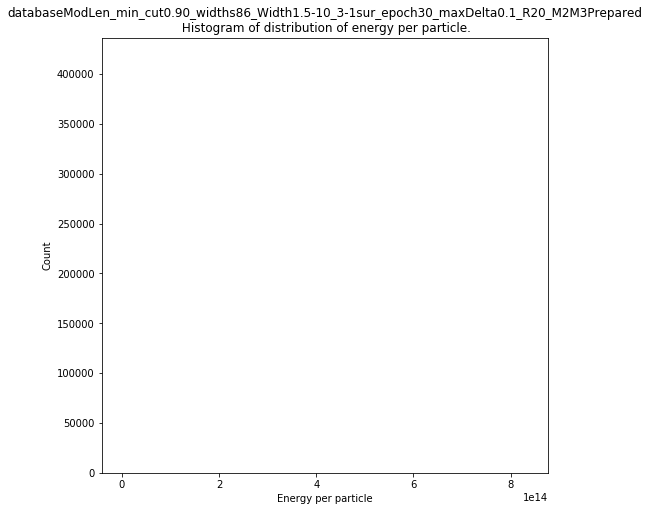

1883907286573.0068
Mean 6010771683.228212 STD: None
1273867.023878708
[835002485846457.5, 835002485846035.1, 193230525862615.47, 193230525860423.97]


In [13]:
allEigenvalues =[]
[[allEigenvalues.append(abs(j)) for j in trainingInput['input'][i]] for i in range(len(trainingInput['input']))]

allEigenvalues = np.array(allEigenvalues)

fig, ax = plt.subplots(figsize=(8, 8))
n, bins, patches = ax.hist(allEigenvalues, 1000, facecolor='blue', alpha=0.5)
ax.set_title(filename + '\n Histogram of distribution of energy per particle.')
ax.set_xlabel('Energy per particle')
ax.set_ylabel('Count')
plt.show()

print('Mean', np.mean(allEigenvalues), 'STD:', print(np.std(allEigenvalues)))
print(np.percentile(allEigenvalues, 95))
print([np.sort(allEigenvalues)[-i] for i in range(1, 5)])

## Preparing test data

In [14]:
"""
widthOfCell = 5.0
numberOfSurroundingCells = 3
R0 = 20
x = np.linspace(0.1, 1.1, 60)

testData = {'particleCoordinates': [],'widthOfCell':[] , 'numberOfSurroundingCells': [], 'potentialEnergy':[]}# Initialy use a dictionary because it's easier to append to than a dataframe.
for i in x:
    particles = [np.array([0.1, 0.1]), np.array([0.55, 0.9]), np.array([0.6, 0.665]), np.array([0.5, i])]
    particles = [widthOfCell * coordinate for coordinate in particles]
    otherSpace = generateSpace(particles, numberOfSurroundingCells, widthOfCell)# Generate the other space.
    testData['particleCoordinates'].append(particles)
    testData['widthOfCell'].append(widthOfCell)
    testData['numberOfSurroundingCells'].append(numberOfSurroundingCells)
    testData['potentialEnergy'].append(potentialEnergy(otherSpace, particles, potentialEnergyPerTrio) - offset)# Calculate the potential energy and save it to the data dictonairy.

x = widthOfCell * x
testData = prepareDatabseForMachineLearning(pd.DataFrame(testData), orderOfMatrix, R0, giveUpdates = False)

fig, ax1 = plt.subplots(figsize=(8, 8))
ax1.plot(list(x), [testData['eigenvalues'][i] for i in range(len(testData['eigenvalues']))])
ax1.legend()
ax1.set_ylim(-1000, 1000)
ax1.set_xlabel('Position of atom')
ax1.set_ylabel('Eigenvalues')
ax1.set_title('Eigenvalues for different positions.')
plt.show()

testData.head()
testData.describe()

y = []
for i in range(len(x)):
    y.append(testData['potentialEnergy'][i])


fig, ax1 = plt.subplots(figsize=(8, 8))
ax1.plot(list(x), y, label='Real potential energy')
ax1.legend()
ax1.set_xlabel('Position of atom')
ax1.set_ylabel('Potential energy')
ax1.set_title('Predicted potential energy and real potential energy for different positions.')
#ax1.set_ylim(-0.75 * offset , 1.5 * max(y[1]))
plt.show()
#"""
print()

# Machine learning

In [15]:
models = []
prefixName = 0
saveFolder = 'testRun'
lossMetric = 'MAE'#keras.losses.MeanAbsoluteError()#keras.losses.MeanSquaredError()
#trainNetwork(model, trainingInput, 0.3, numberOfEpochs=100, batchSize=32, verboseSetting=1)
#fitDetails = network.fit(trainingData[0], trainingData[1], shuffle=True, batch_size=batchSize, validation_split=validationSplit, epochs=numberOfEpochs, verbose=max(0,verboseSetting))

def RSMPE(target,value):
    return ((keras.backend.mean(((value-target)/target)**2))**0.5)*100

def MAE(target,value):
    return keras.backend.mean(abs(value-target))


## Try linear network

In [16]:
def makeRandomNumberDatabaseSum(amountOfData, amountOfInputs=8, sigma=10**5):
    X = []
    y = []
    for i in range(amountOfData):#data.index:
        randomNumbers = [random.gauss(0, sigma) for j in range(0,amountOfInputs)]#[random.uniform(-maximalNumbers, maximalNumbers) for j in range(0,amountOfInputs)]

        X.append(randomNumbers)
        y.append(sum(randomNumbers))

    X = np.array(X)
    Y = np.array(y)

    return X, Y

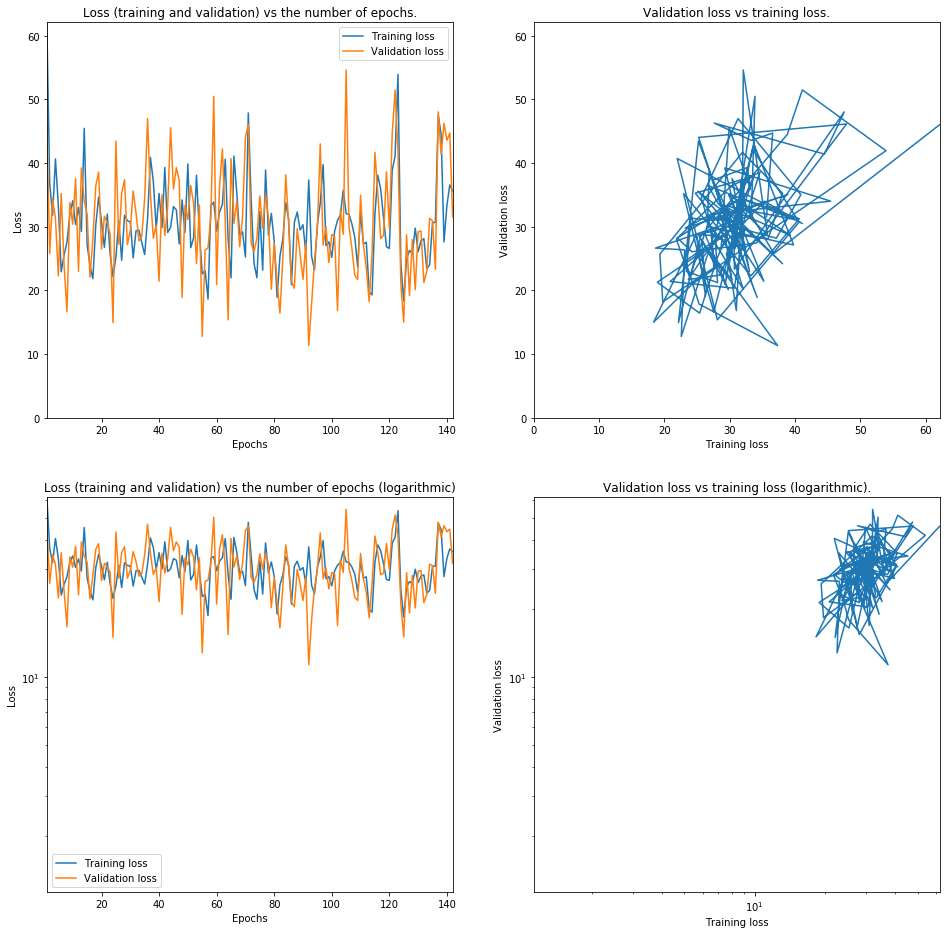

Amount of data 1000 Learning rate: 1.0 Amount of epochs: 60 Final loss: 30.682064731312447


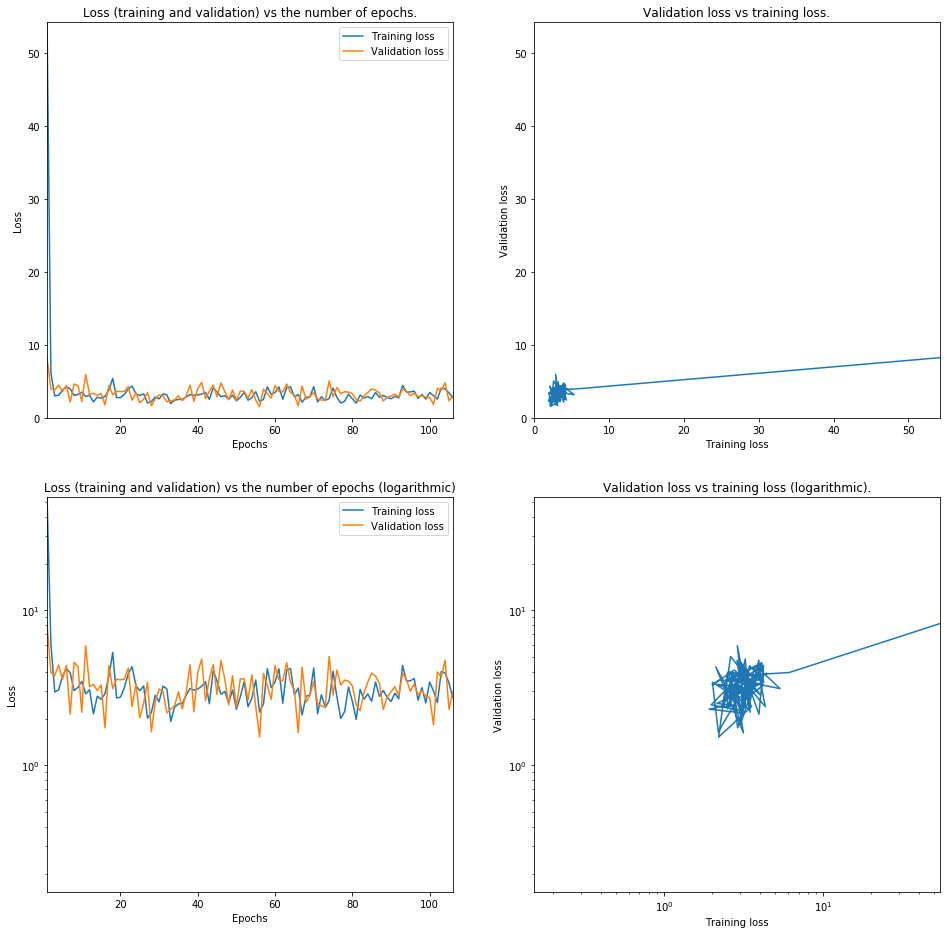

Amount of data 1000 Learning rate: 0.1 Amount of epochs: 55 Final loss: 2.994861849408571


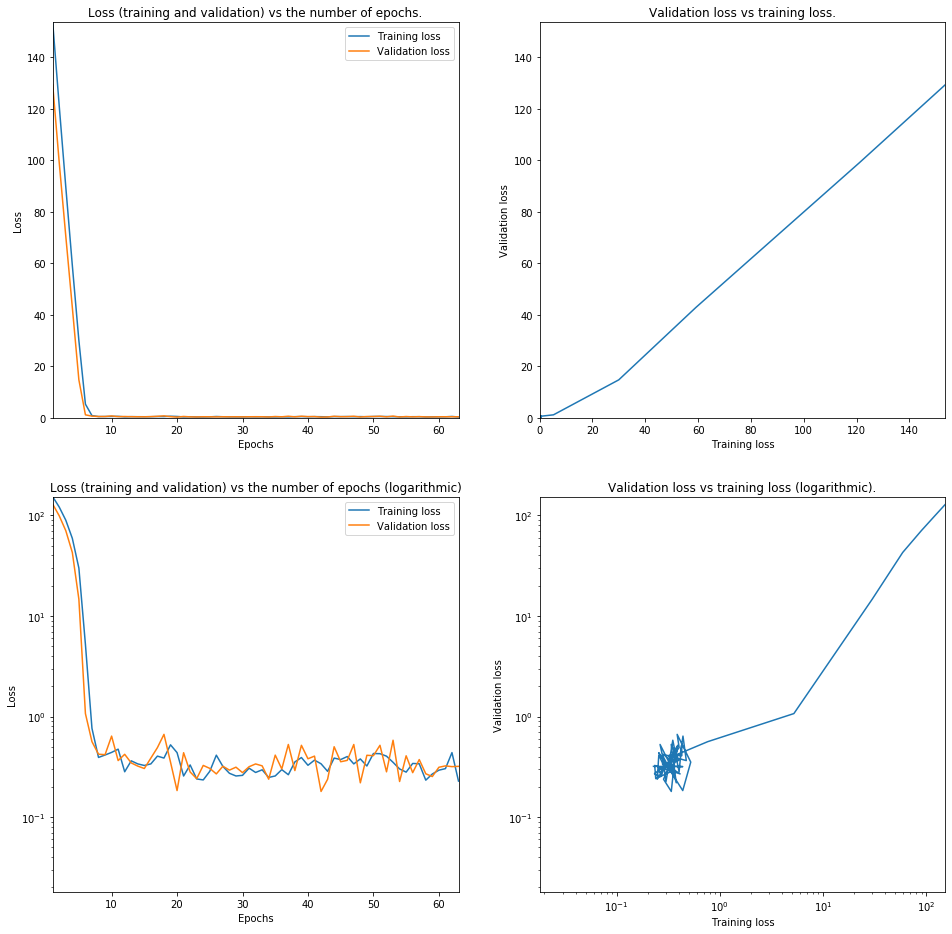

Amount of data 1000 Learning rate: 0.01 Amount of epochs: 11 Final loss: 0.3246500129063113


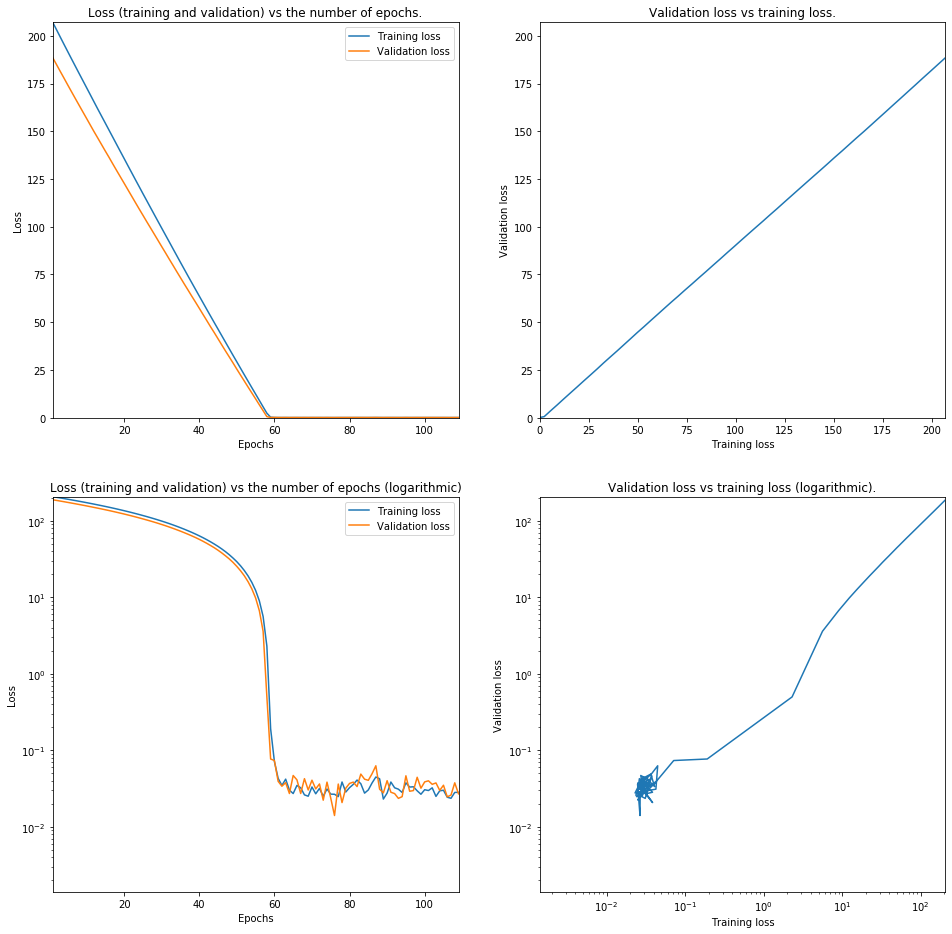

Amount of data 1000 Learning rate: 0.001 Amount of epochs: 58 Final loss: 0.03224874084620249


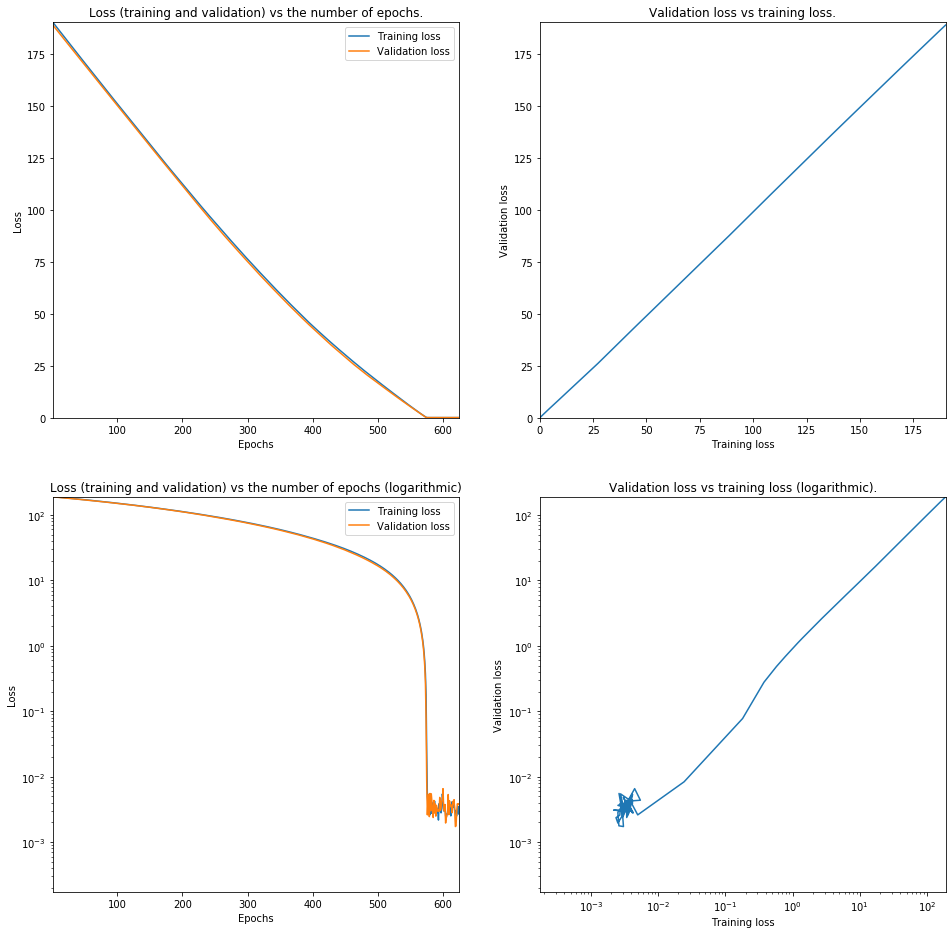

Amount of data 1000 Learning rate: 0.0001 Amount of epochs: 510 Final loss: 0.003492409687514613


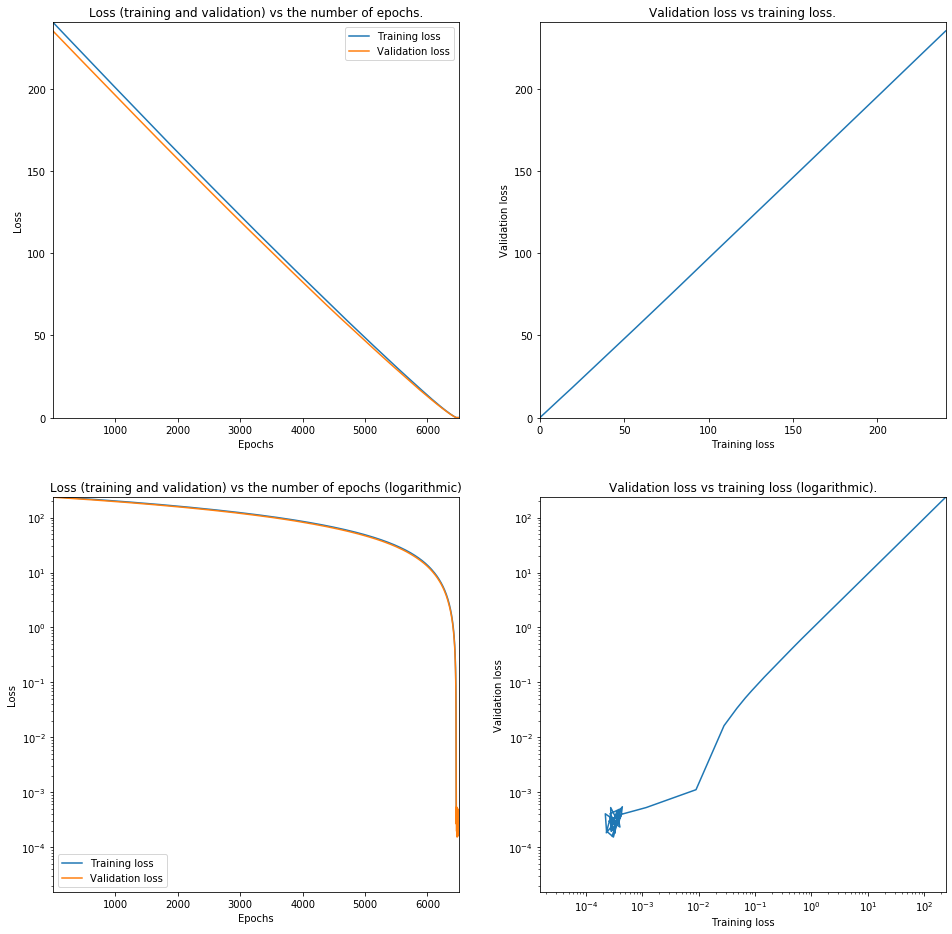

Amount of data 1000 Learning rate: 1e-05 Amount of epochs: 5737 Final loss: 0.004902227635222937


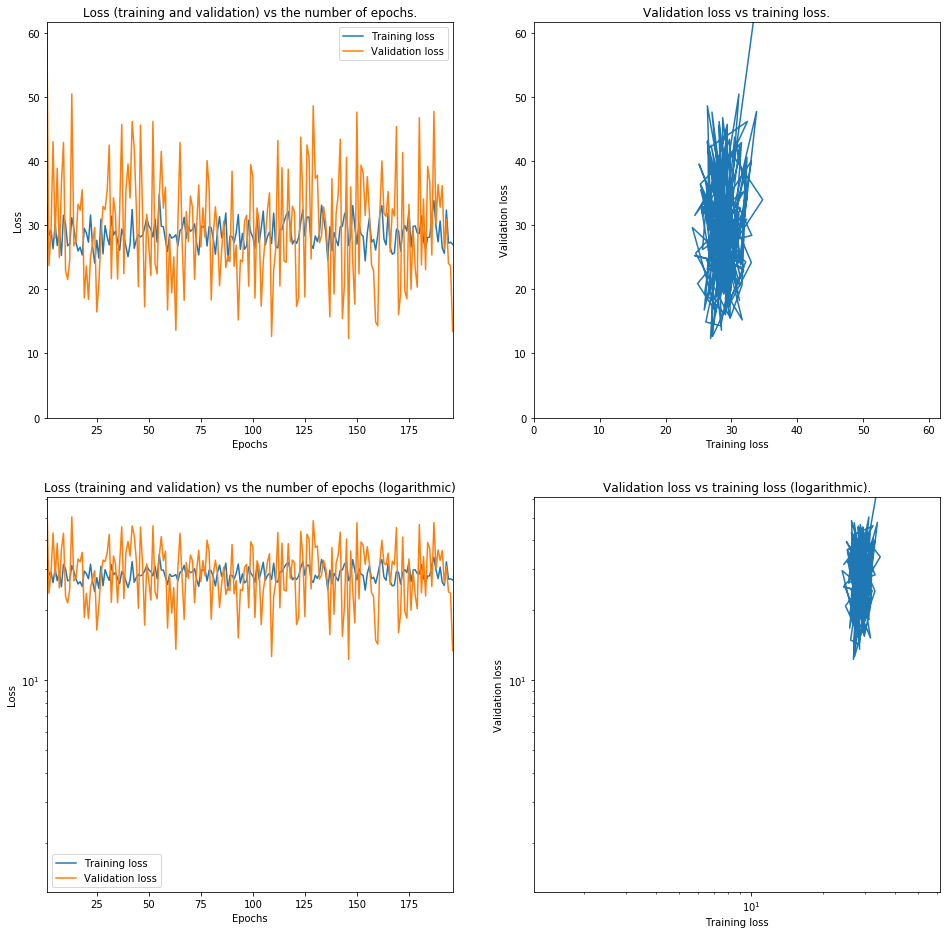

Amount of data 10000 Learning rate: 1.0 Amount of epochs: 59 Final loss: 28.54371840056854


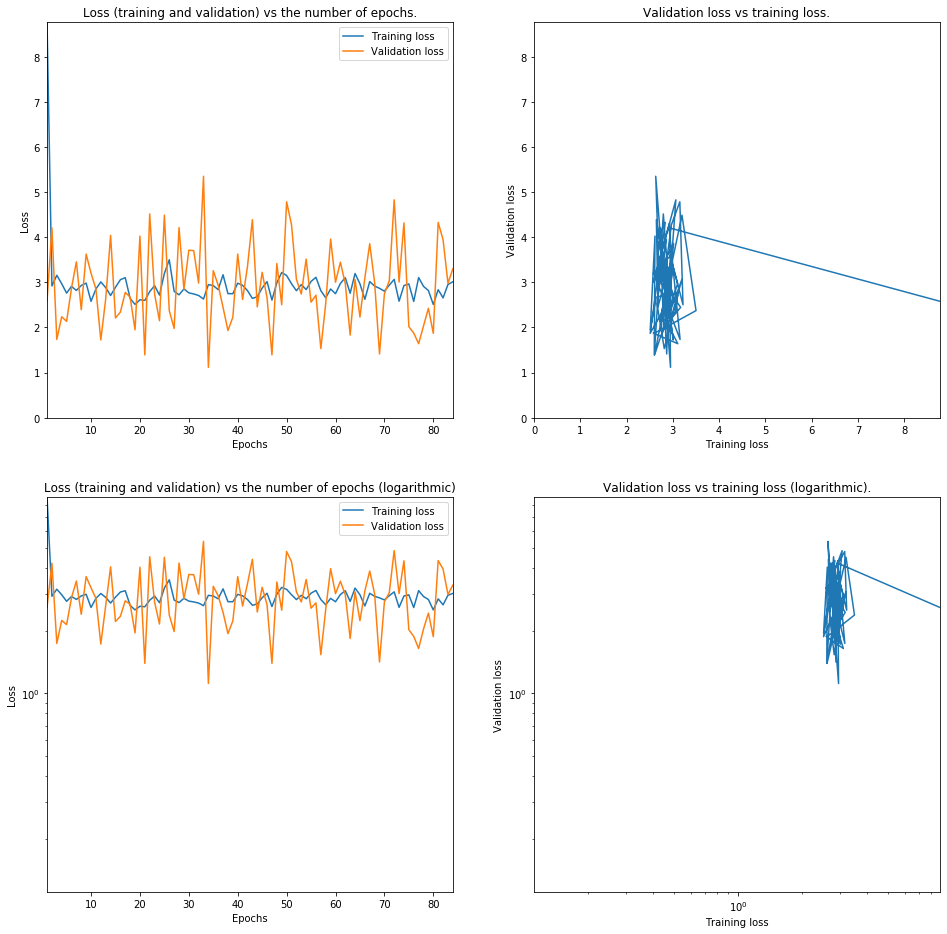

Amount of data 10000 Learning rate: 0.1 Amount of epochs: 23 Final loss: 2.895576317818311


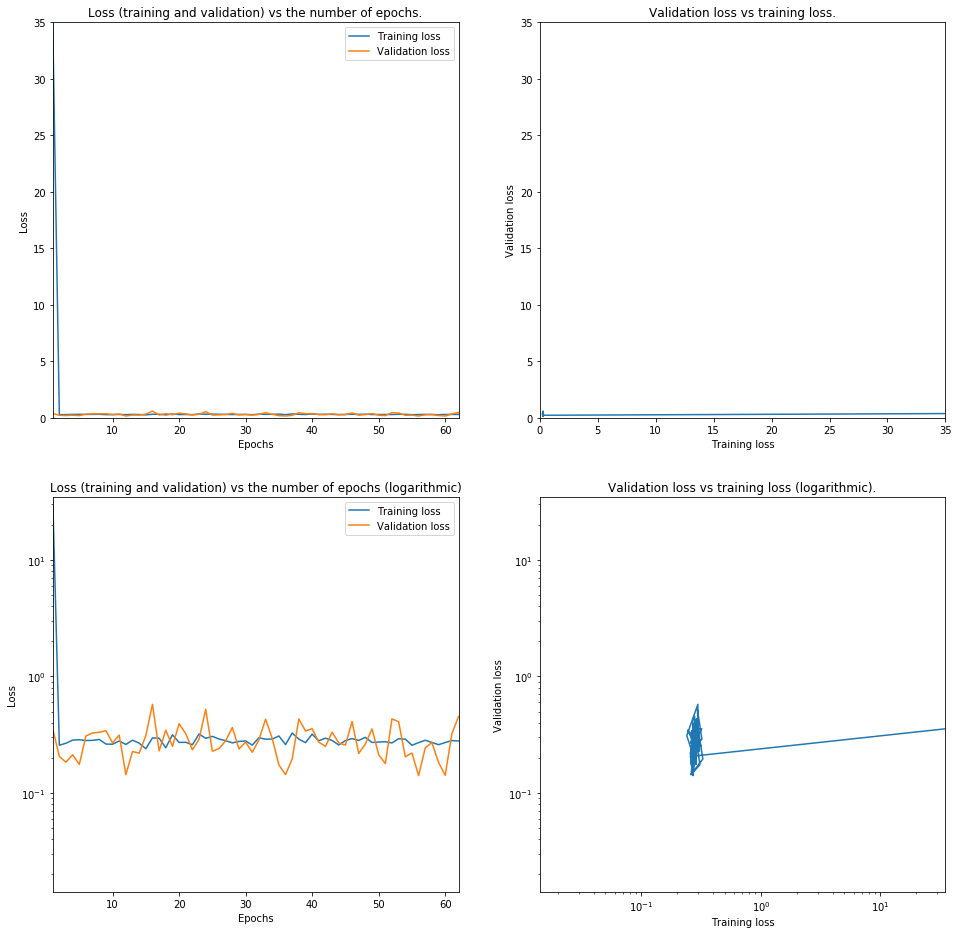

Amount of data 10000 Learning rate: 0.01 Amount of epochs: 18 Final loss: 0.2848009645123871


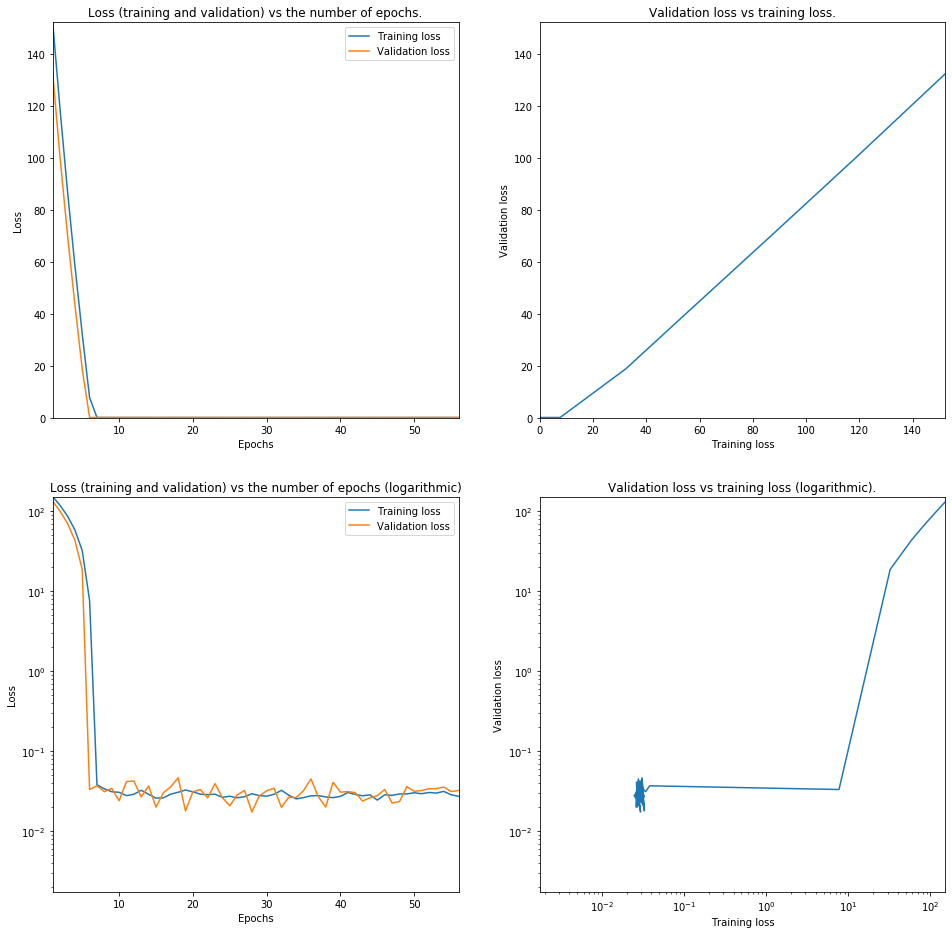

Amount of data 10000 Learning rate: 0.001 Amount of epochs: 6 Final loss: 0.02856469905297367


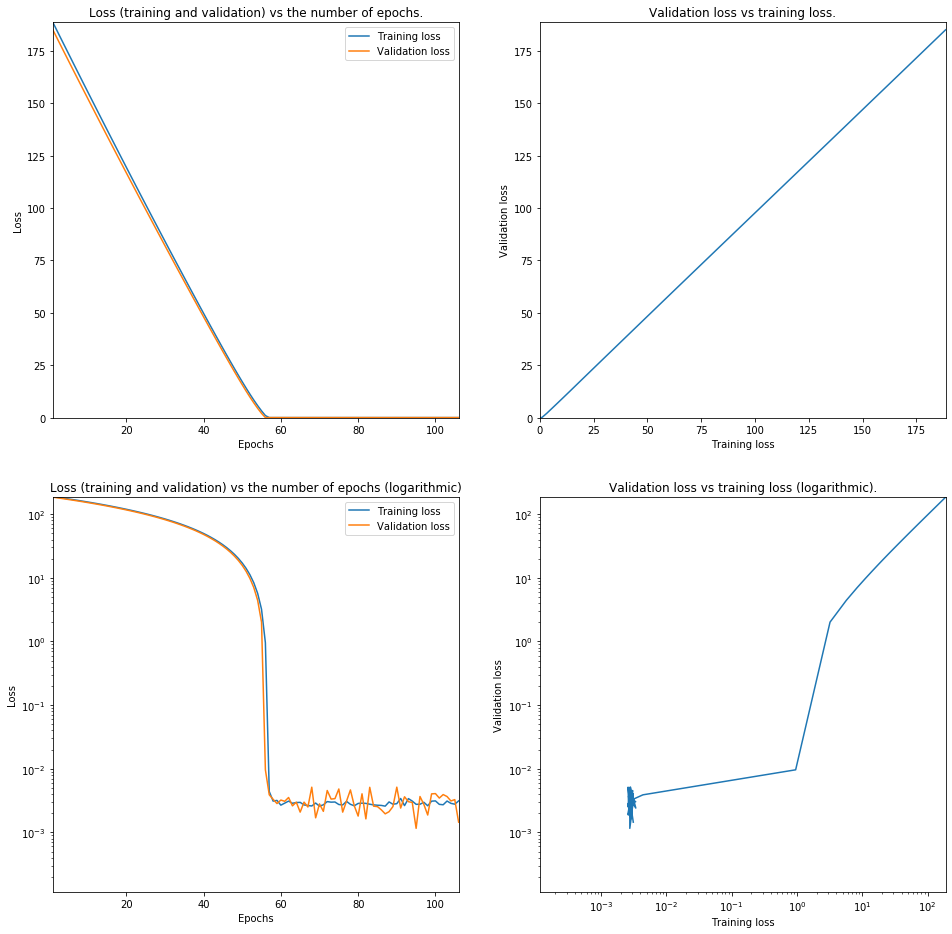

Amount of data 10000 Learning rate: 0.0001 Amount of epochs: 53 Final loss: 0.0028652028675501544


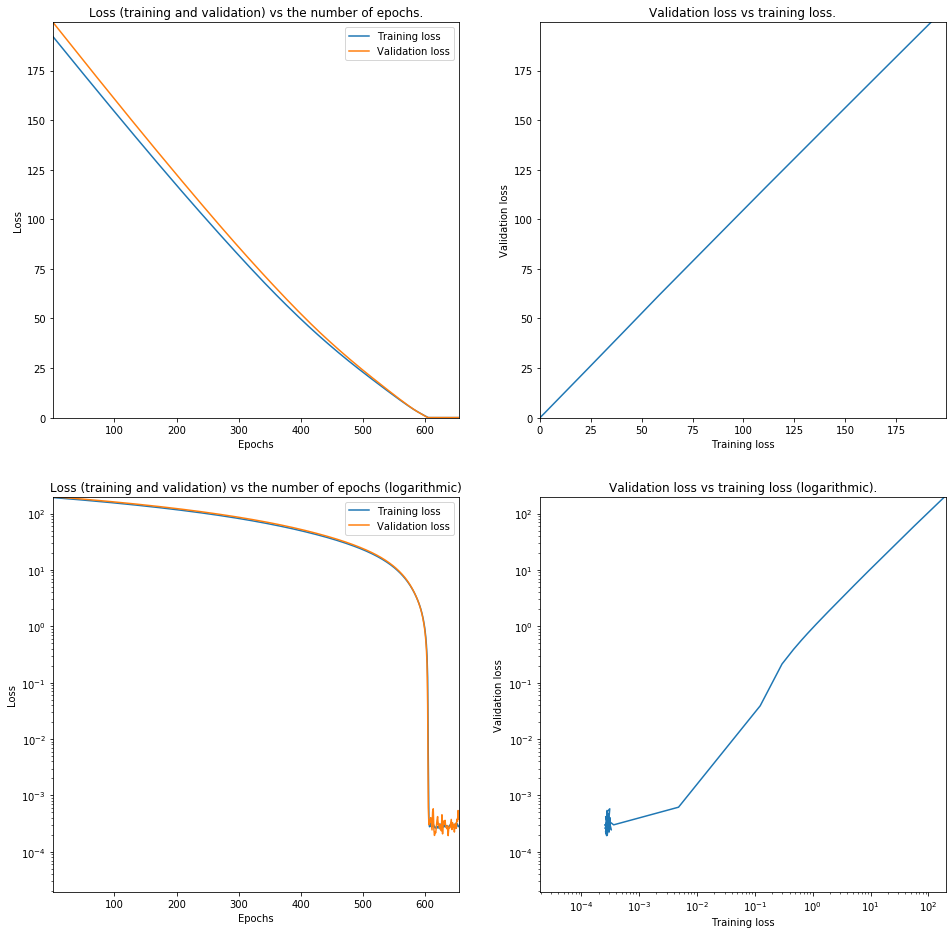

Amount of data 10000 Learning rate: 1e-05 Amount of epochs: 552 Final loss: 0.00028572002777918466


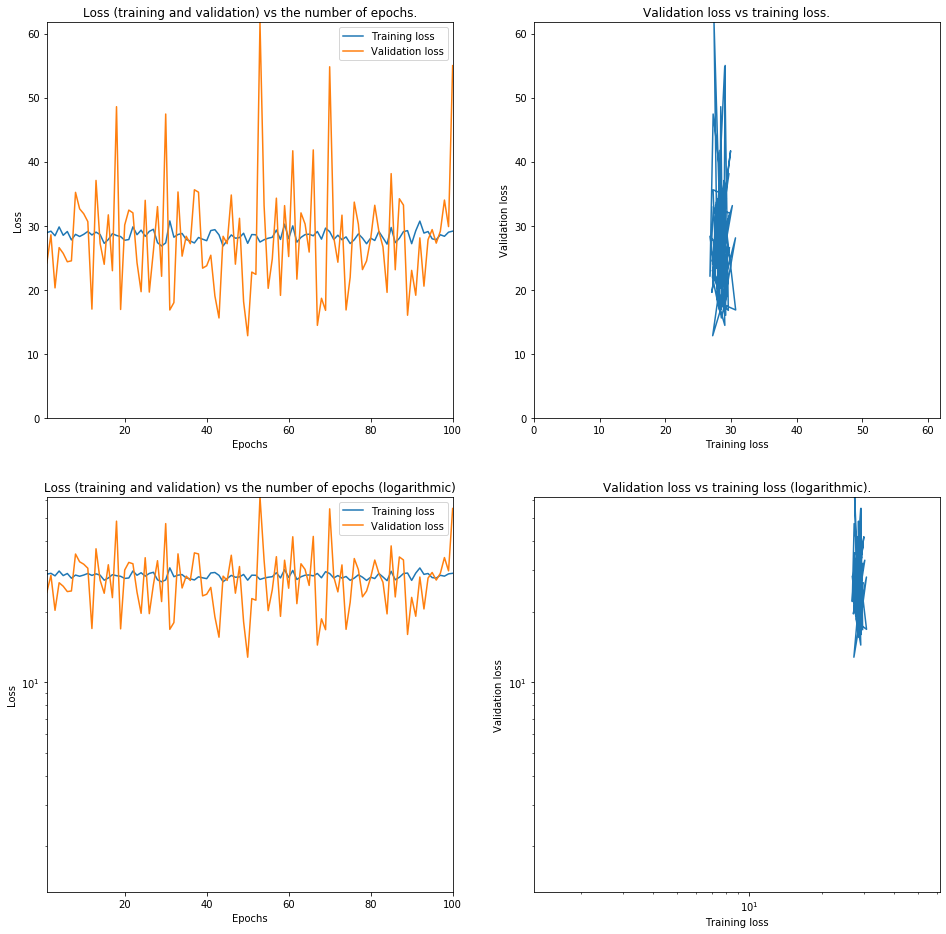

Amount of data 100000 Learning rate: 1.0 Amount of epochs: 35 Final loss: 28.468539921370525


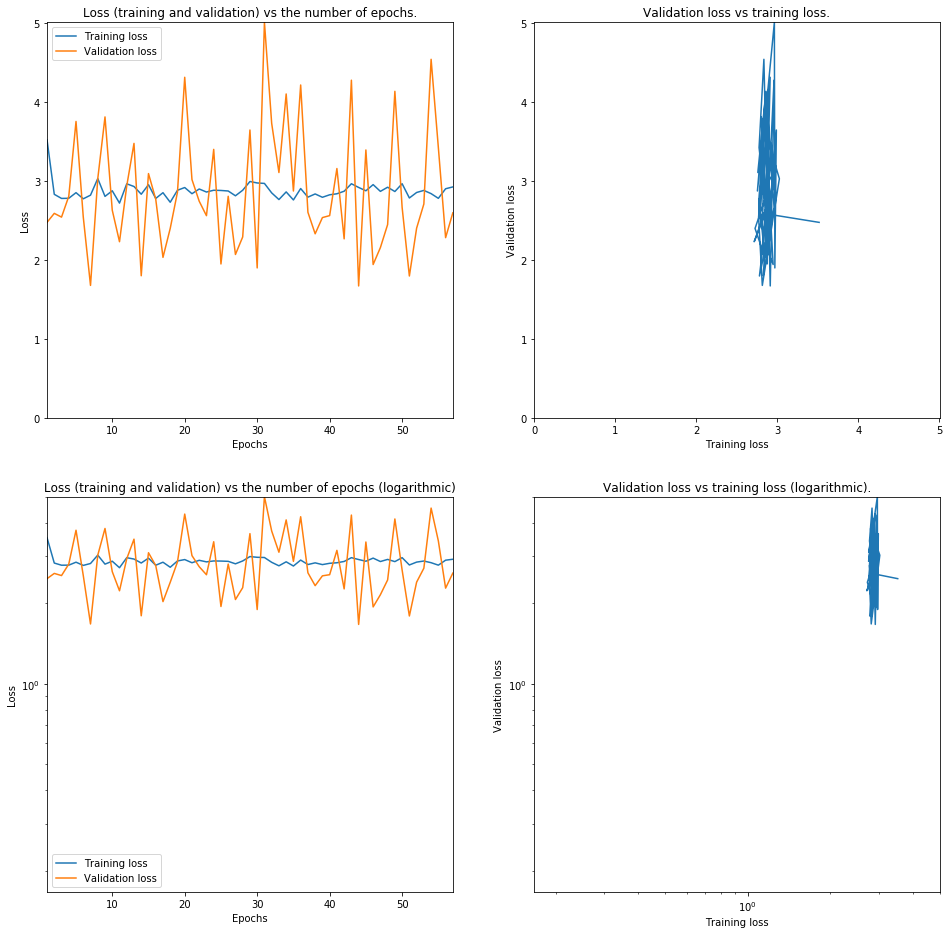

Amount of data 100000 Learning rate: 0.1 Amount of epochs: 22 Final loss: 2.8452907545442643


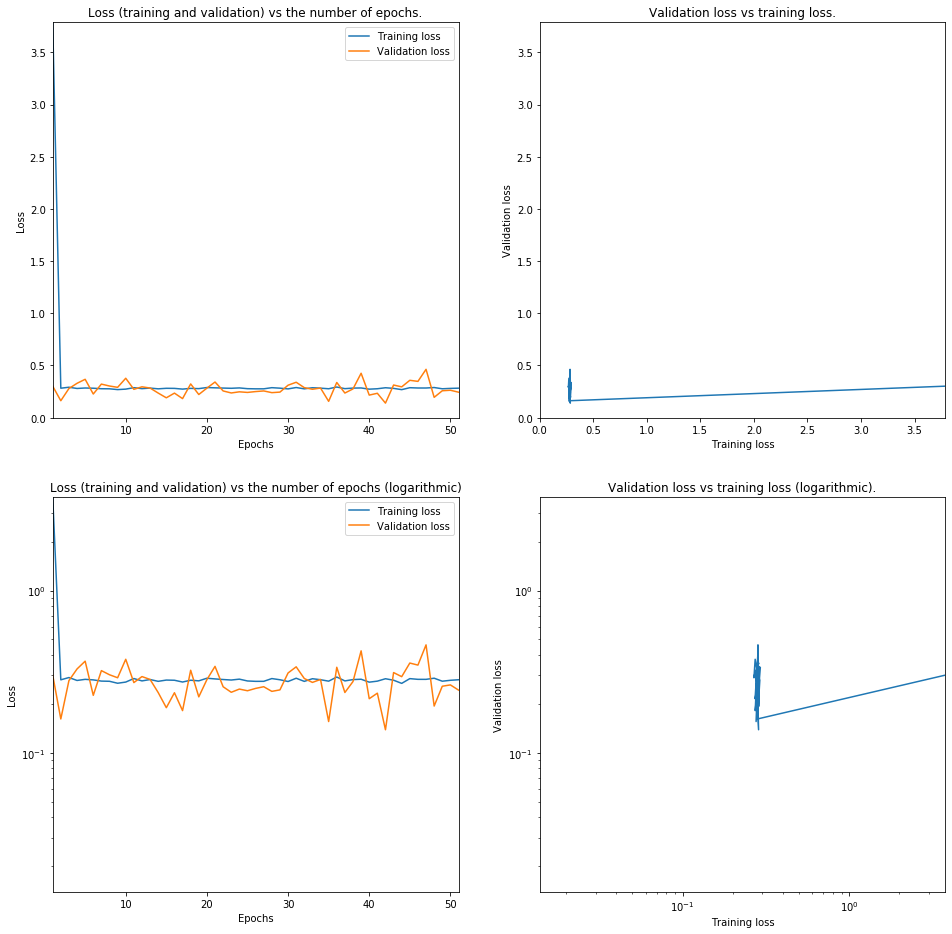

Amount of data 100000 Learning rate: 0.01 Amount of epochs: 1 Final loss: 0.28250174533082517


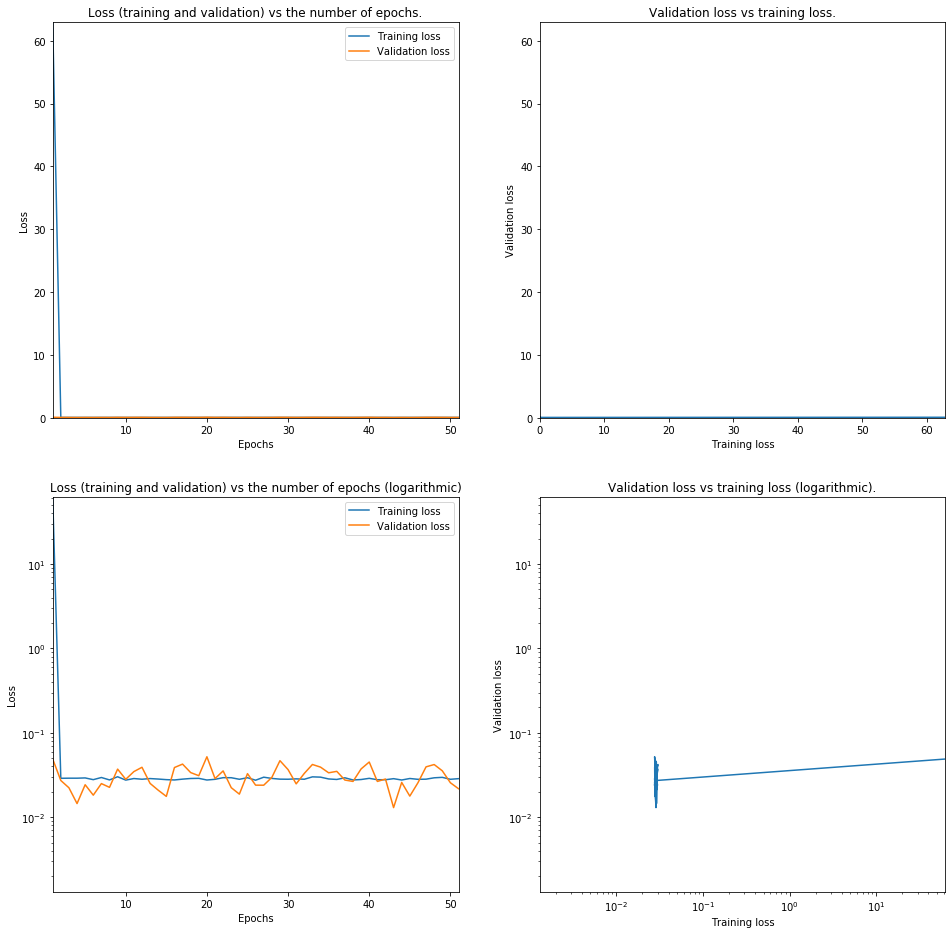

Amount of data 100000 Learning rate: 0.001 Amount of epochs: 1 Final loss: 0.028419242414077422


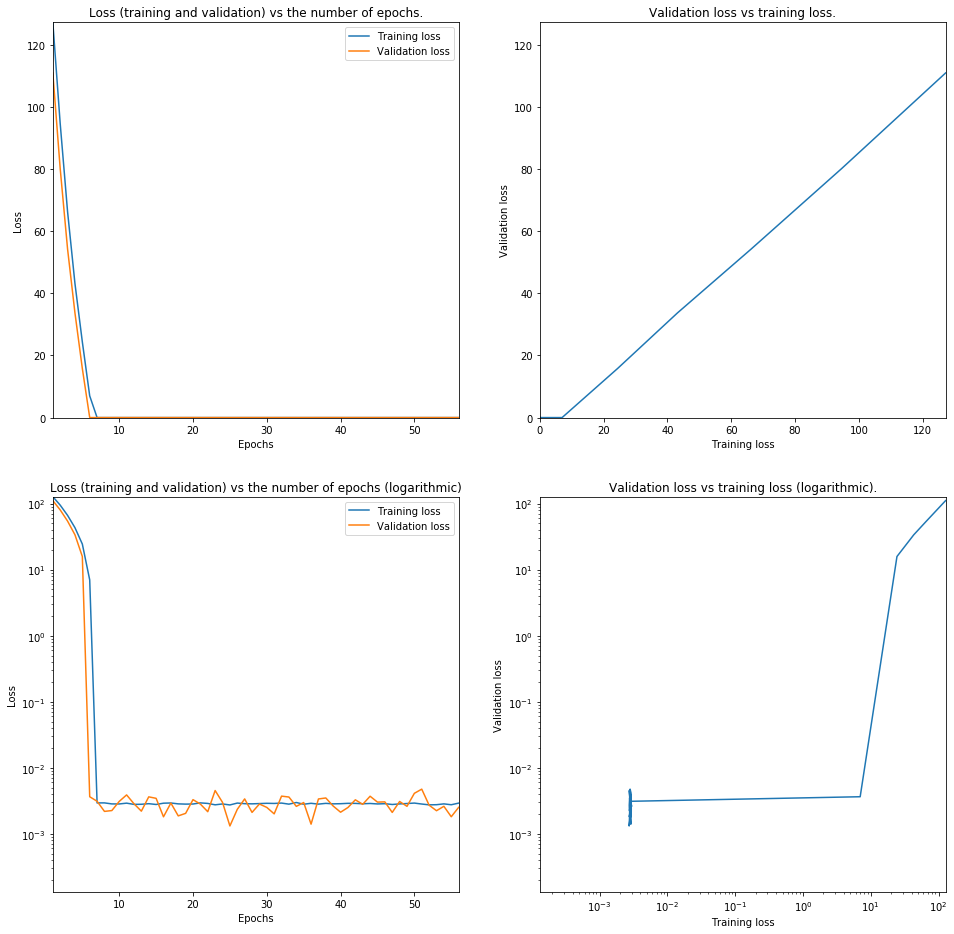

Amount of data 100000 Learning rate: 0.0001 Amount of epochs: 6 Final loss: 0.0028451666181250695


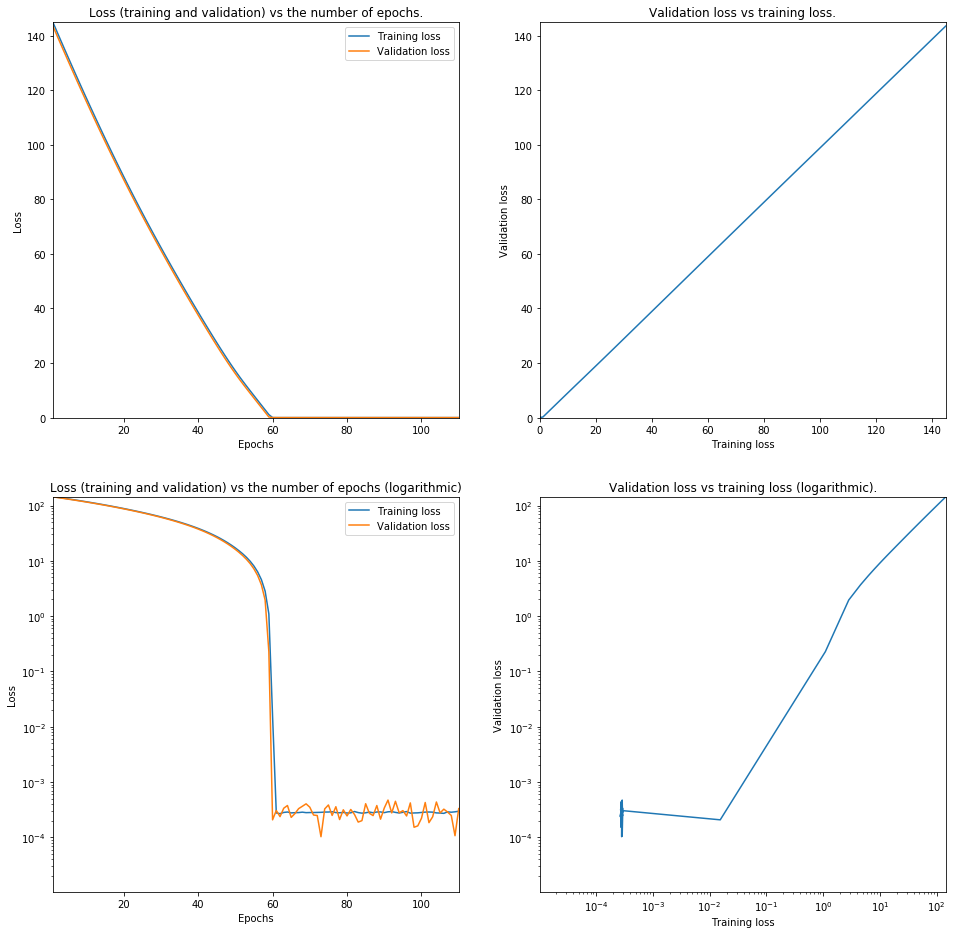

Amount of data 100000 Learning rate: 1e-05 Amount of epochs: 59 Final loss: 0.00028158899005177764


In [59]:
name = 'LinearNetwork'
settingsLineaerNet = [['Dense', 1, 'linear', False]]

maxEpochs = 10000

learningRate = []
amountOfData = []

repeat = 3
resulutionOfData = 3
resulutionOfLearning = 6

results = {'amountOfEpochs':[], 'finalLoss':[]}
for i in np.logspace(3, 5, resulutionOfData):
    i = math.ceil(i)
    amountOfData.append(i)
    
    resultsEpochs = []
    resultsLoss = []
    
    learningRateTemp = []
    
    for j in np.logspace(0, -5, resulutionOfLearning):
        learningRateTemp.append(j)
        
        resultsLossTemp = []
        resultsEpochsTemp = []
        
        
        for re in range(repeat):
            dataPointsX, dataPointsY = makeRandomNumberDatabaseSum(math.ceil(i/0.9), 8, 10*7)
            model = makeDenseNetwork(8, settingsLineaerNet, j, kernalInitializer='he_uniform', lossFunction=MAE)
            earlyStop = keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=50, min_delta=2*10**-1)
            fitDetails = model.fit(dataPointsX, dataPointsY, epochs=maxEpochs, validation_split=0.1, verbose=0, callbacks=[earlyStop])
            loss = fitDetails.history['loss']
            resultsEpochsTemp.append(len(fitDetails.history['loss'])-50)
            resultsLossTemp.append(np.mean([loss[-k] for k in range(1, 50)]))
            
            
        history = plotHistory(fitDetails)
        resultsEpochs.append(math.ceil(np.mean(resultsEpochsTemp)))
        resultsLoss.append(np.mean(resultsLossTemp))
        
        print('Amount of data', math.ceil(i), 'Learning rate:', j, 'Amount of epochs:', resultsEpochs[-1], 'Final loss:', resultsLoss[-1])
    
    results['amountOfEpochs'].append(resultsEpochs)
    results['finalLoss'].append(resultsLoss)
    learningRate.append(learningRateTemp)



Dataset of size 1000
[1.0, 0.1, 0.01, 0.001, 0.0001, 1e-05]
[60, 55, 11, 58, 510, 5737]
[30.682064731312447, 2.994861849408571, 0.3246500129063113, 0.03224874084620249, 0.003492409687514613, 0.004902227635222937]


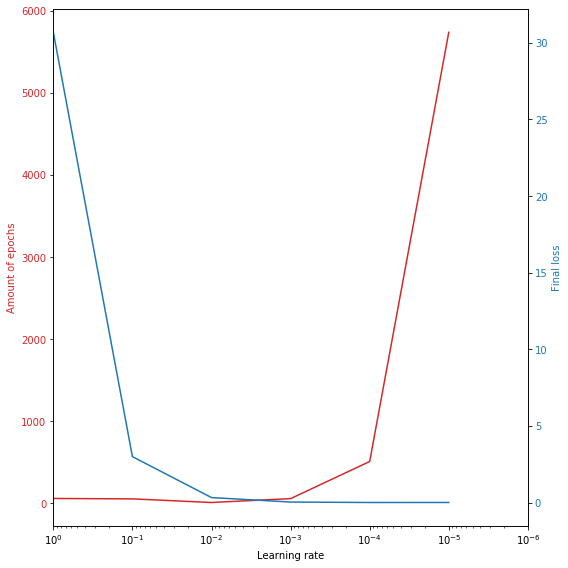

Dataset of size 10000
[1.0, 0.1, 0.01, 0.001, 0.0001, 1e-05]
[59, 23, 18, 6, 53, 552]
[28.54371840056854, 2.895576317818311, 0.2848009645123871, 0.02856469905297367, 0.0028652028675501544, 0.00028572002777918466]


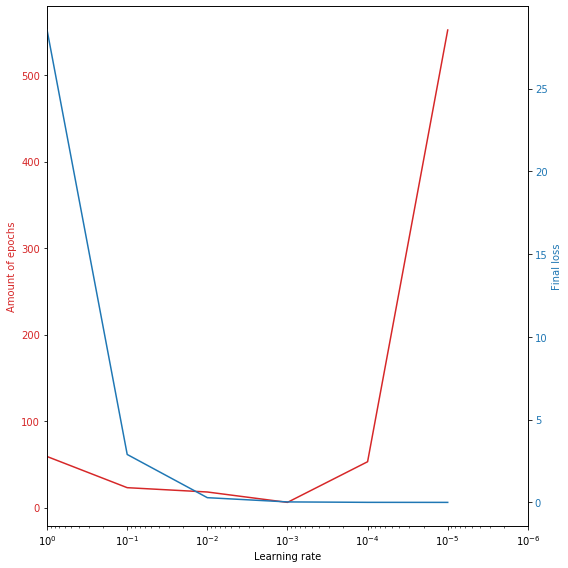

Dataset of size 100000
[1.0, 0.1, 0.01, 0.001, 0.0001, 1e-05]
[35, 22, 1, 1, 6, 59]
[28.468539921370525, 2.8452907545442643, 0.28250174533082517, 0.028419242414077422, 0.0028451666181250695, 0.00028158899005177764]


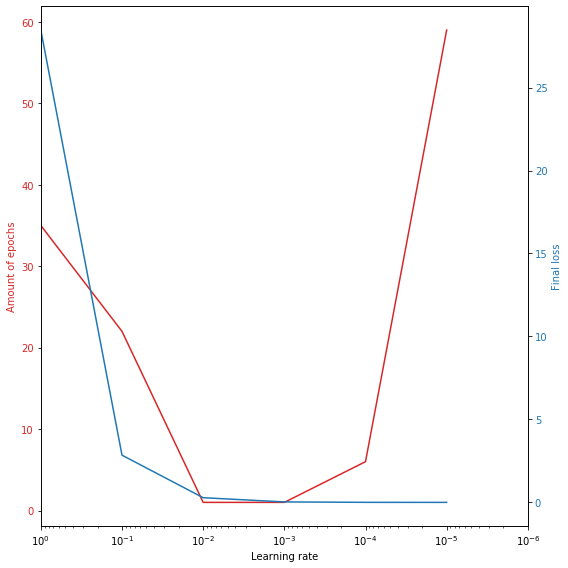

In [60]:
for i in range(0, len(amountOfData)):
    print('Dataset of size', amountOfData[i])
    print(learningRate[i])
    print(results['amountOfEpochs'][i])
    print(results['finalLoss'][i])
    fig, ax1 = plt.subplots(figsize=(8, 8))
    color = 'tab:red'
    ax1.set_xlabel('Learning rate')
    ax1.set_xscale('log')
    ax1.set_xlim(10**0, 10**-6)
    ax1.set_ylabel('Amount of epochs', color=color)
    ax1.plot(learningRate[i], results['amountOfEpochs'][i], color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel('Final loss', color=color)  # we already handled the x-label with ax1
    ax2.plot(learningRate[i], results['finalLoss'][i], color=color)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

## Testing optimizers on real data

Optimizer: 0 learning rate: 0.0001


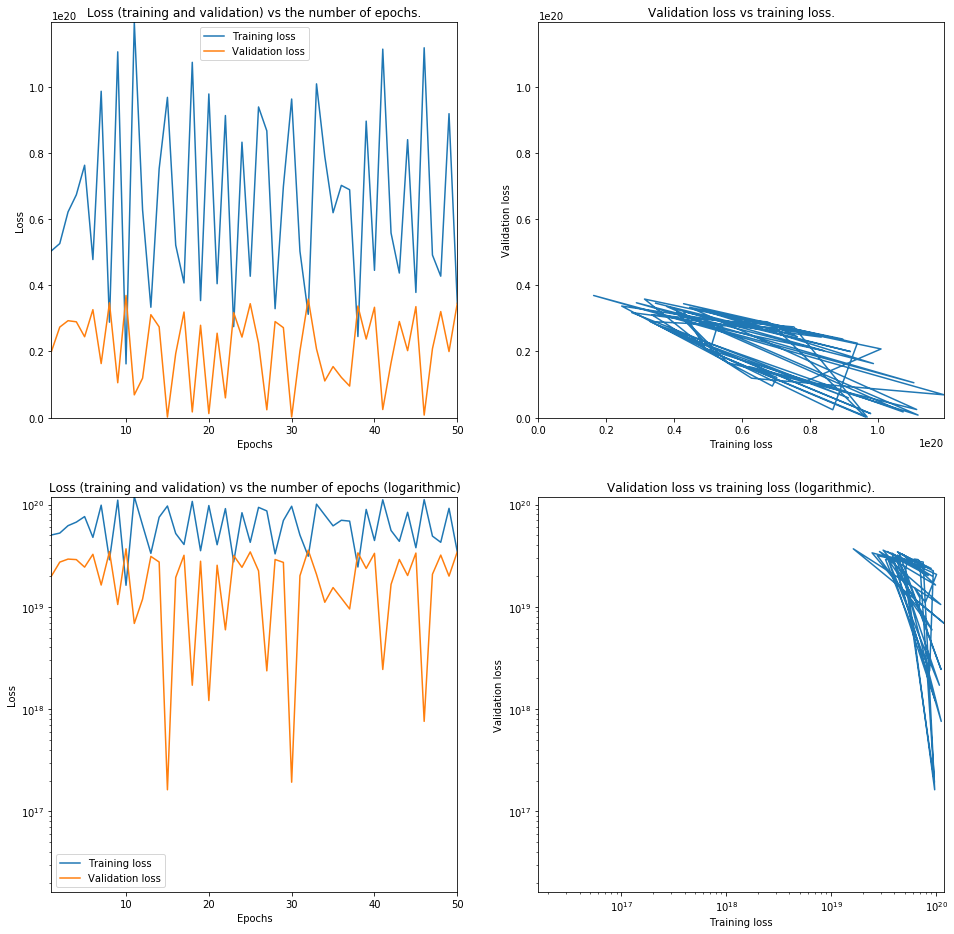

Optimizer: 0 learning rate: 3.1622776601683795e-05


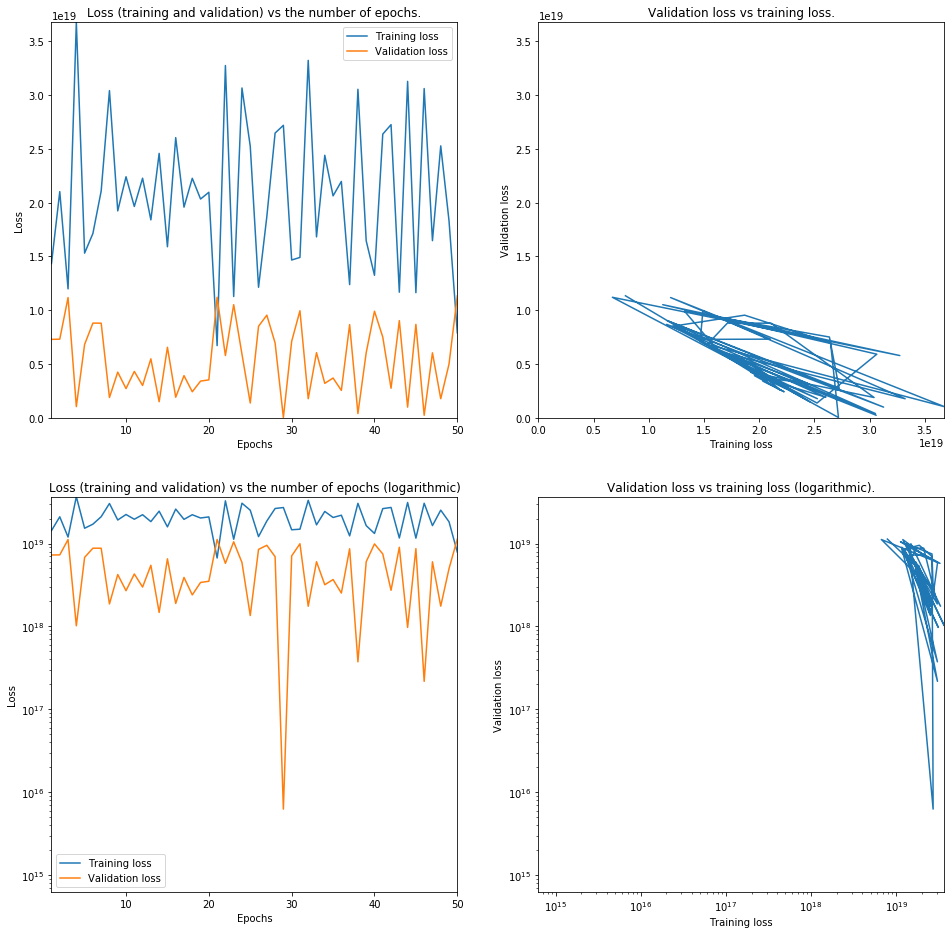

Optimizer: 0 learning rate: 1e-05


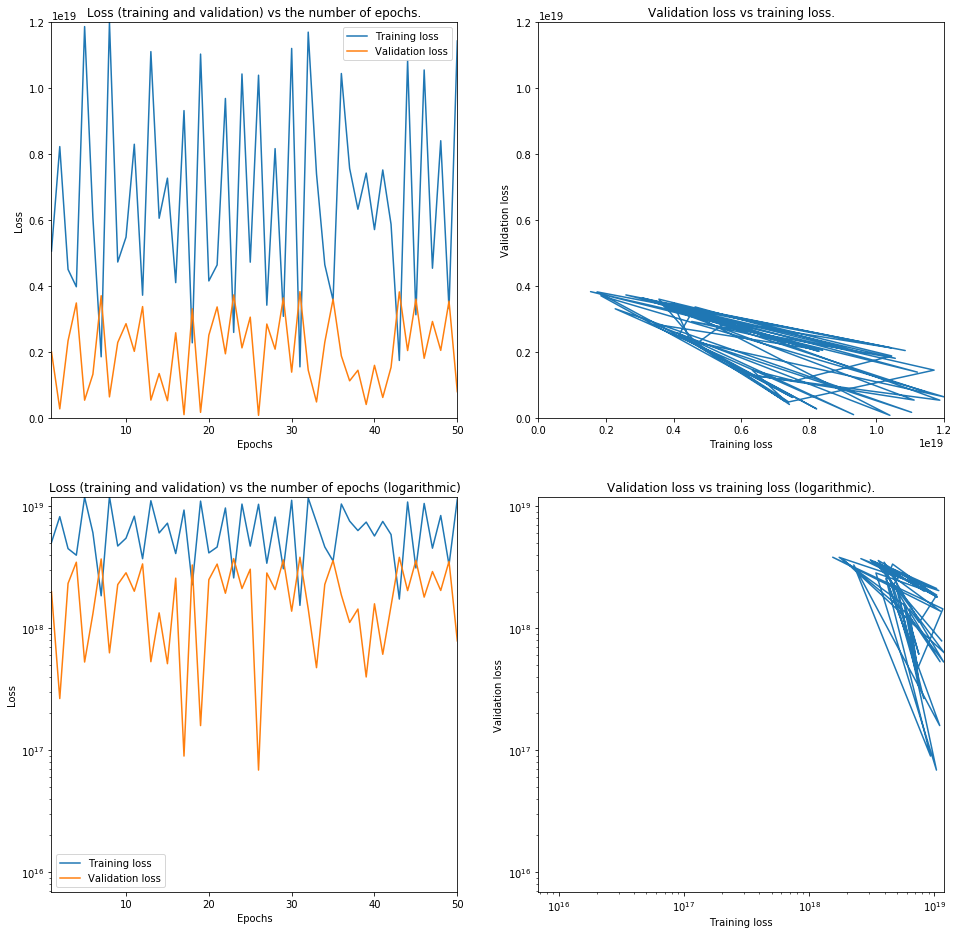

Optimizer: 0 learning rate: 3.162277660168379e-06


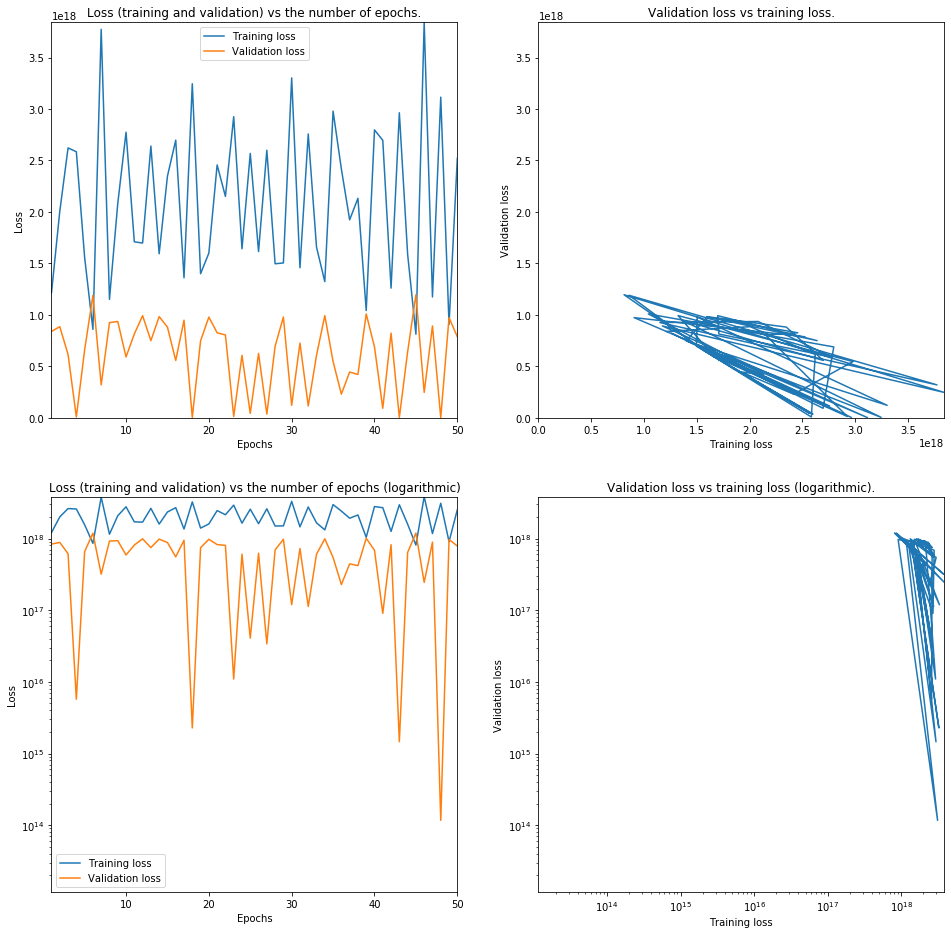

Optimizer: 0 learning rate: 1e-06


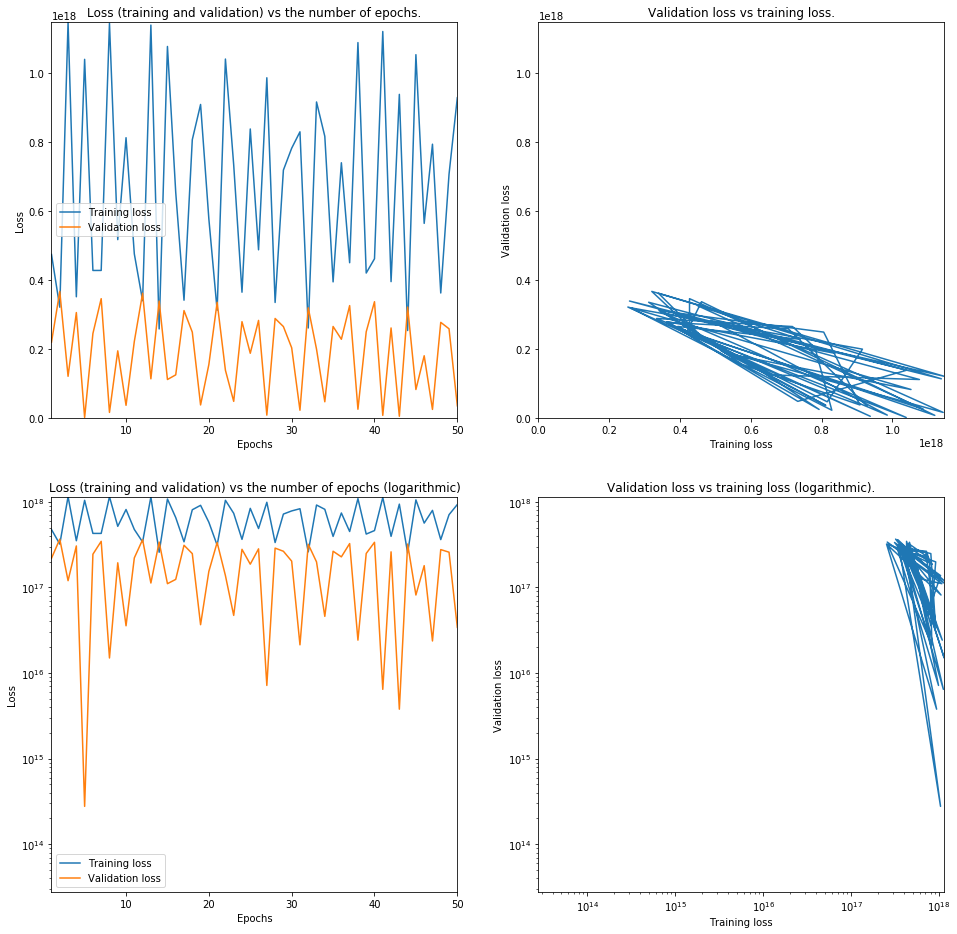

Optimizer: 0 learning rate: 3.162277660168379e-07


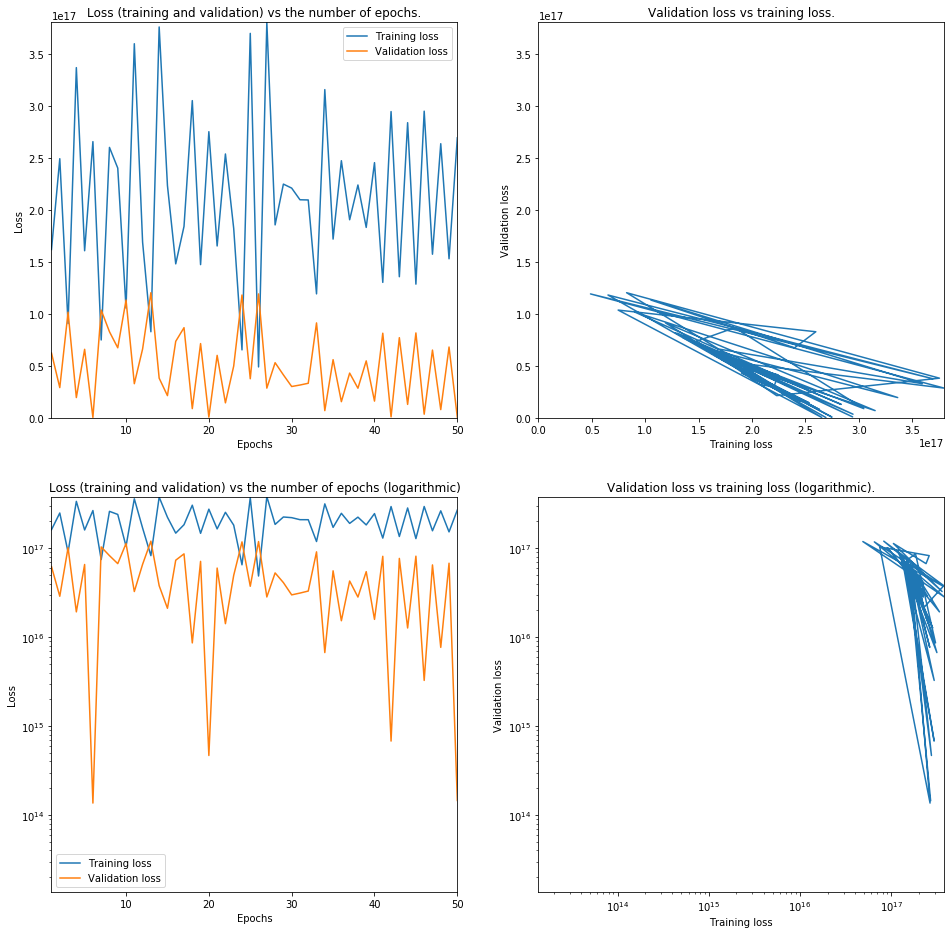

Optimizer: 0 learning rate: 1e-07


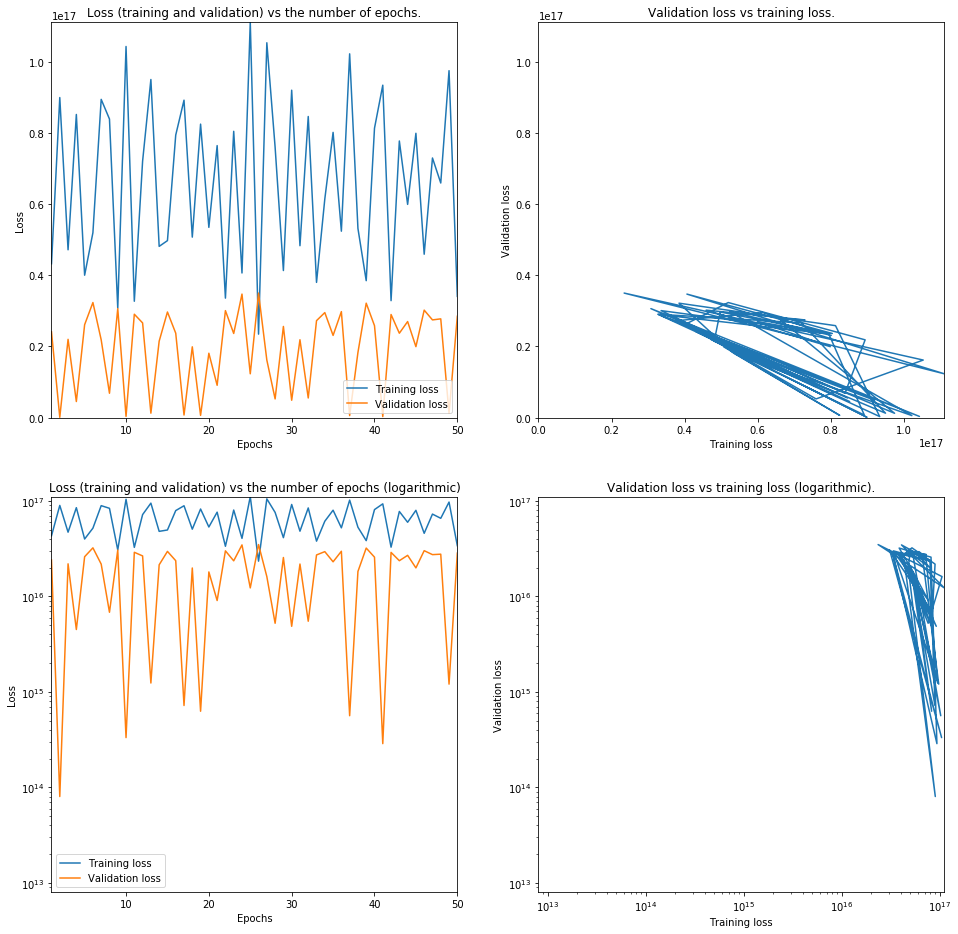

Optimizer: 0 learning rate: 3.162277660168379e-08


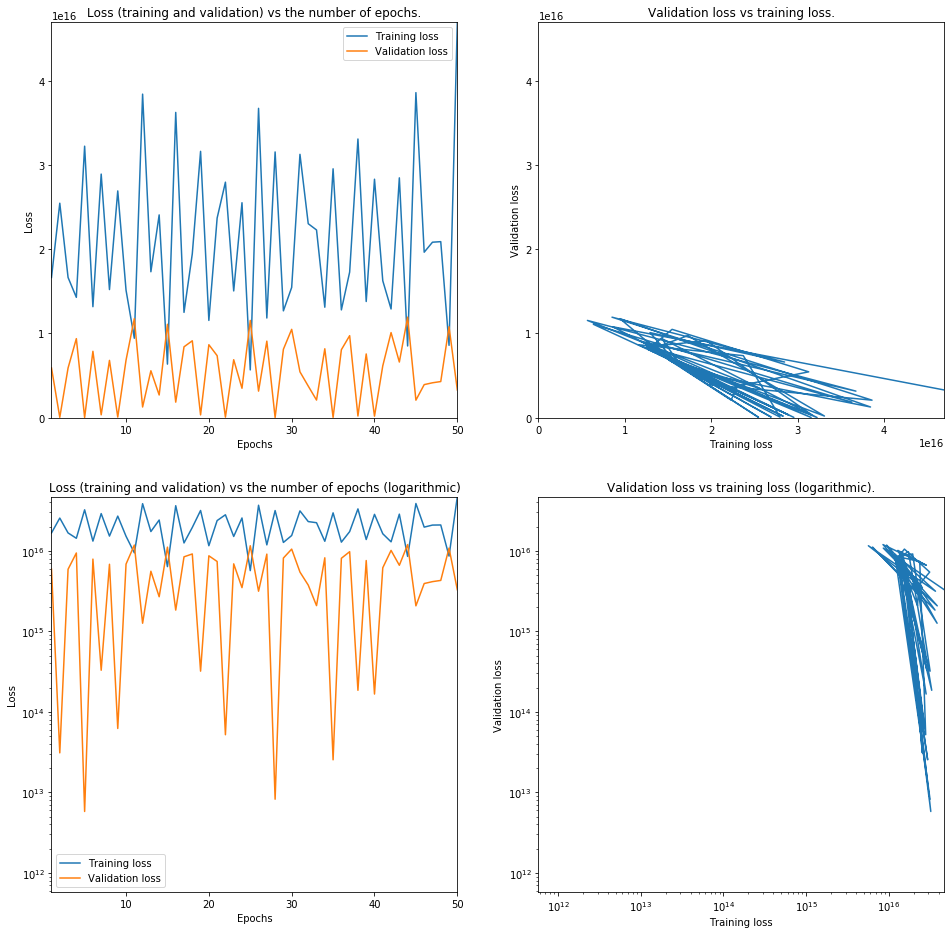

Optimizer: 0 learning rate: 1e-08


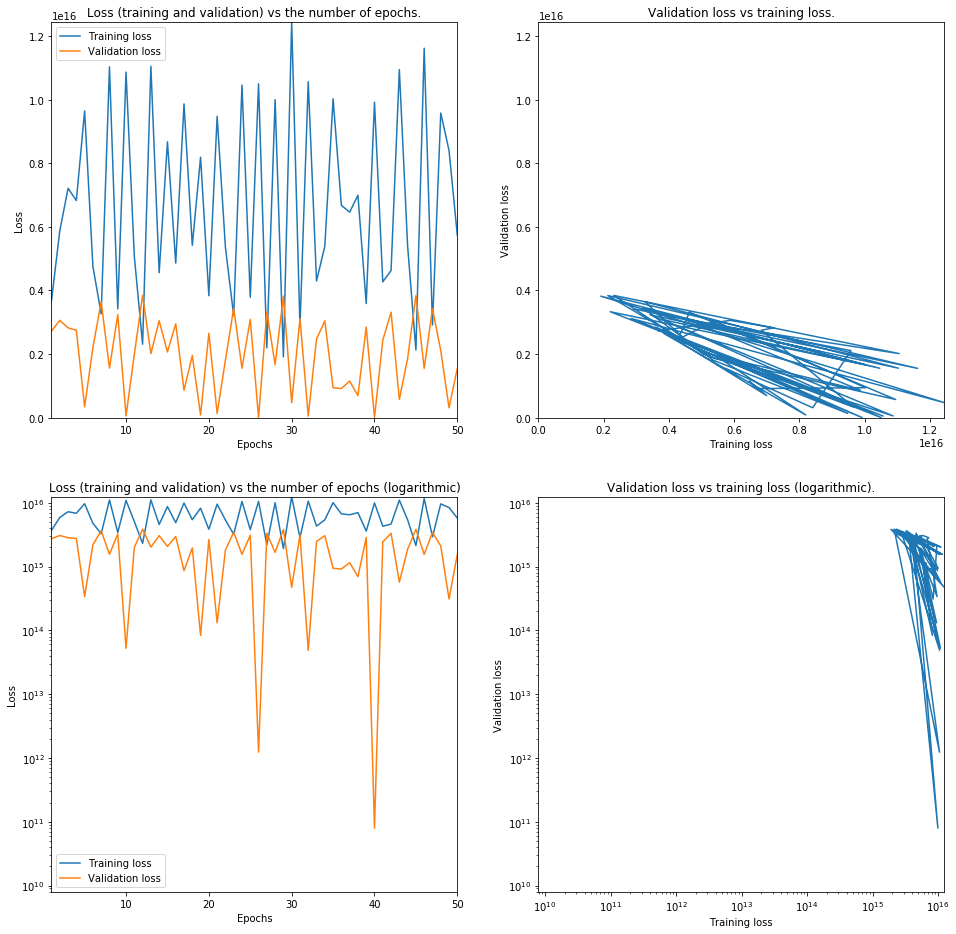

Optimizer: 1 learning rate: 0.0001


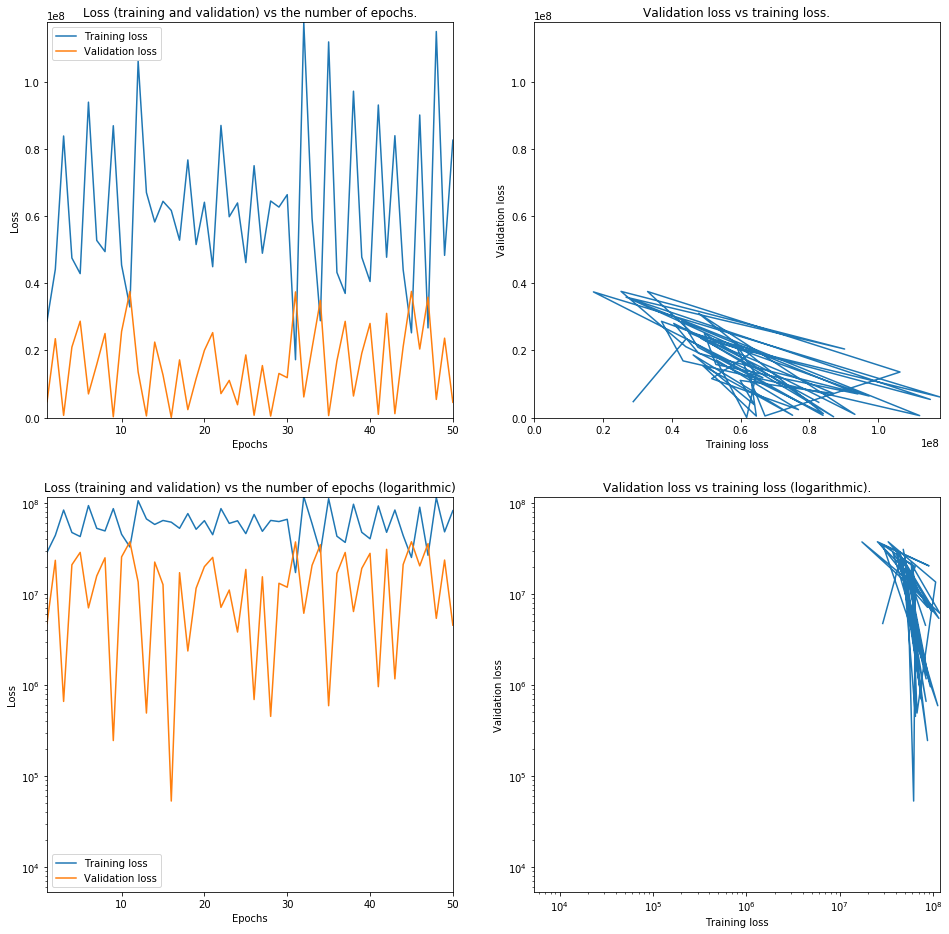

Optimizer: 1 learning rate: 3.1622776601683795e-05


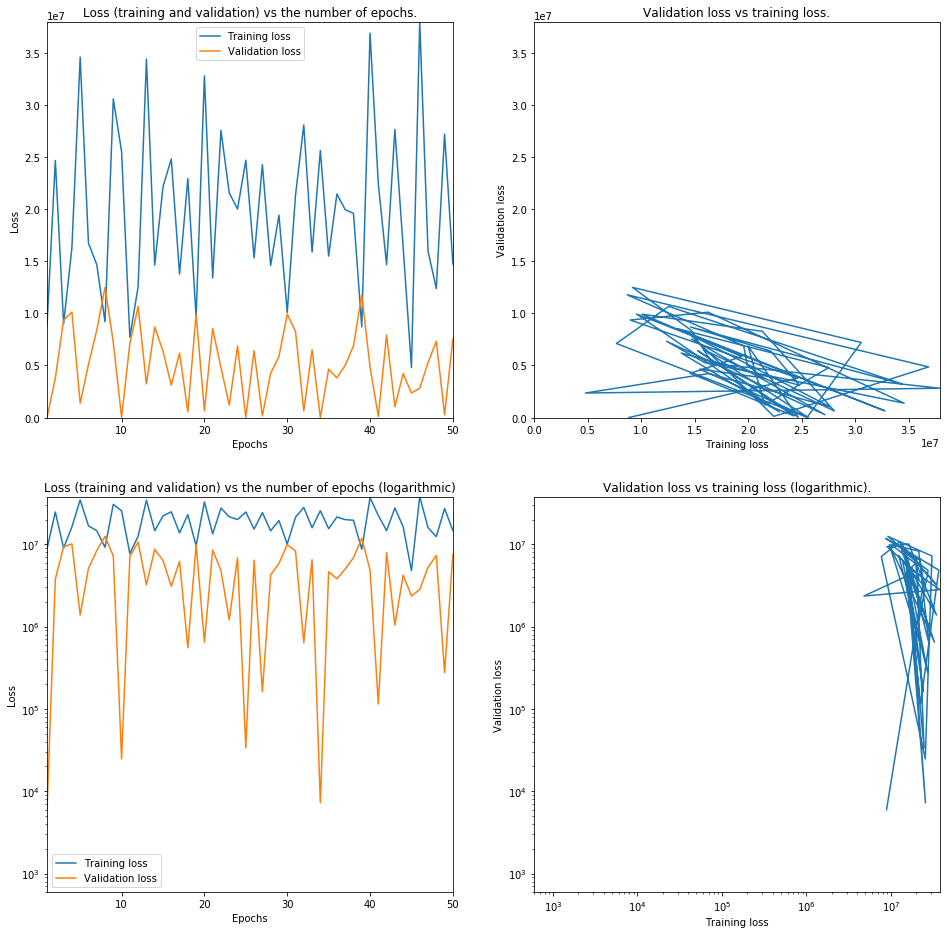

Optimizer: 1 learning rate: 1e-05


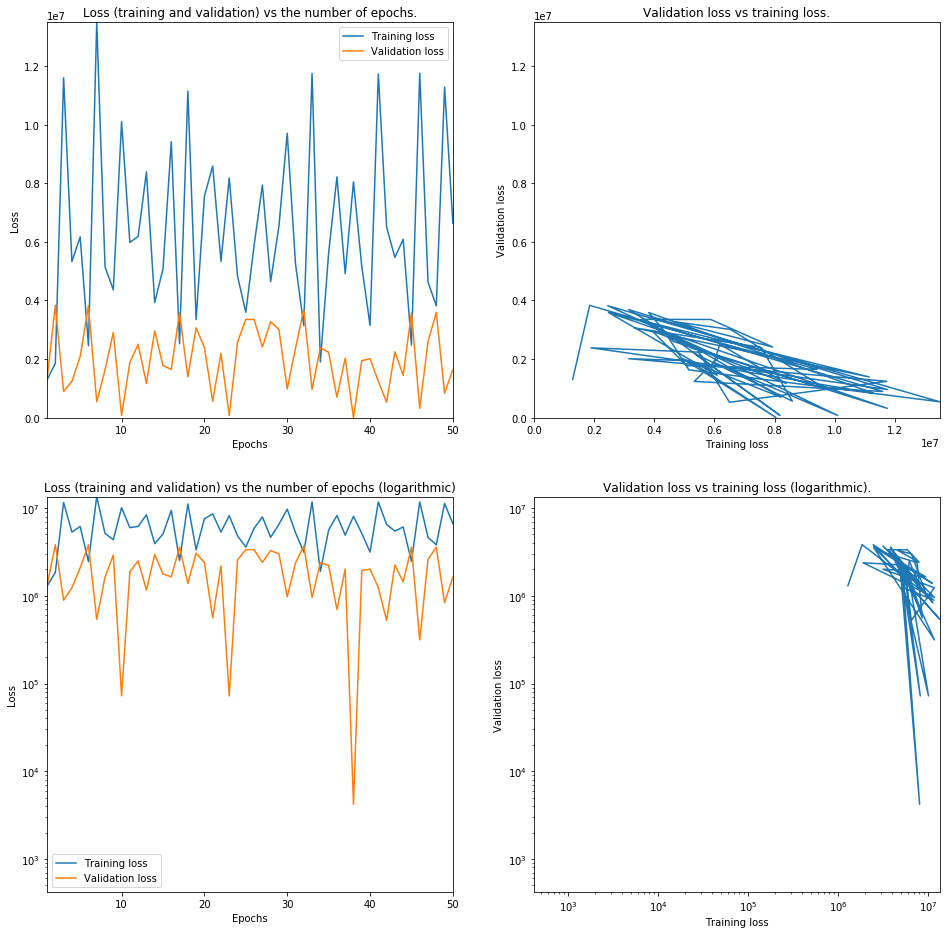

Optimizer: 1 learning rate: 3.162277660168379e-06


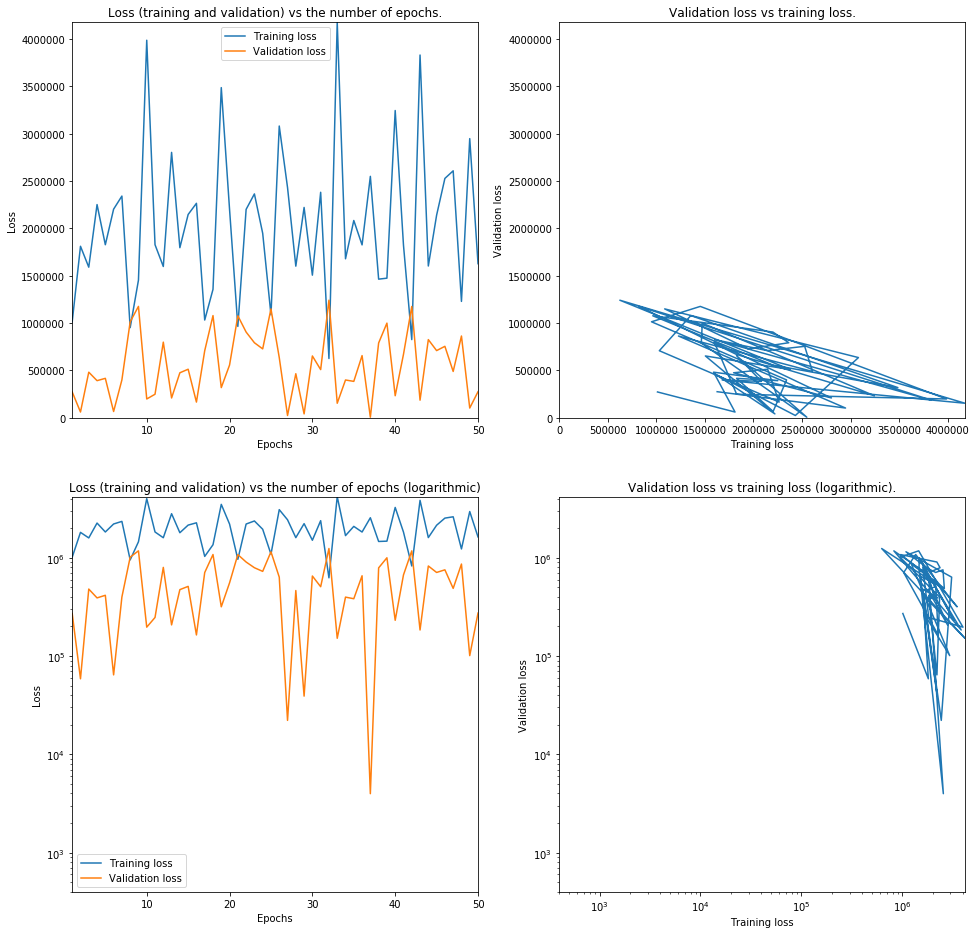

Optimizer: 1 learning rate: 1e-06


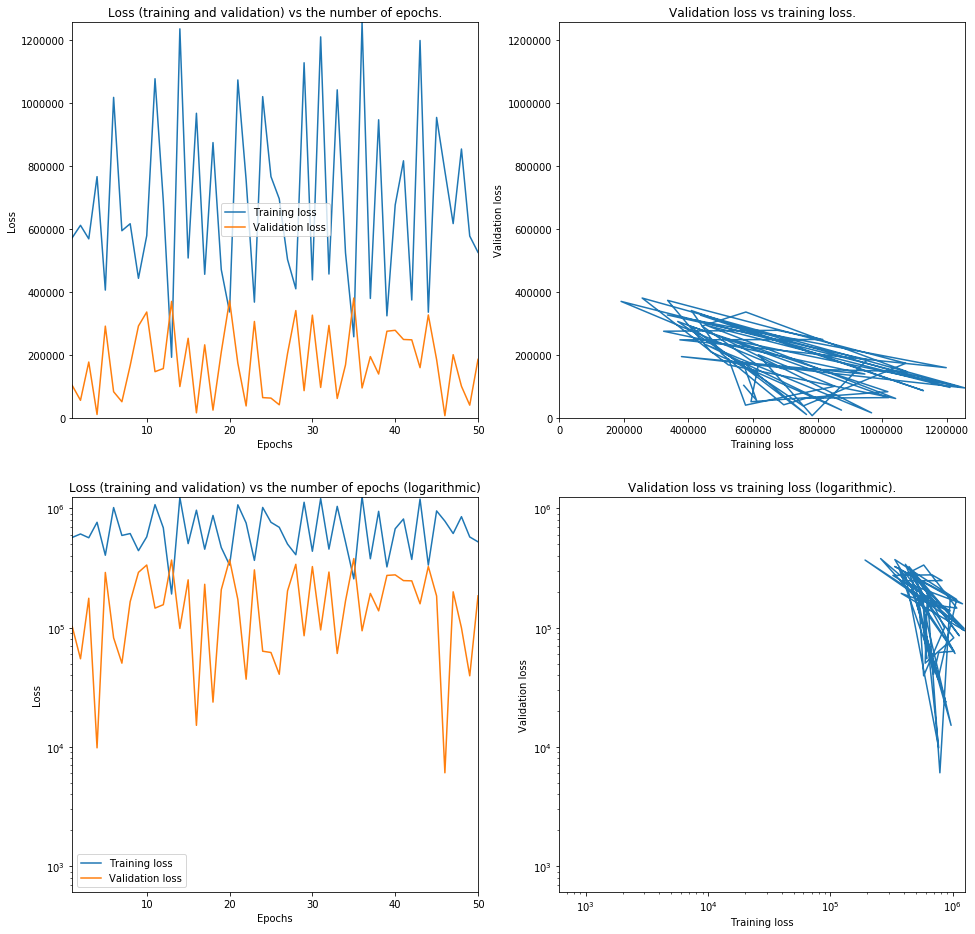

Optimizer: 1 learning rate: 3.162277660168379e-07


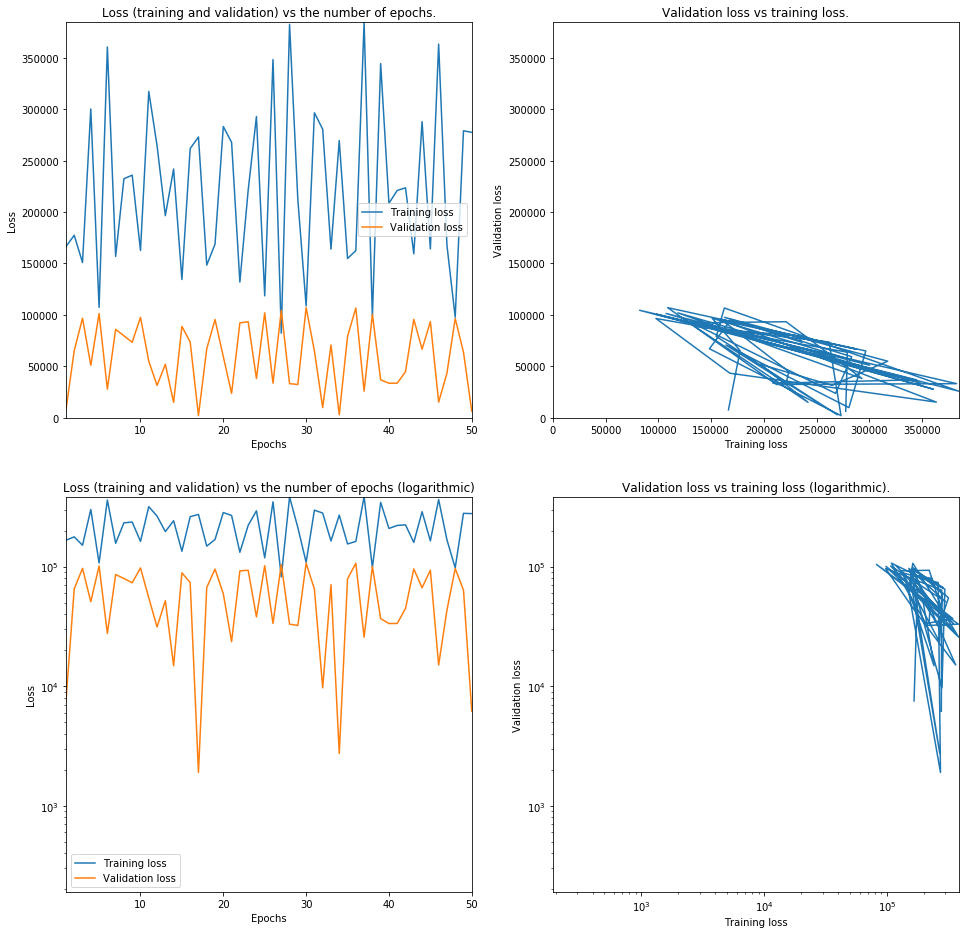

Optimizer: 1 learning rate: 1e-07


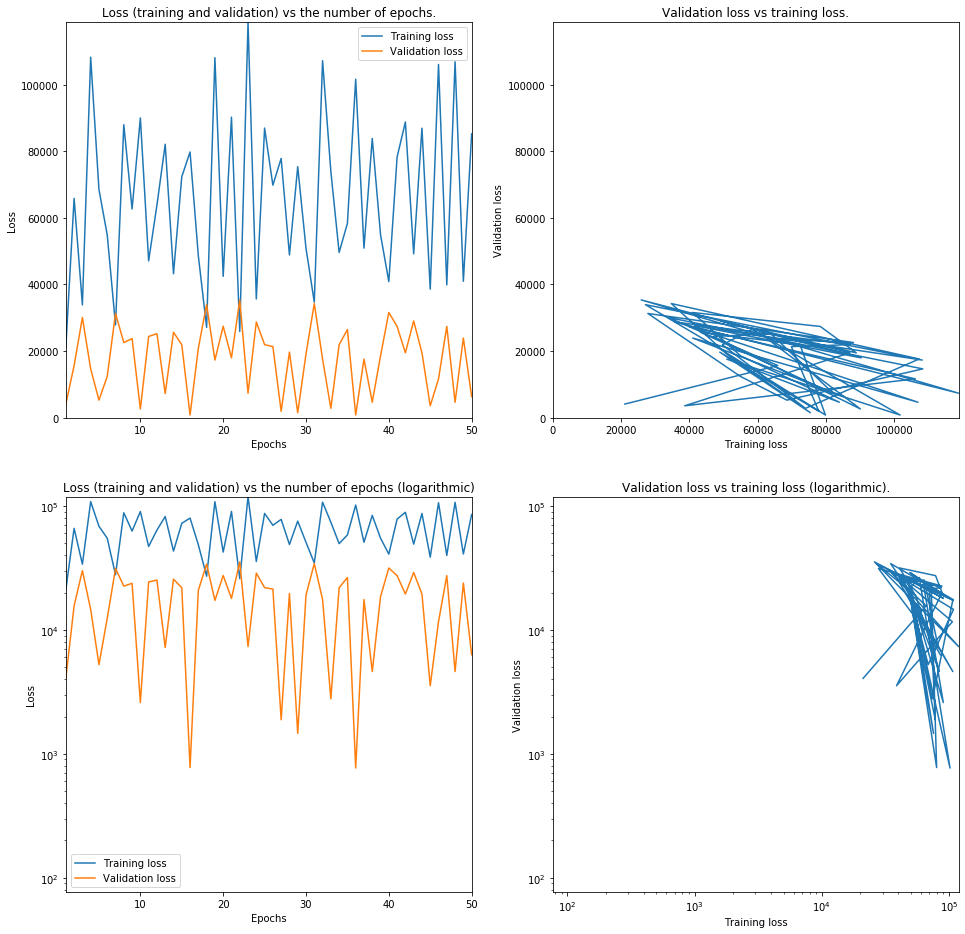

Optimizer: 1 learning rate: 3.162277660168379e-08


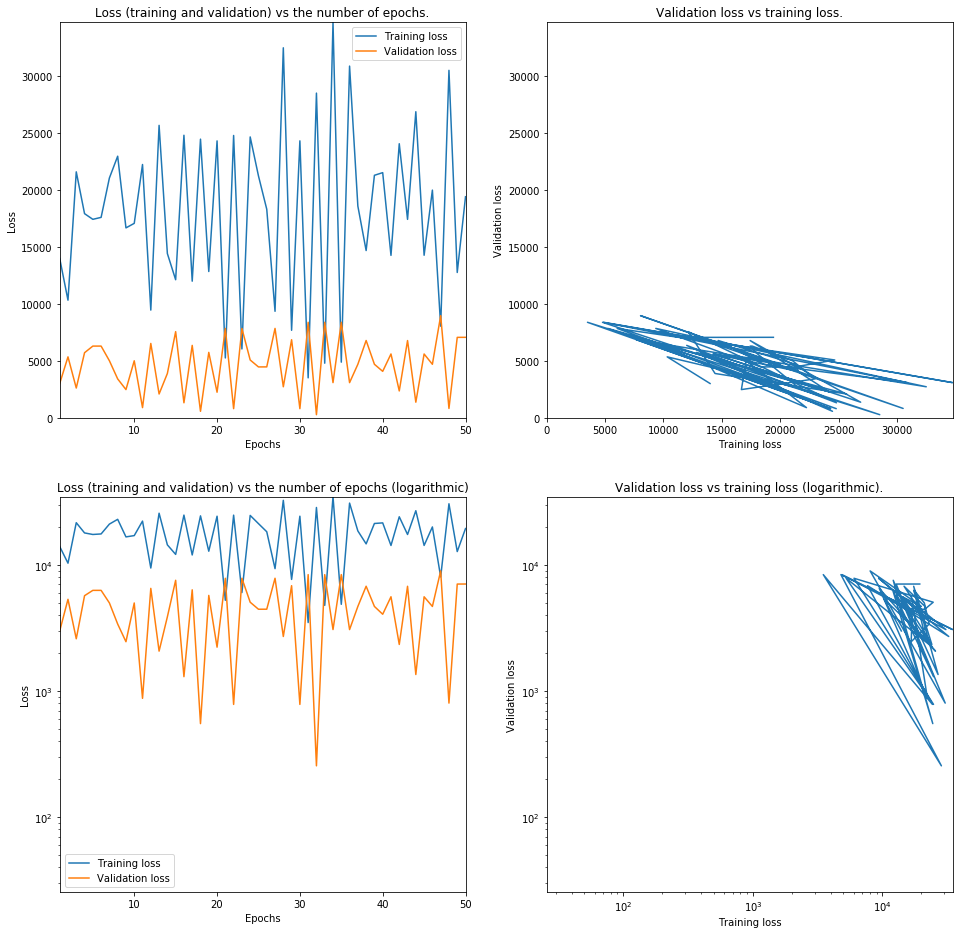

Optimizer: 1 learning rate: 1e-08


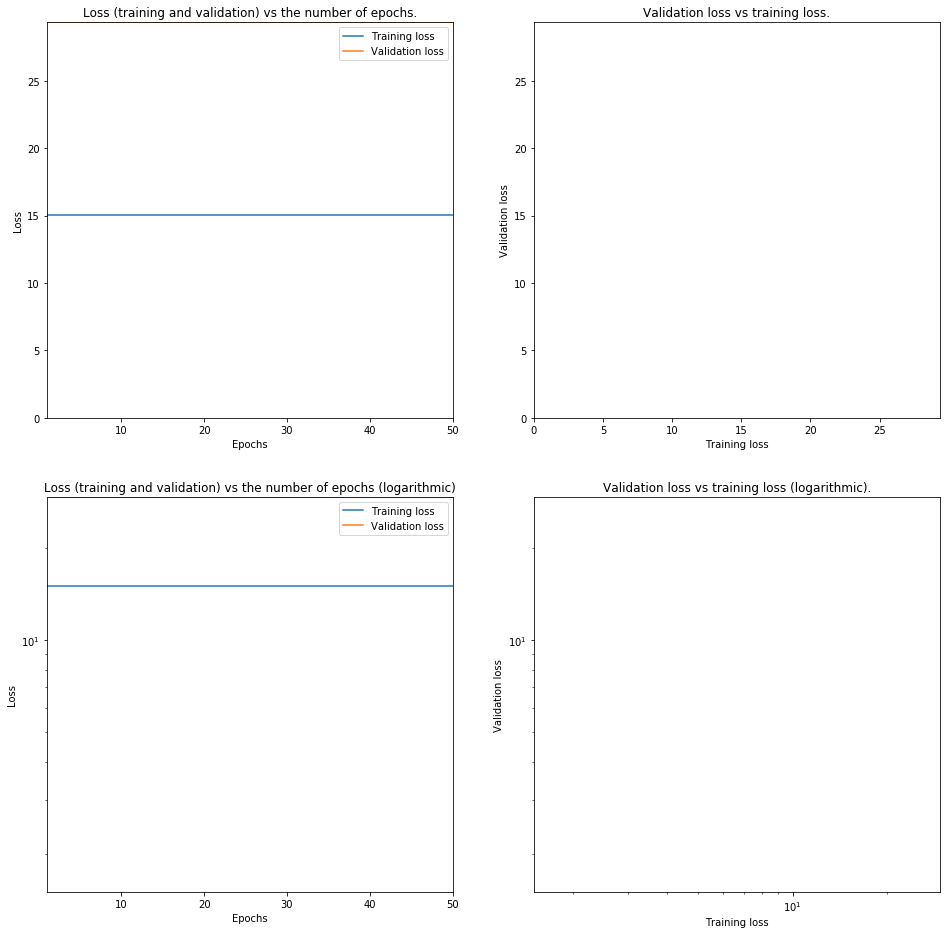

Optimizer: 2 learning rate: 0.0001


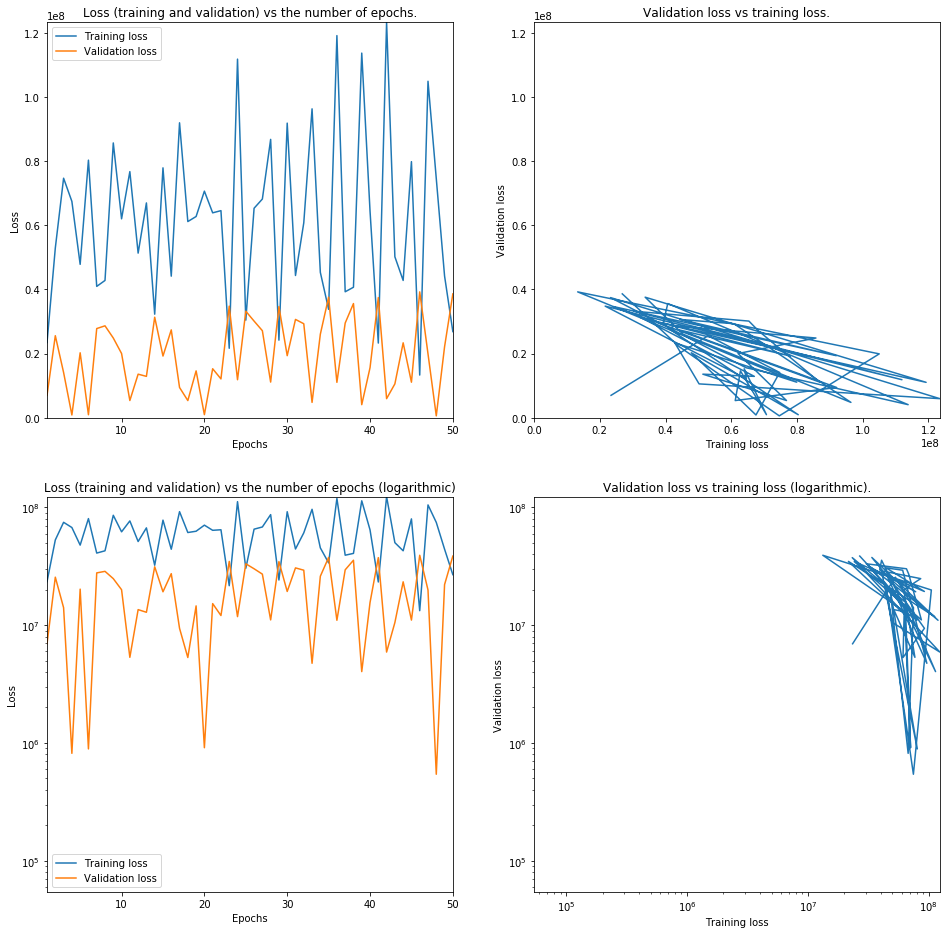

Optimizer: 2 learning rate: 3.1622776601683795e-05


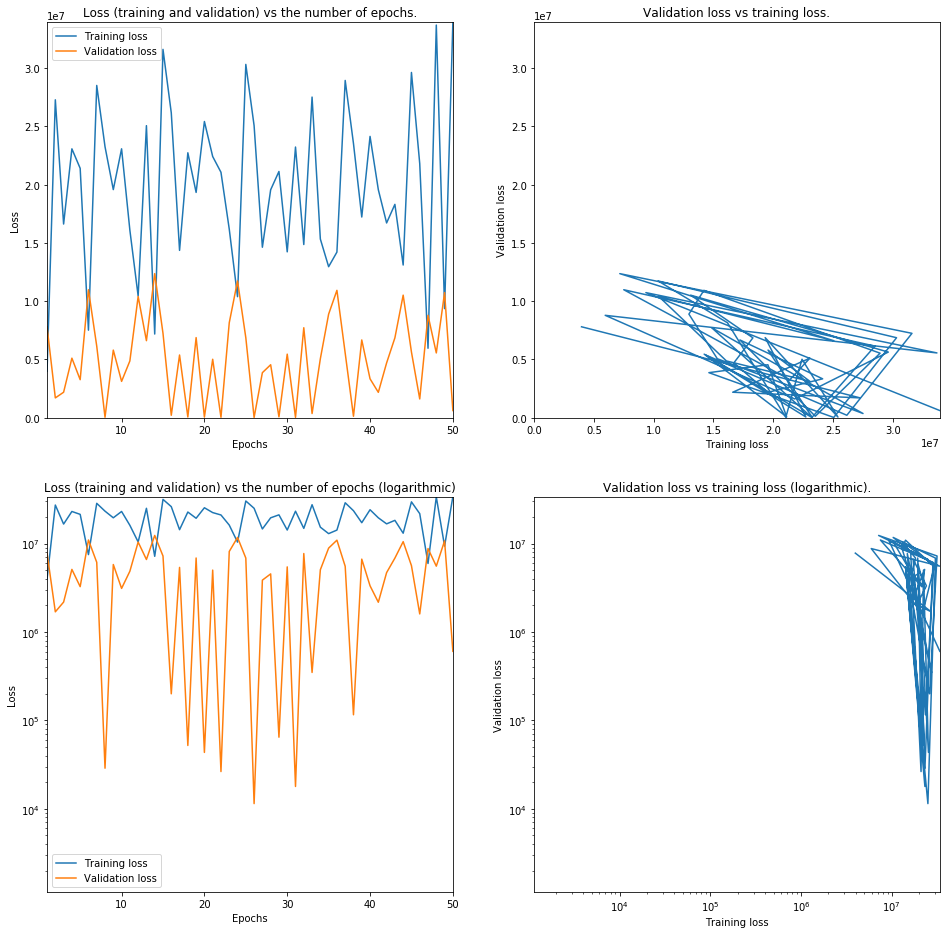

Optimizer: 2 learning rate: 1e-05


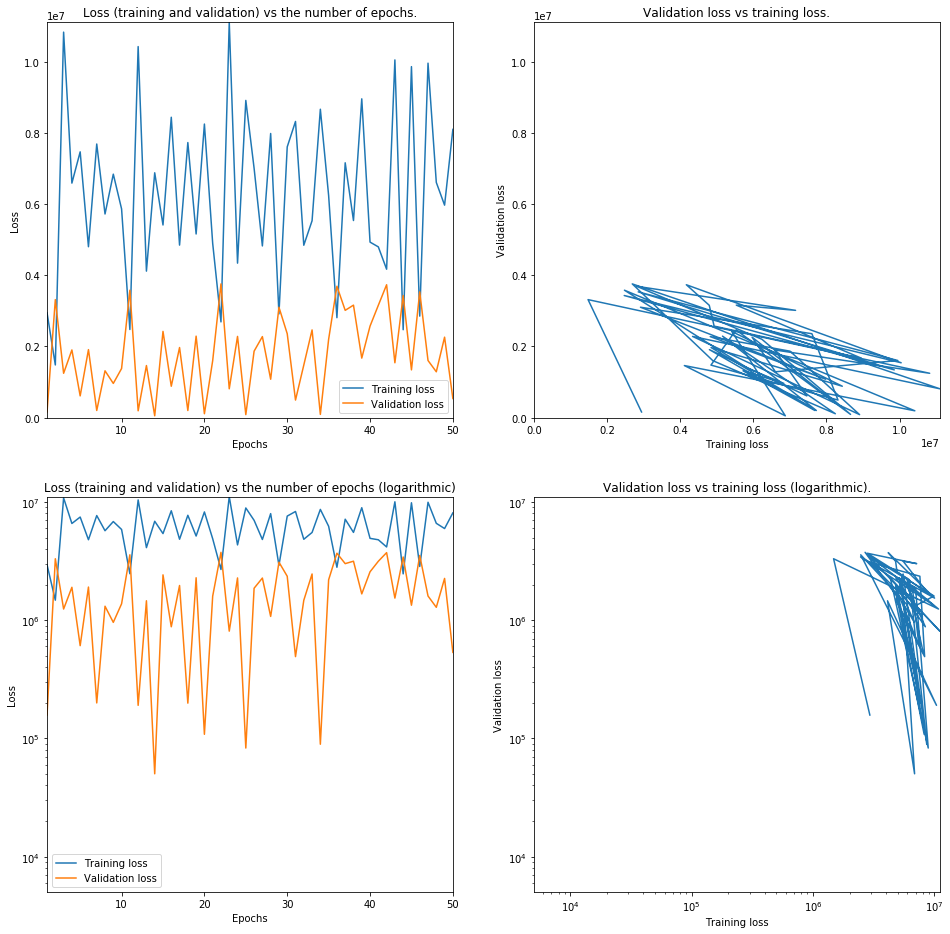

Optimizer: 2 learning rate: 3.162277660168379e-06


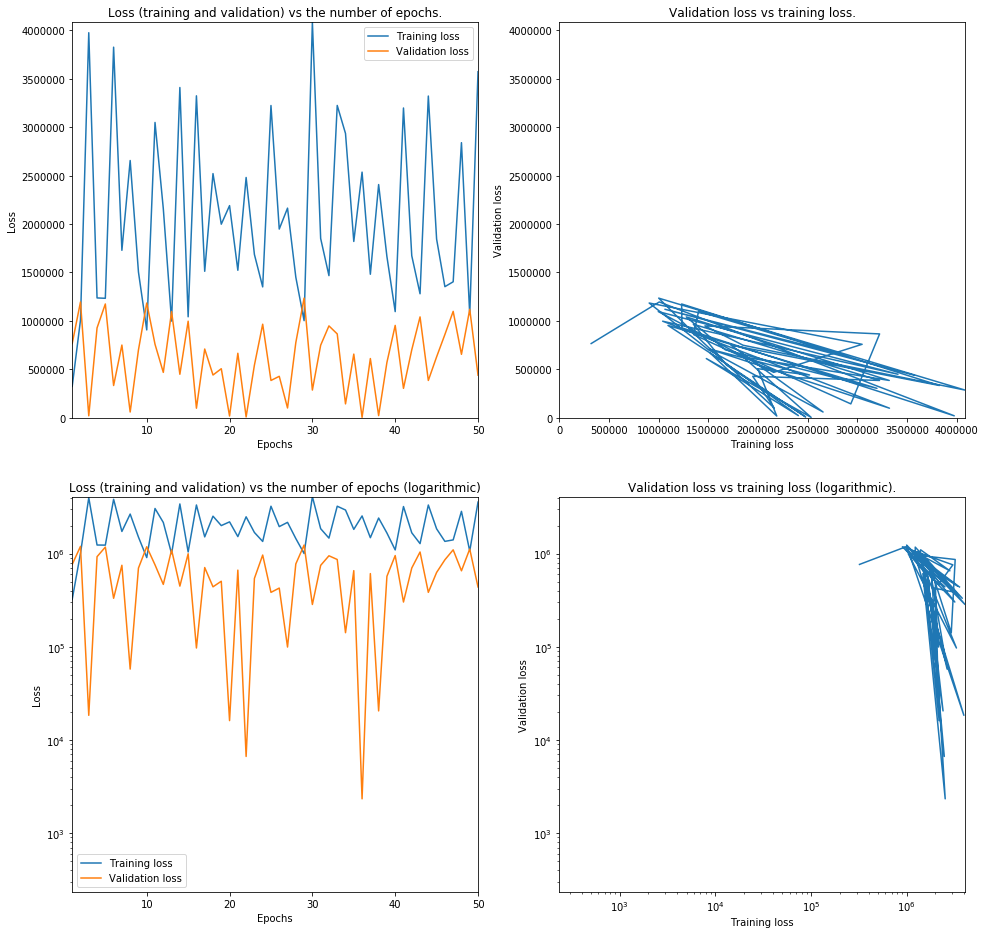

Optimizer: 2 learning rate: 1e-06


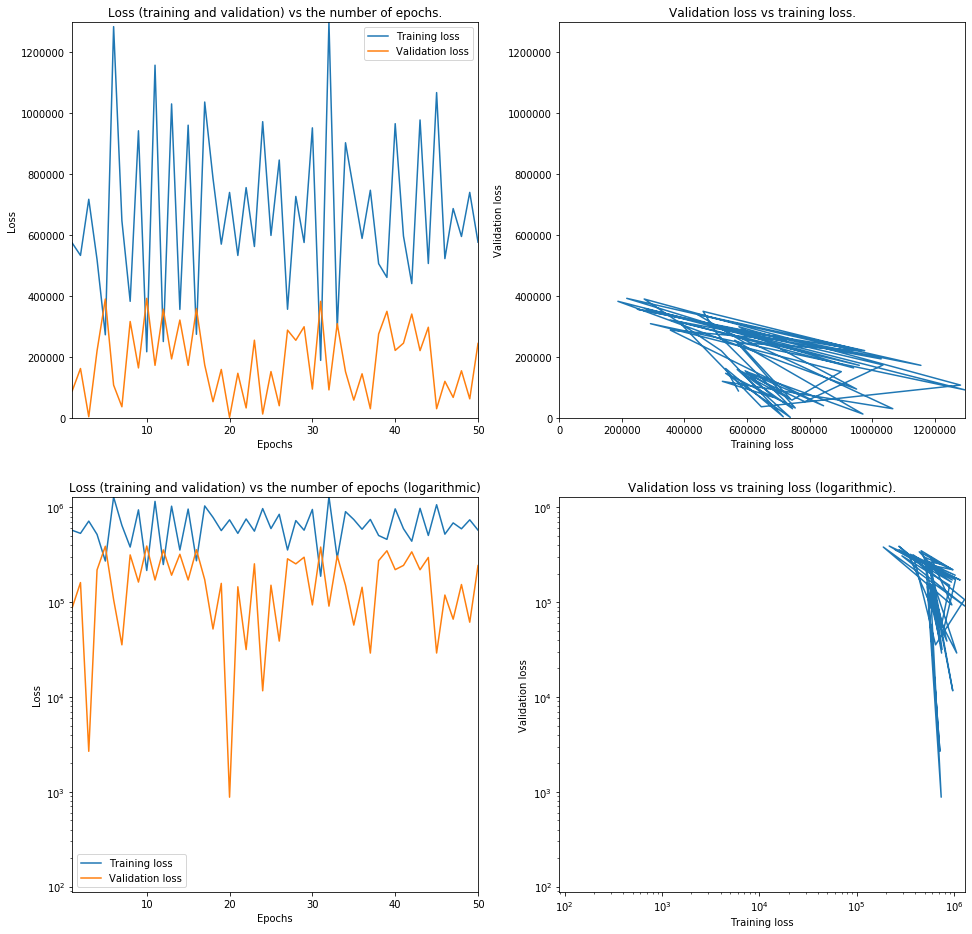

Optimizer: 2 learning rate: 3.162277660168379e-07


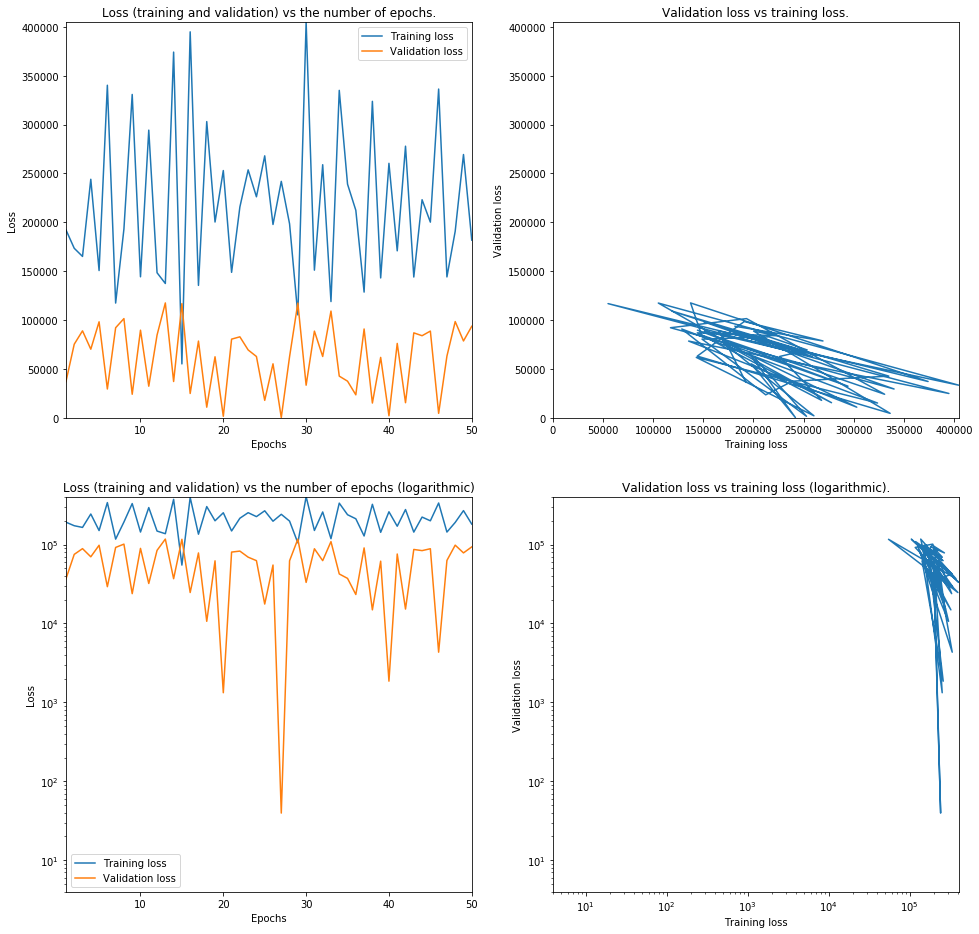

Optimizer: 2 learning rate: 1e-07


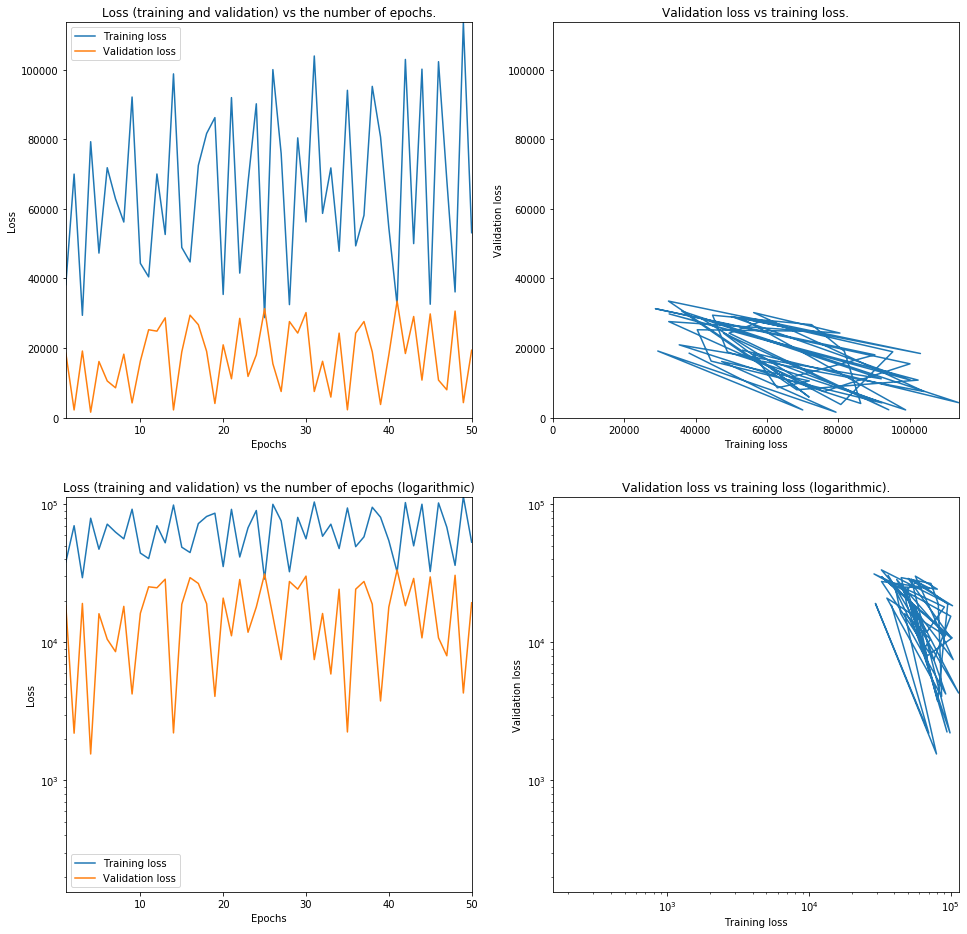

Optimizer: 2 learning rate: 3.162277660168379e-08


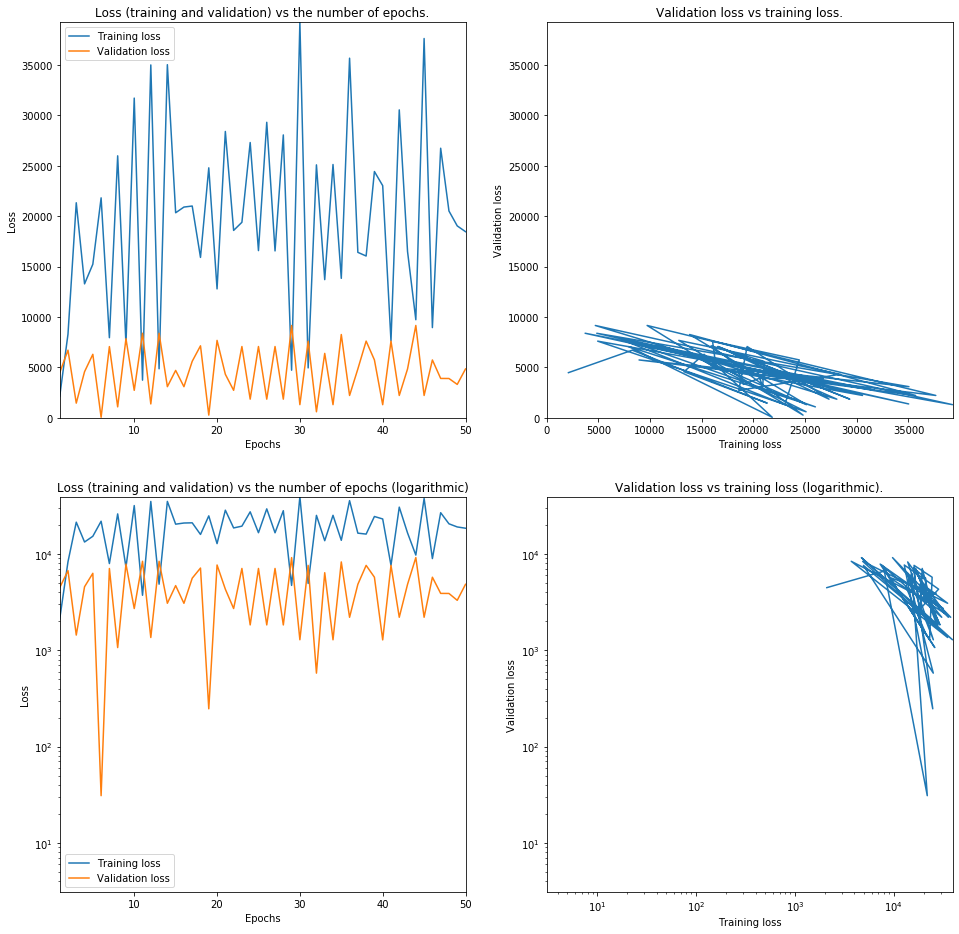

Optimizer: 2 learning rate: 1e-08


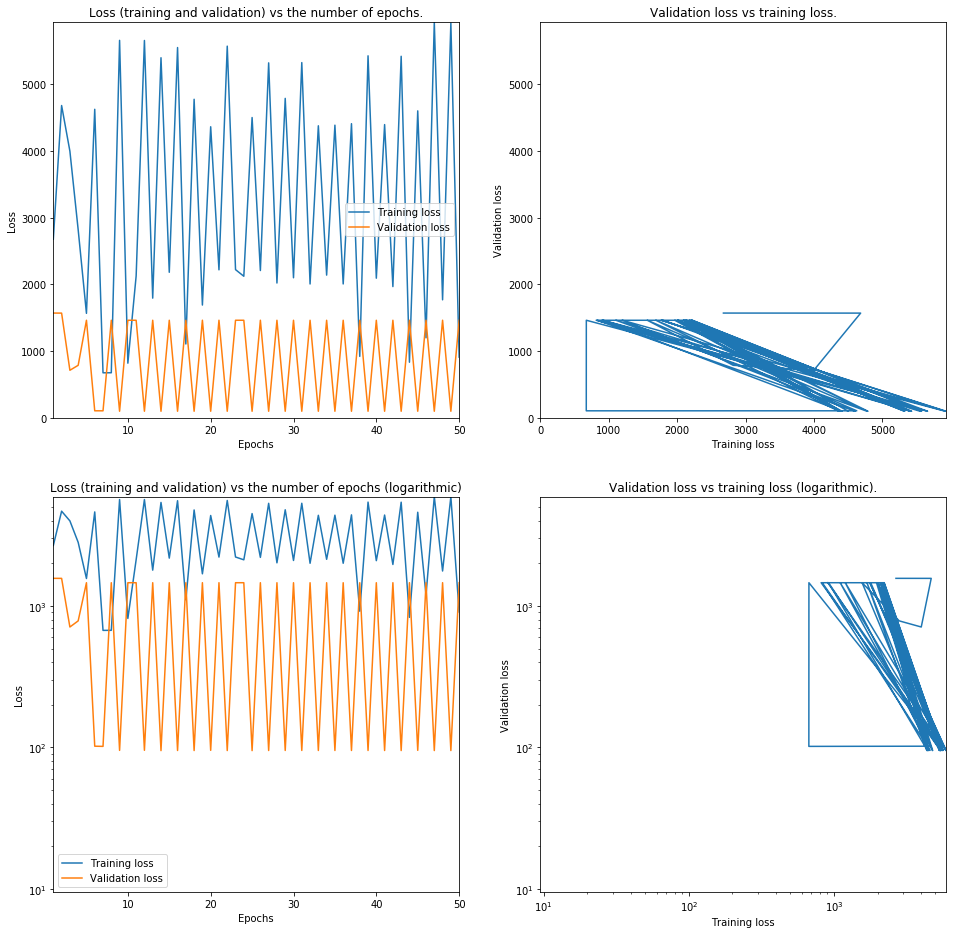

Optimizer: 3 learning rate: 0.0001


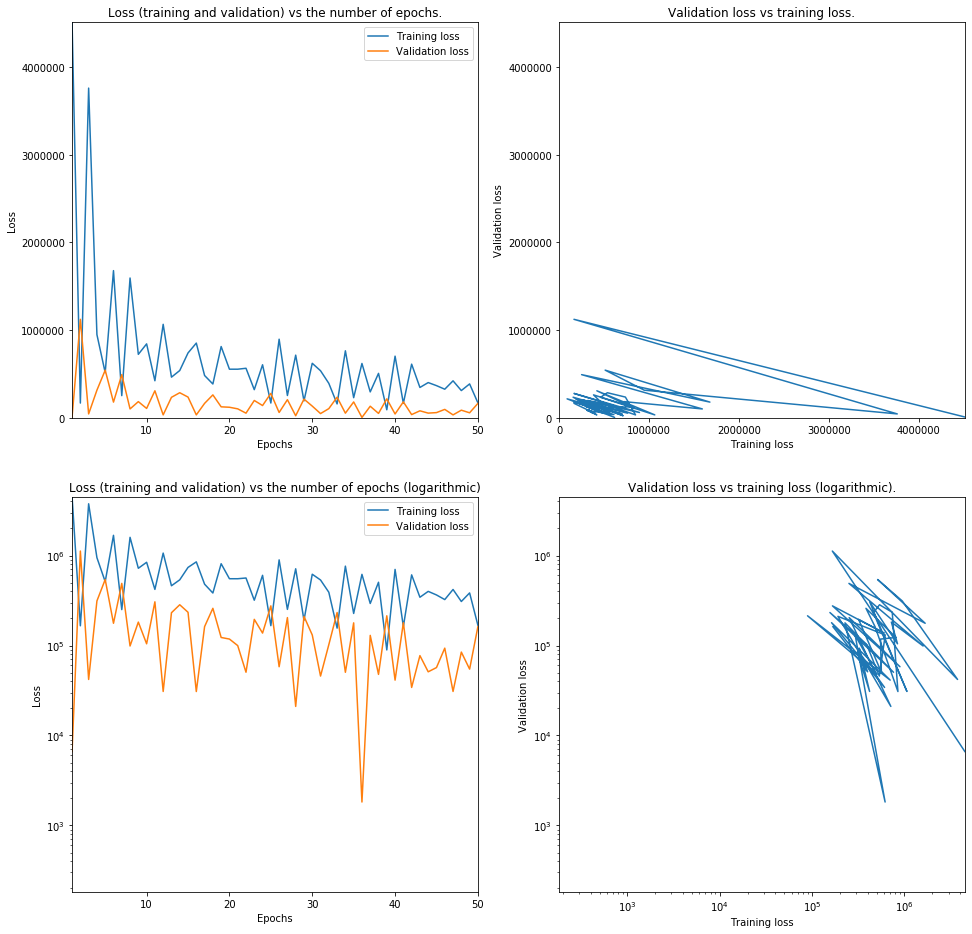

Optimizer: 3 learning rate: 3.1622776601683795e-05


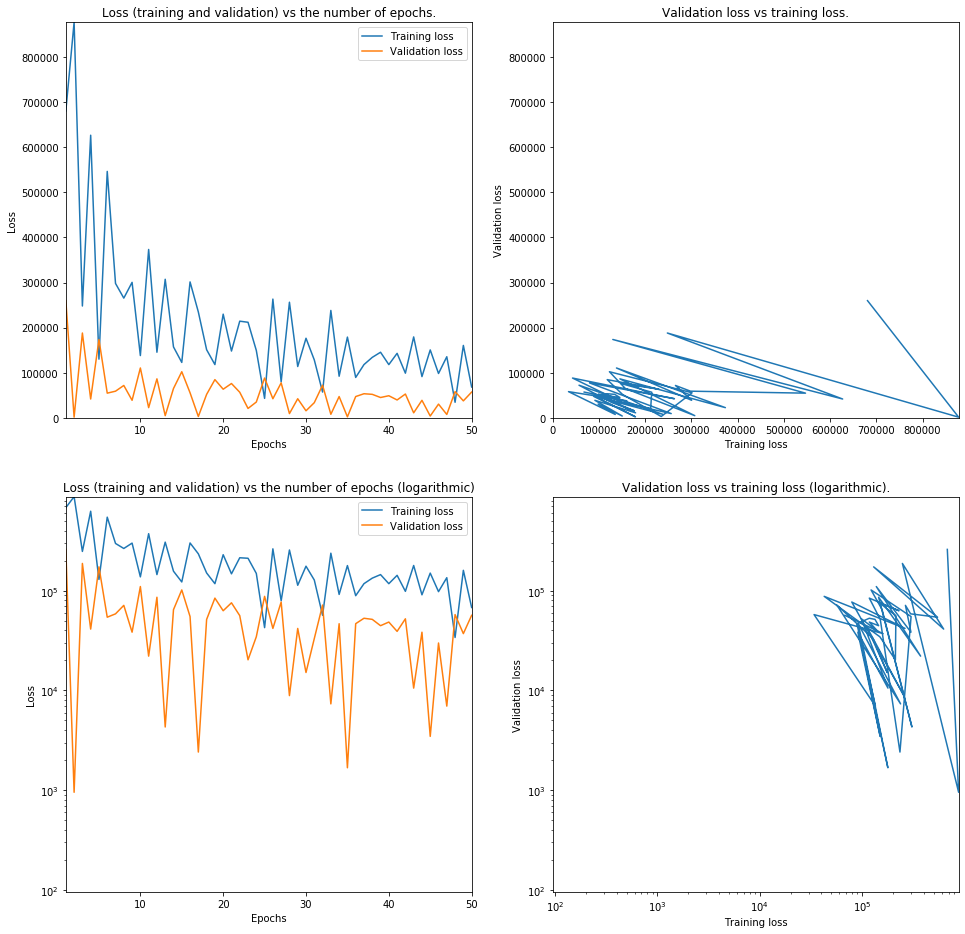

Optimizer: 3 learning rate: 1e-05


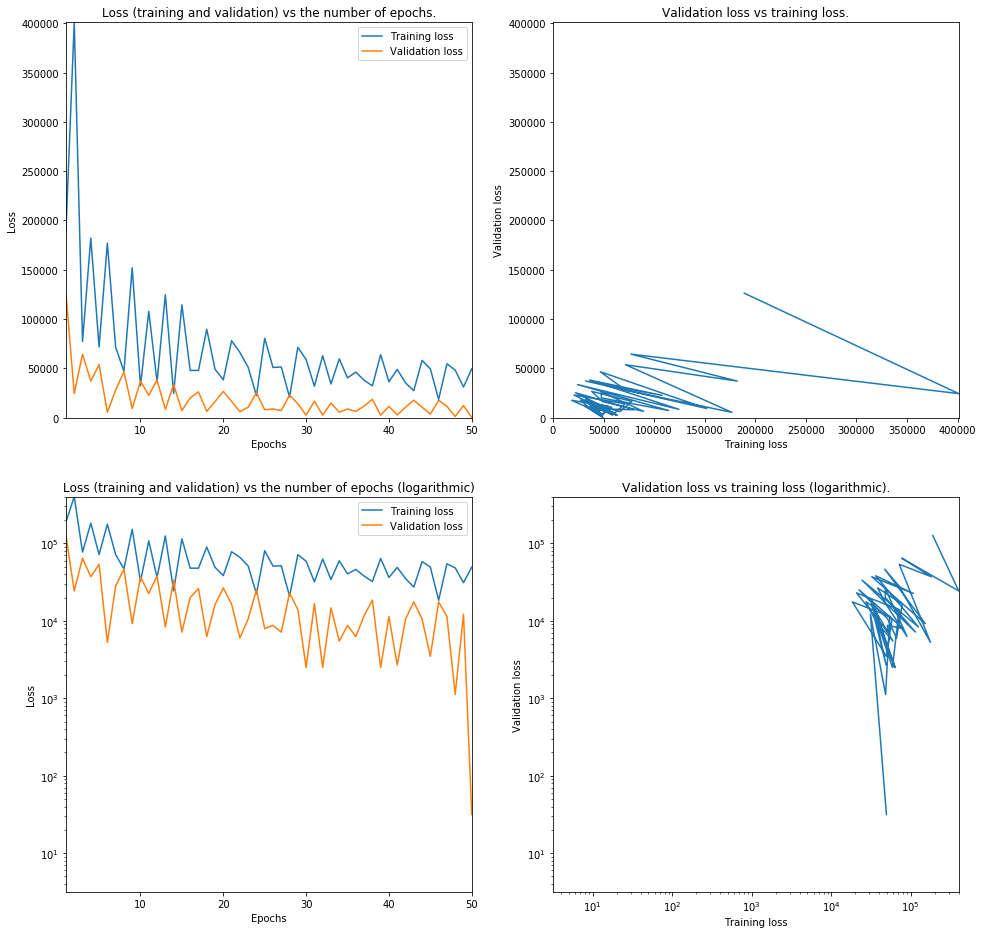

Optimizer: 3 learning rate: 3.162277660168379e-06


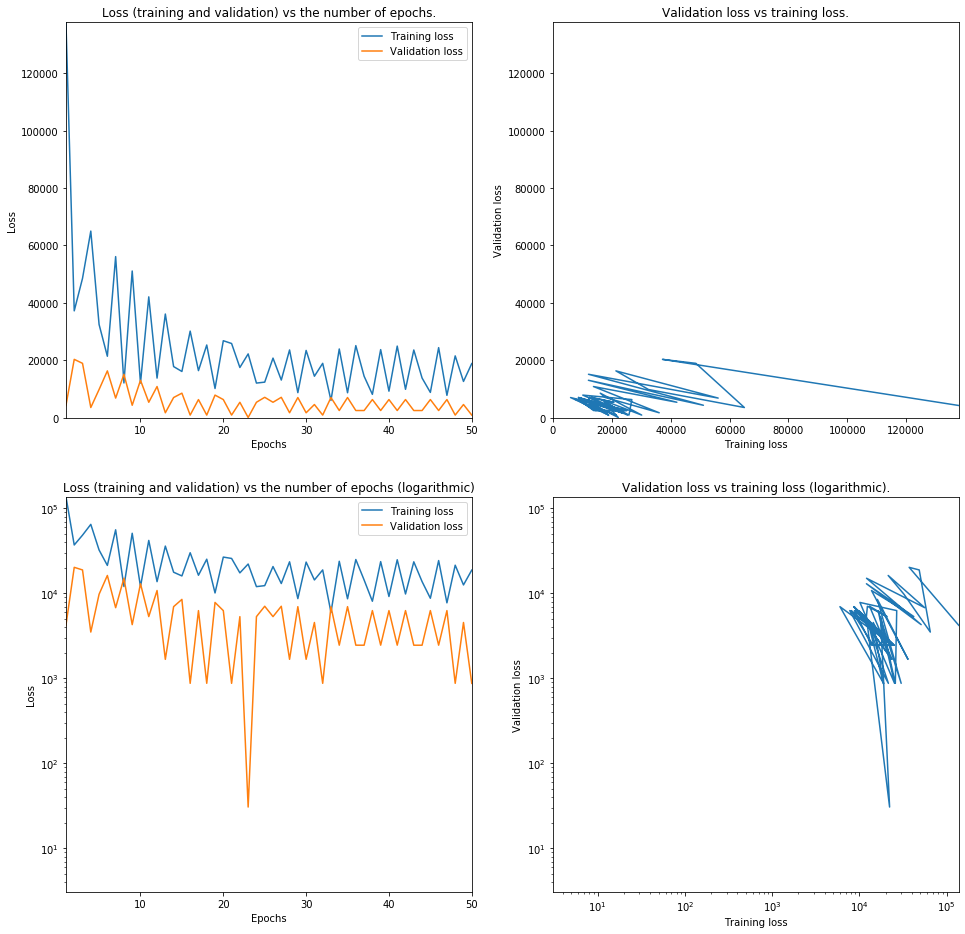

Optimizer: 3 learning rate: 1e-06


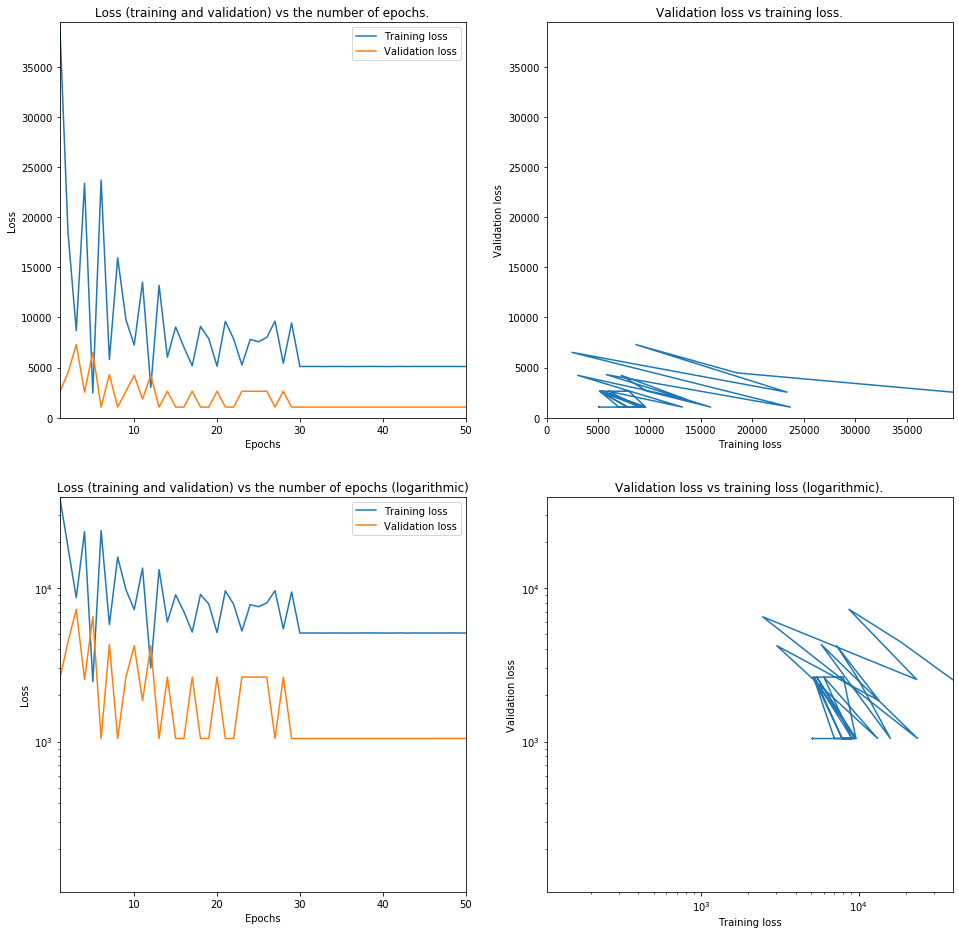

Optimizer: 3 learning rate: 3.162277660168379e-07


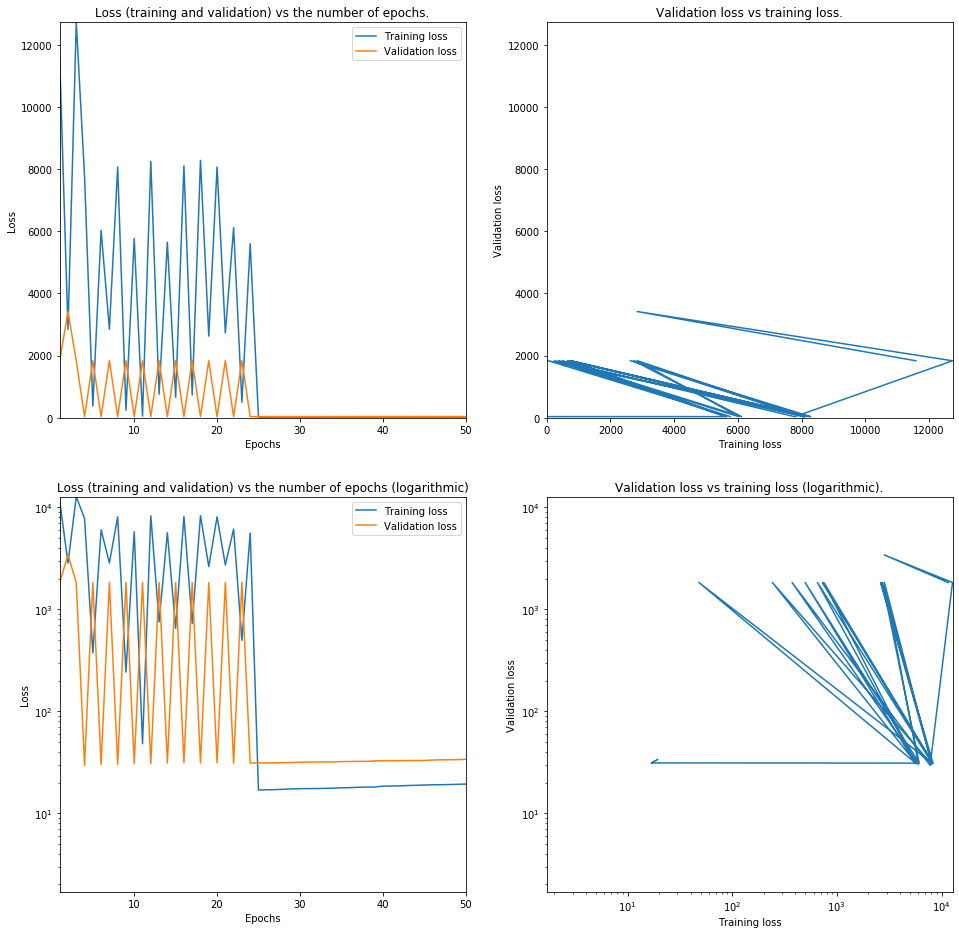

Optimizer: 3 learning rate: 1e-07


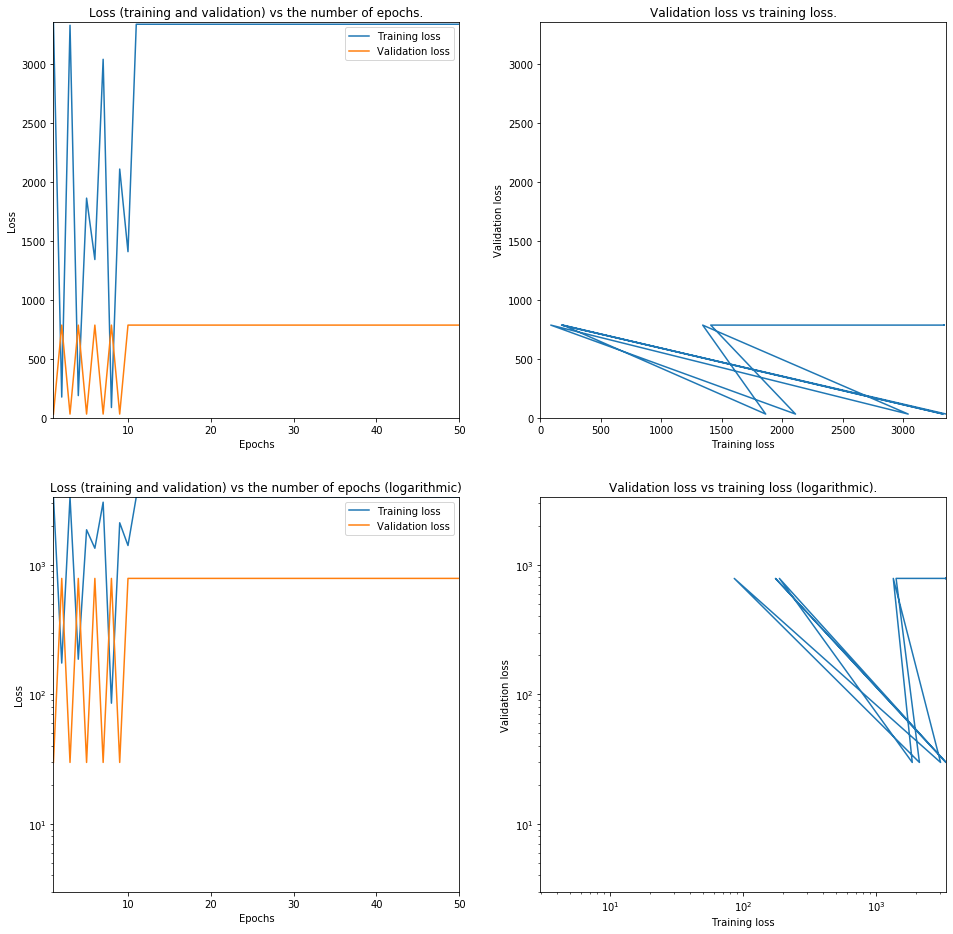

Optimizer: 3 learning rate: 3.162277660168379e-08


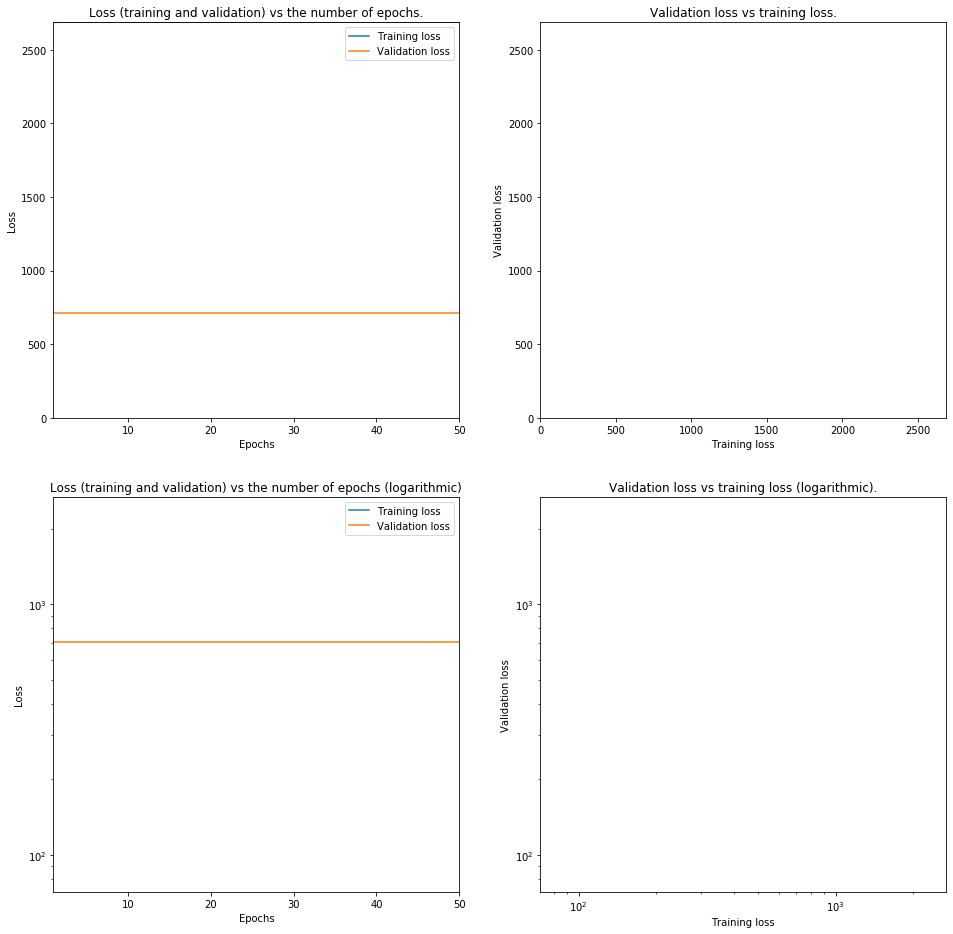

Optimizer: 3 learning rate: 1e-08


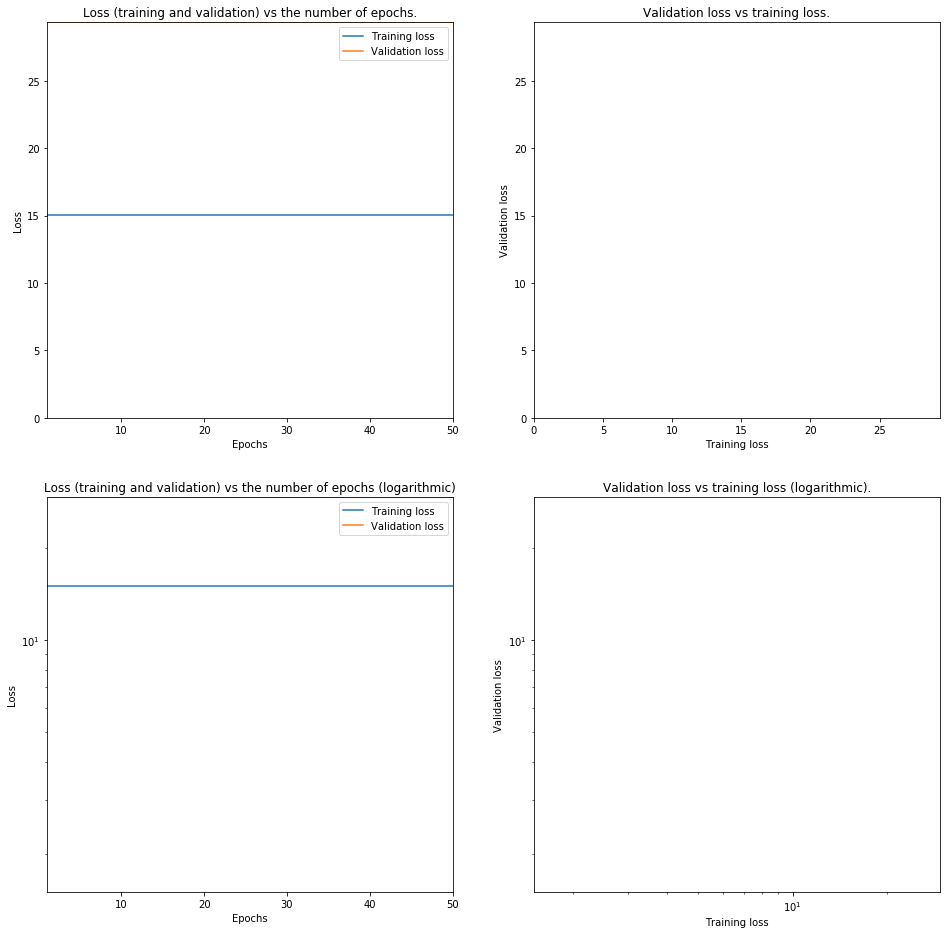

Optimizer: 4 learning rate: 0.0001


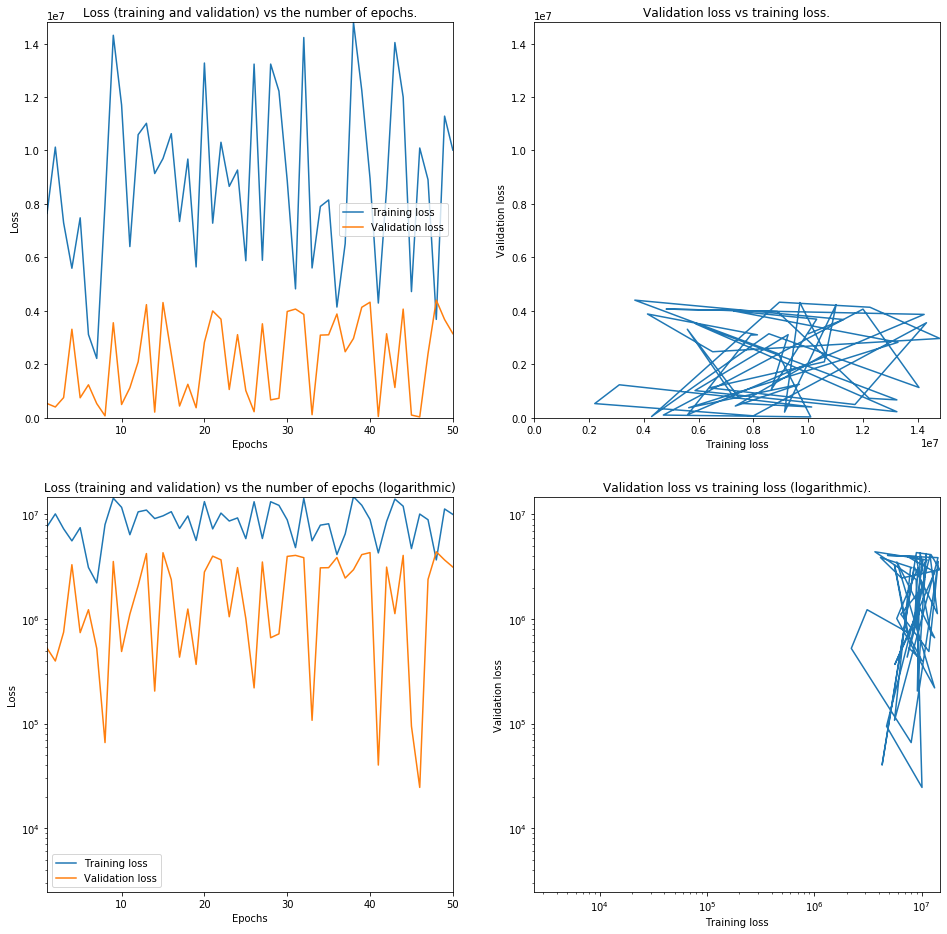

Optimizer: 4 learning rate: 3.1622776601683795e-05


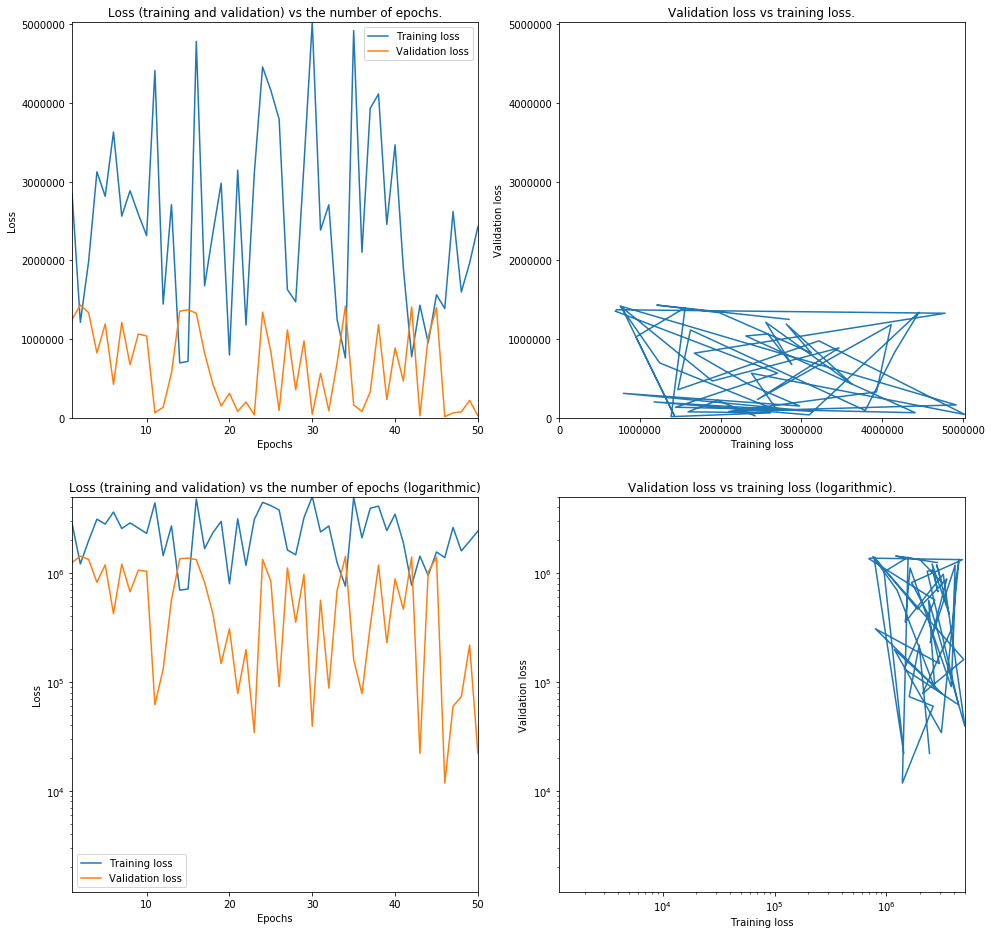

Optimizer: 4 learning rate: 1e-05


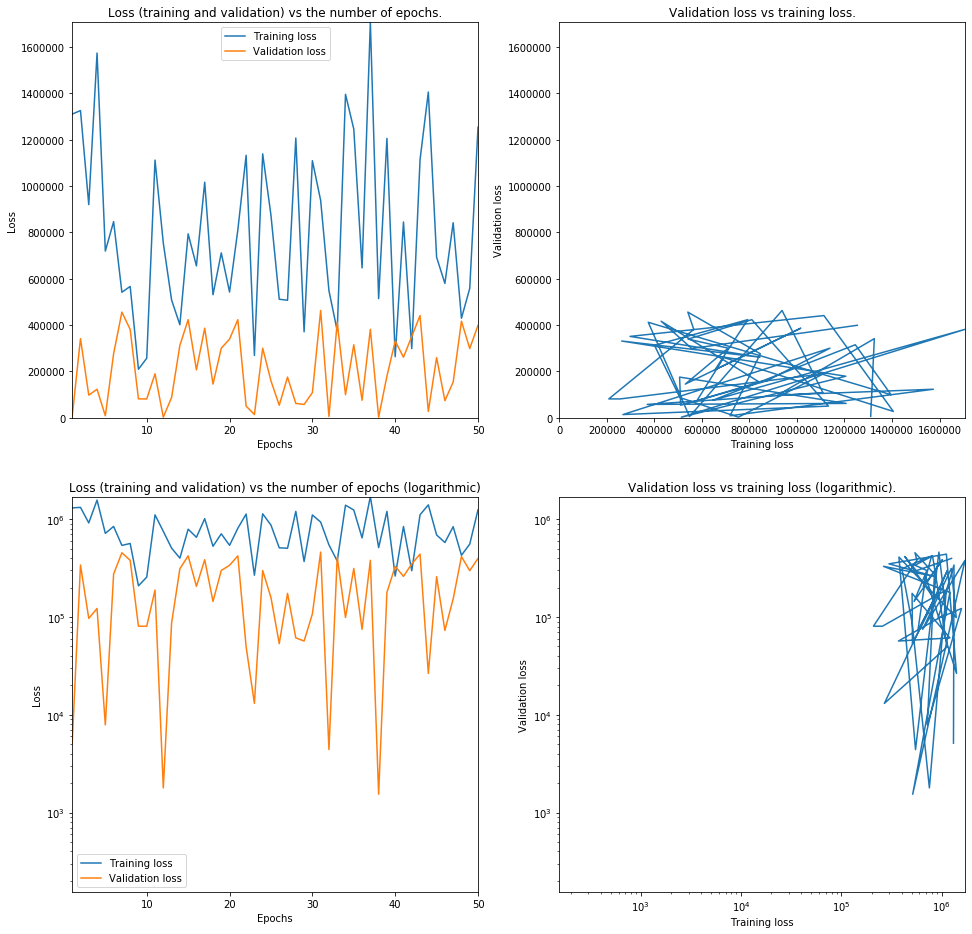

Optimizer: 4 learning rate: 3.162277660168379e-06


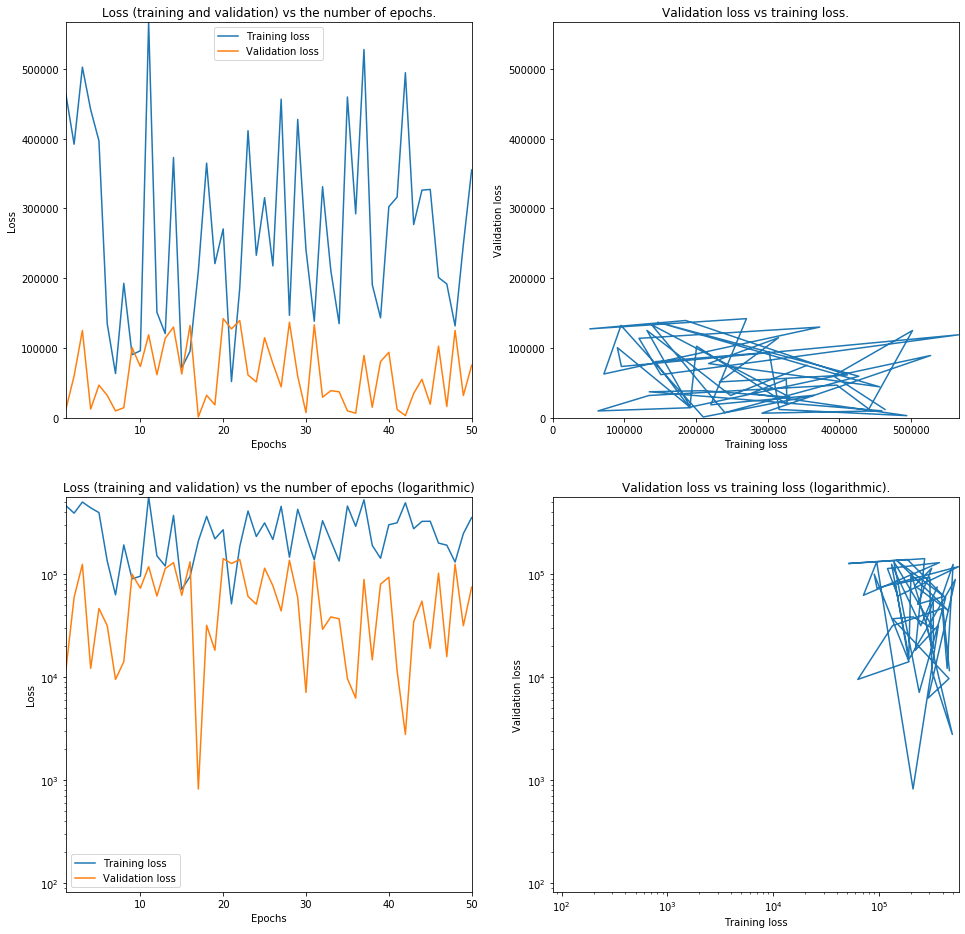

Optimizer: 4 learning rate: 1e-06


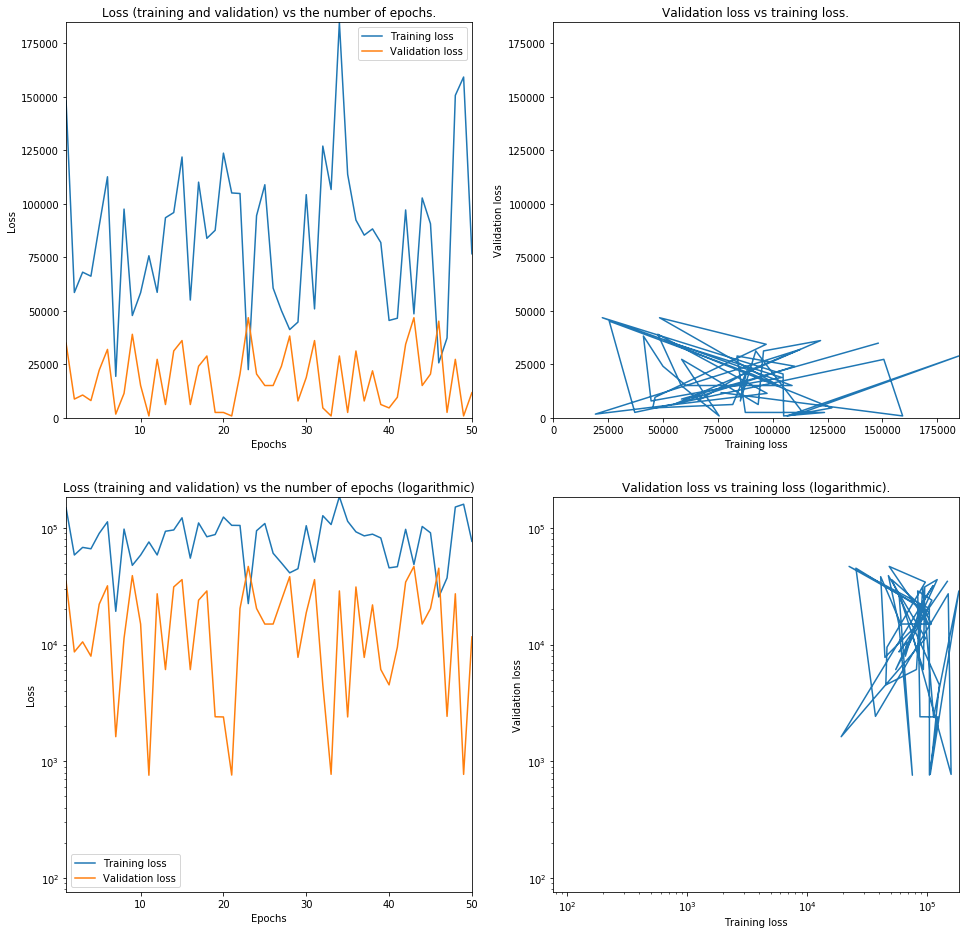

Optimizer: 4 learning rate: 3.162277660168379e-07


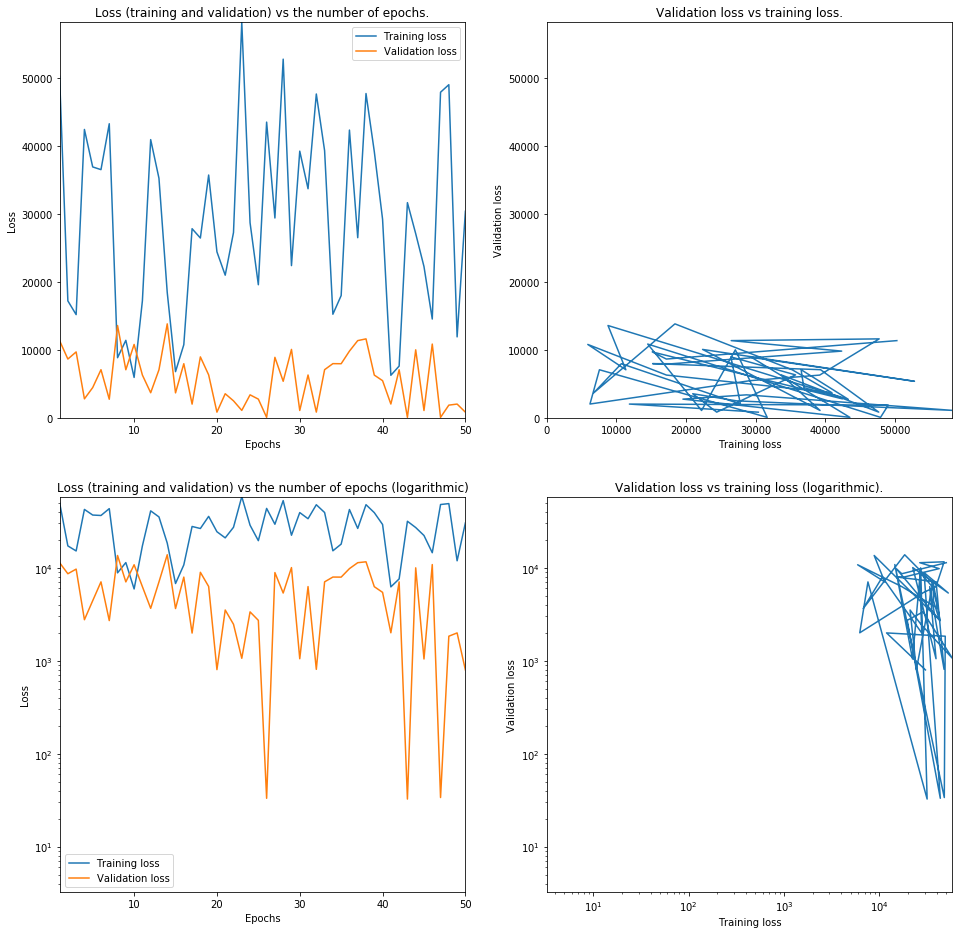

Optimizer: 4 learning rate: 1e-07


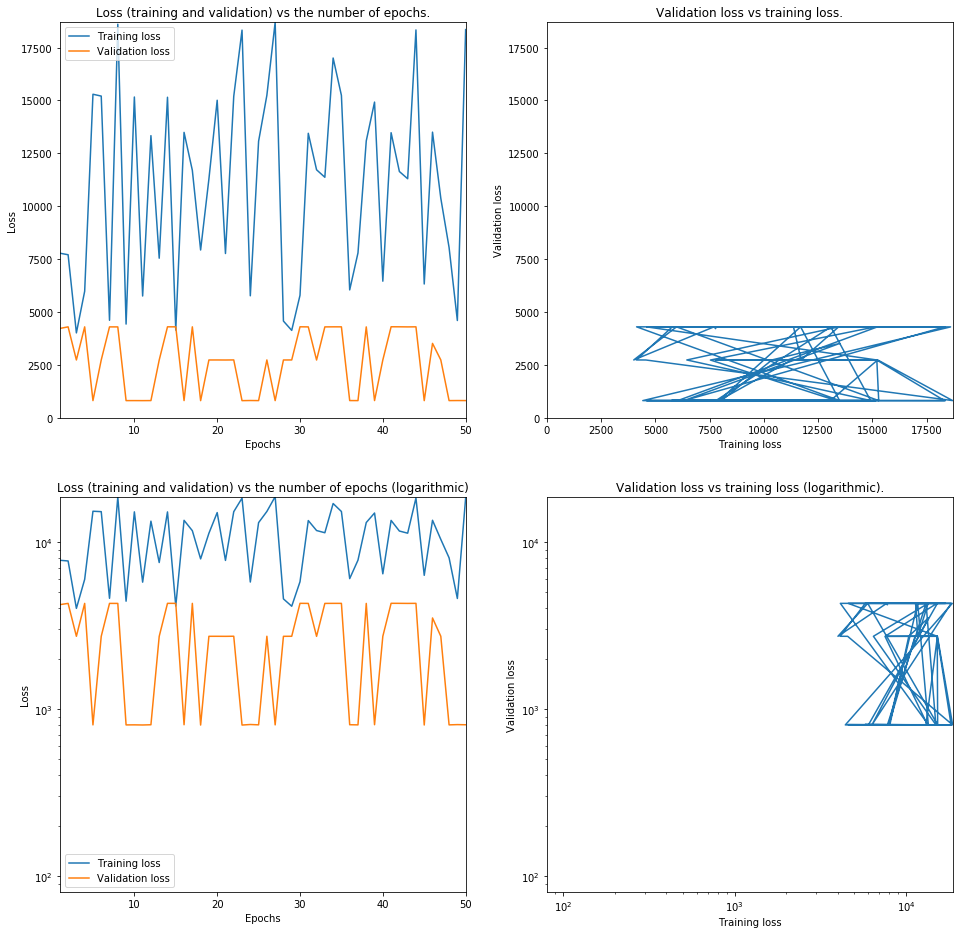

Optimizer: 4 learning rate: 3.162277660168379e-08


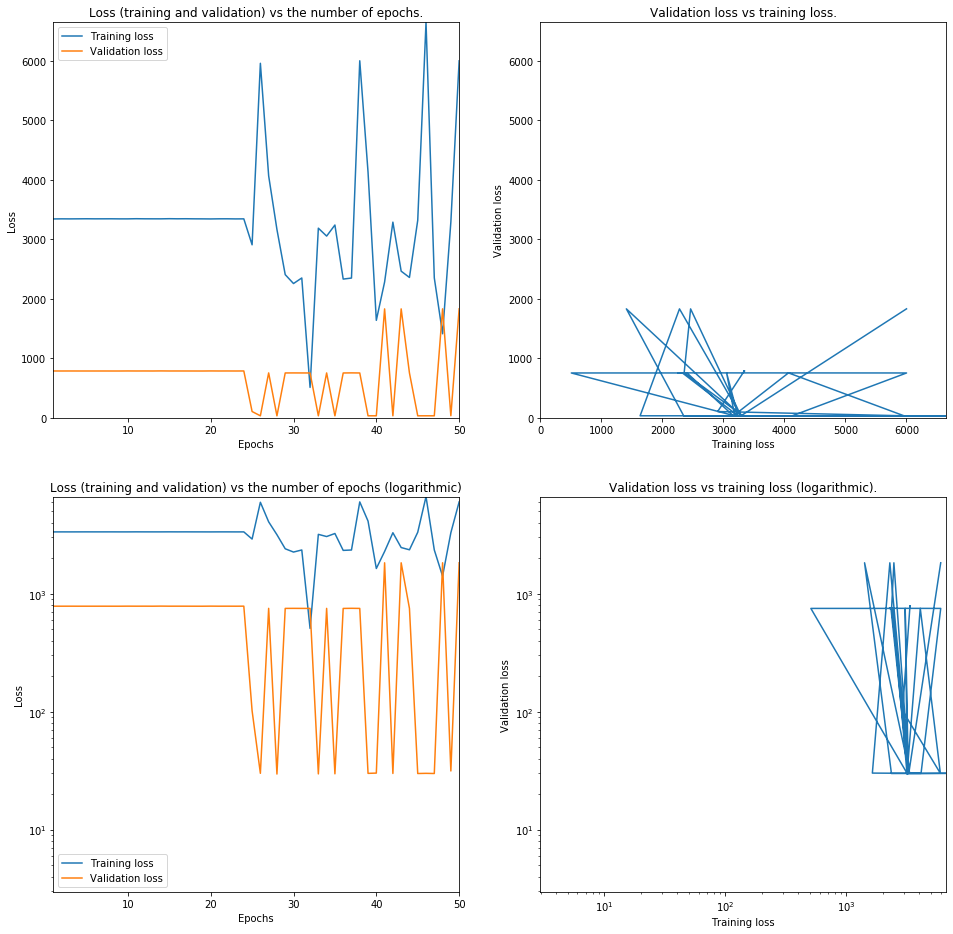

Optimizer: 4 learning rate: 1e-08


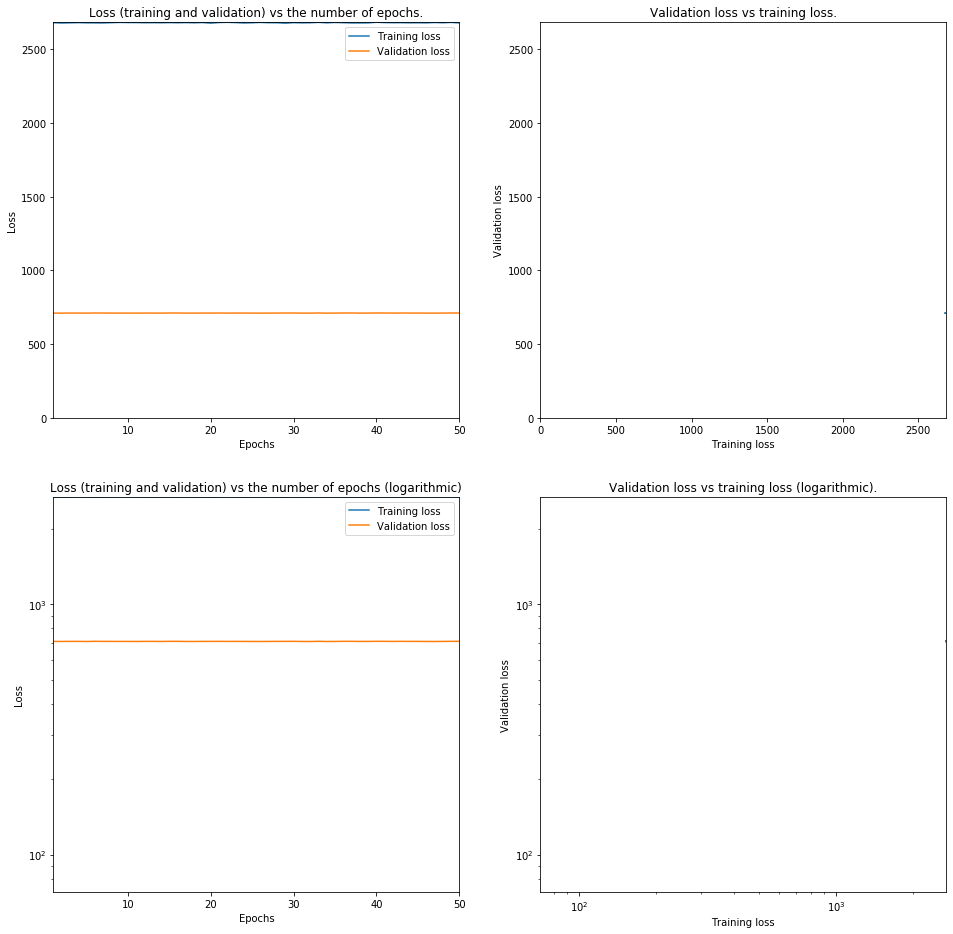

Optimizer: 5 learning rate: 0.0001


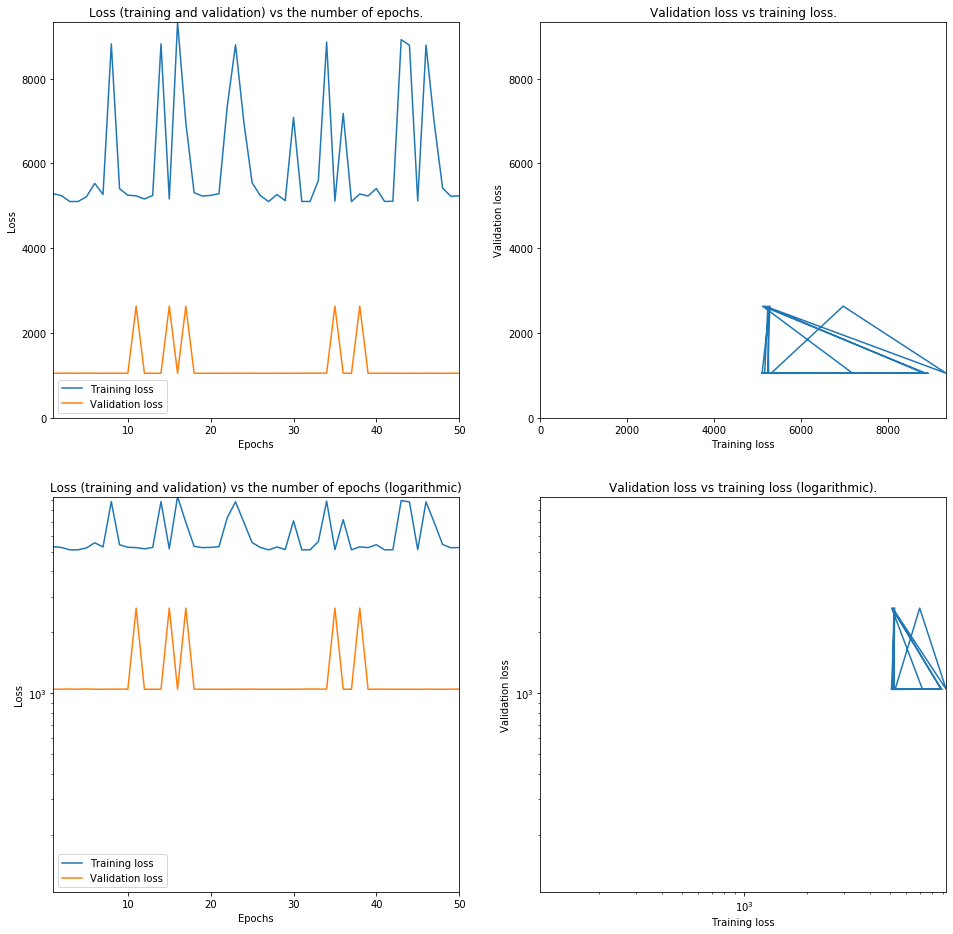

Optimizer: 5 learning rate: 3.1622776601683795e-05


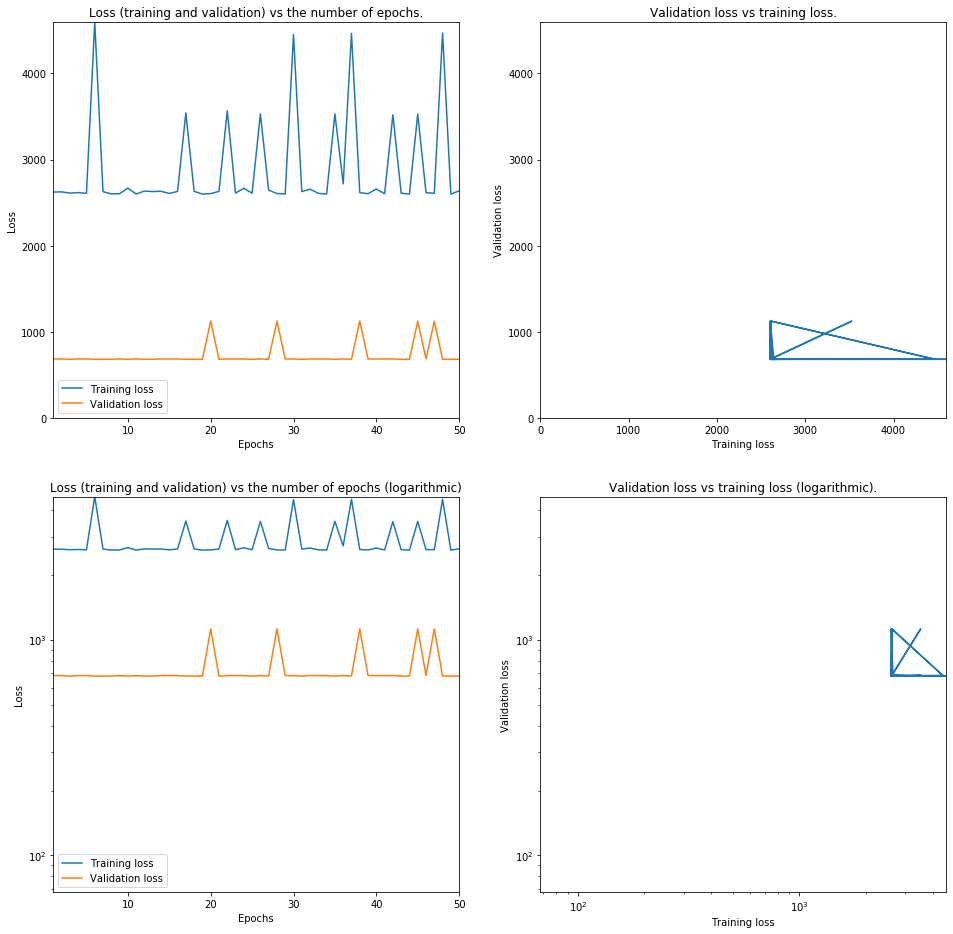

Optimizer: 5 learning rate: 1e-05


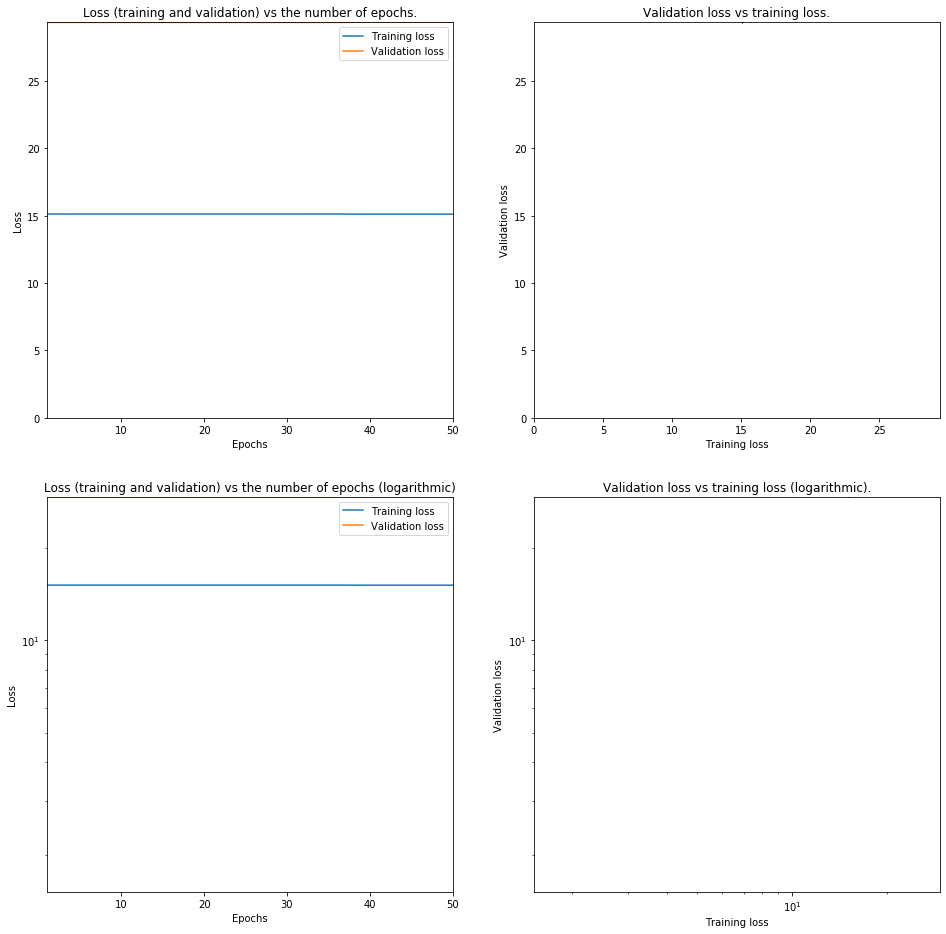

Optimizer: 5 learning rate: 3.162277660168379e-06


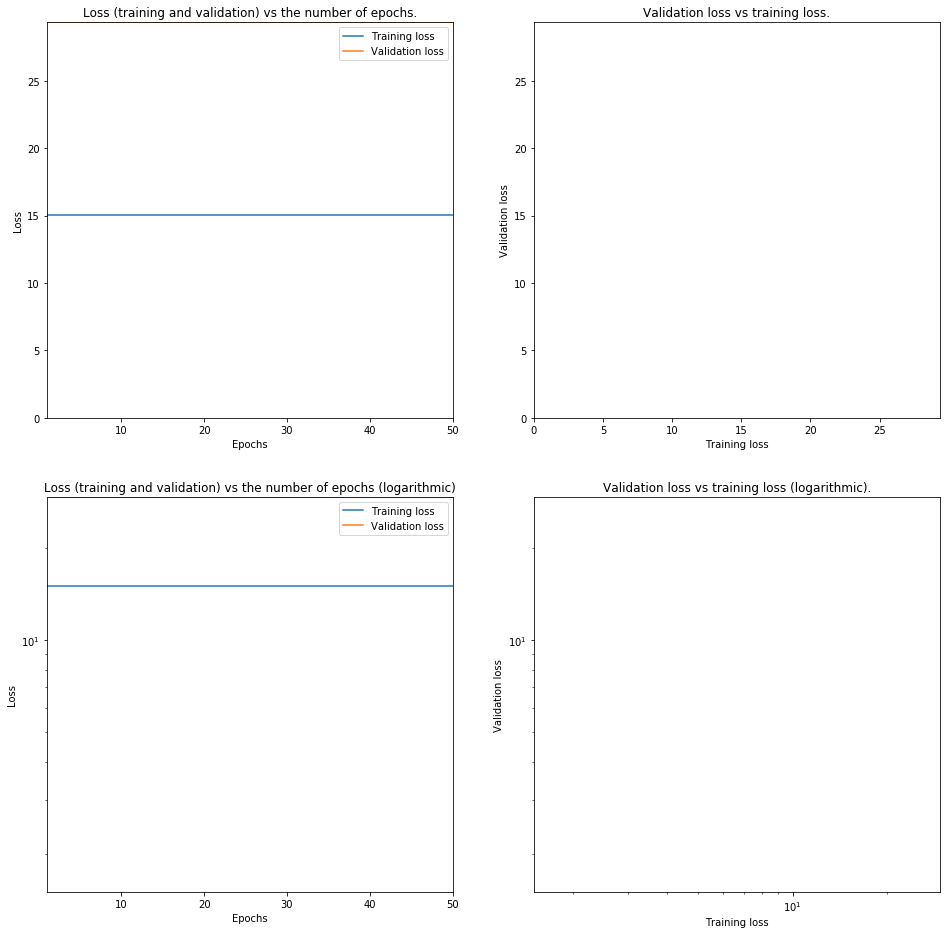

Optimizer: 5 learning rate: 1e-06


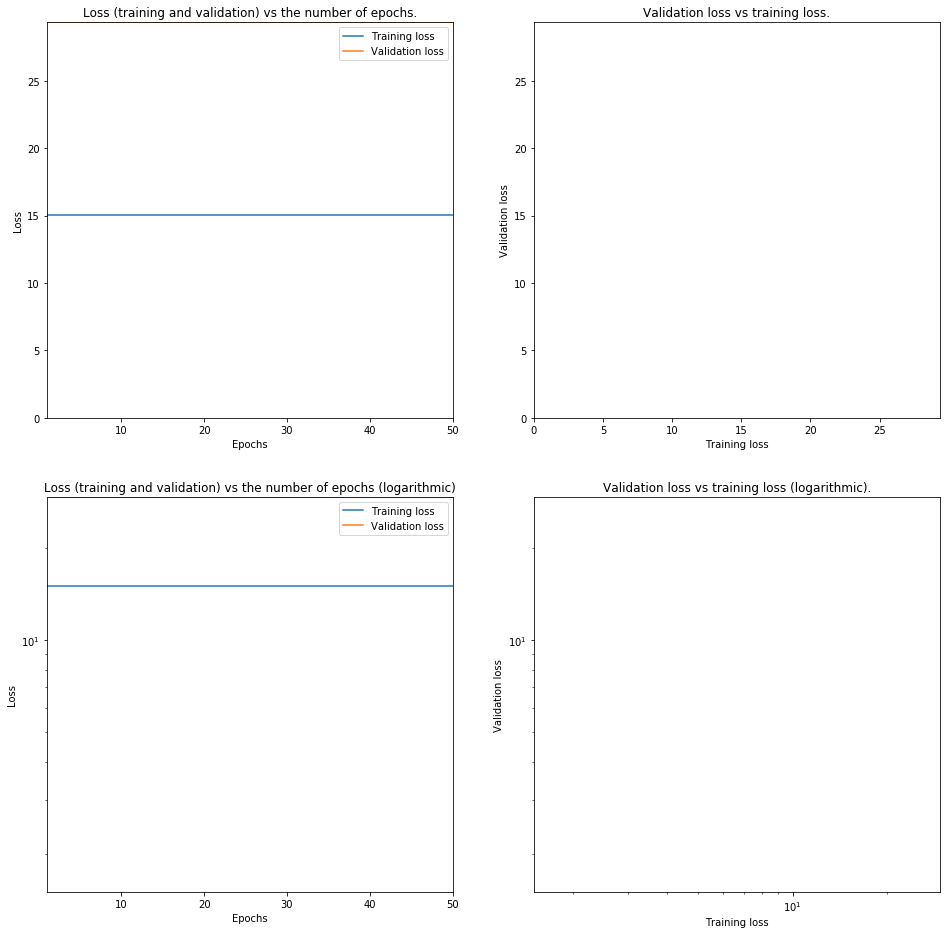

Optimizer: 5 learning rate: 3.162277660168379e-07


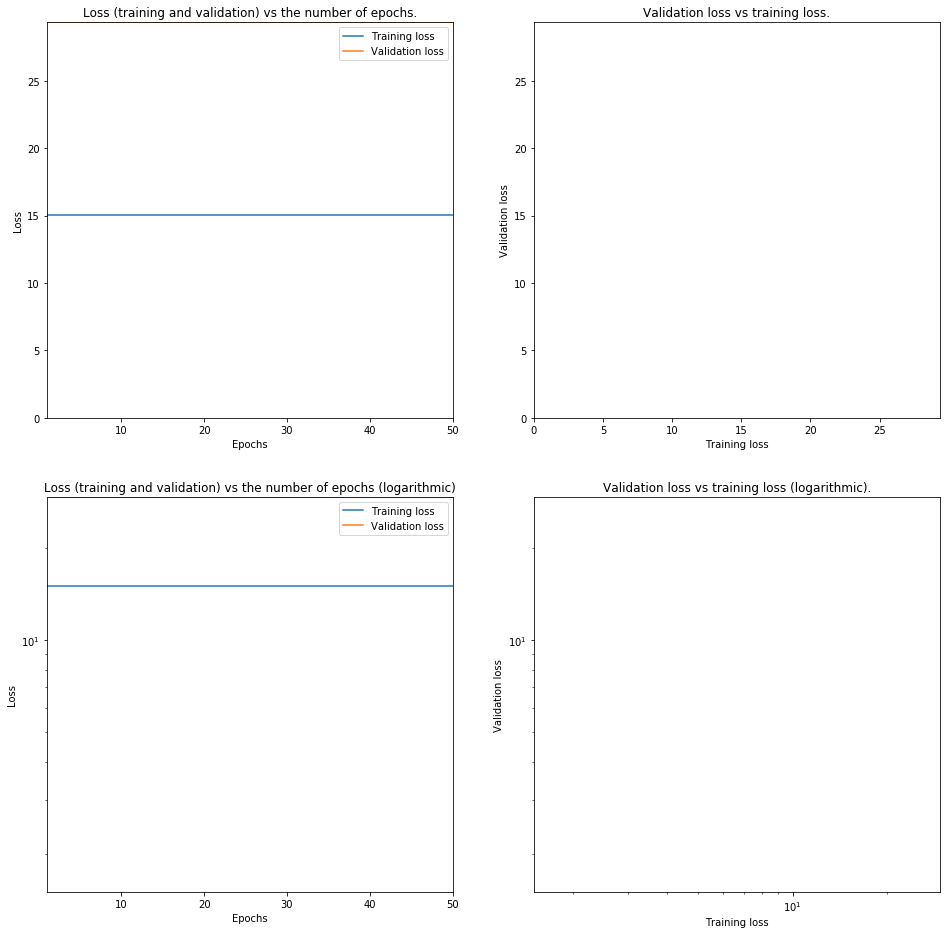

Optimizer: 5 learning rate: 1e-07


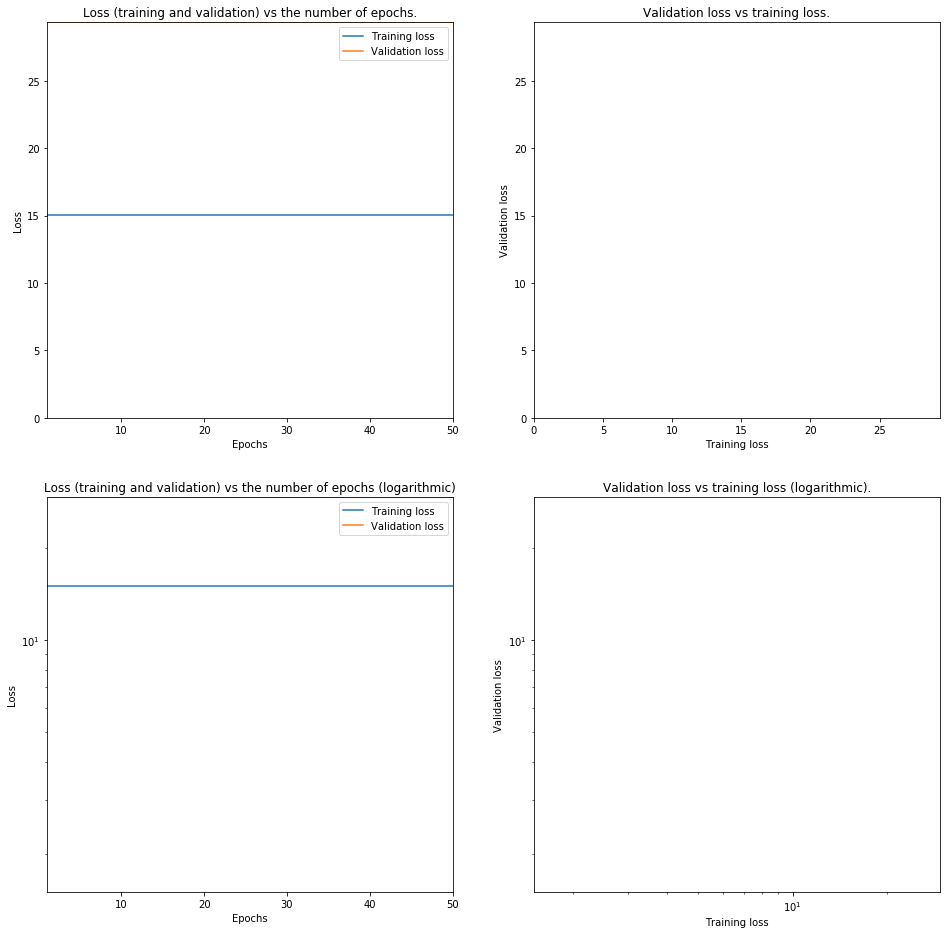

Optimizer: 5 learning rate: 3.162277660168379e-08


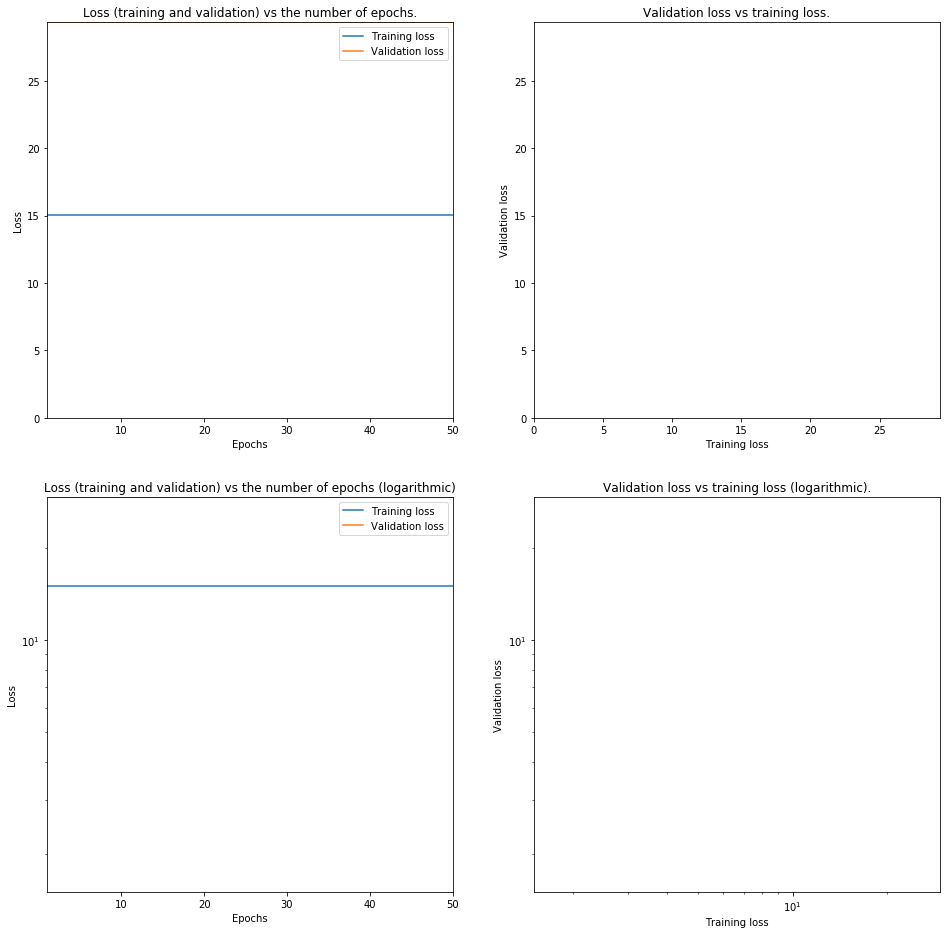

Optimizer: 5 learning rate: 1e-08


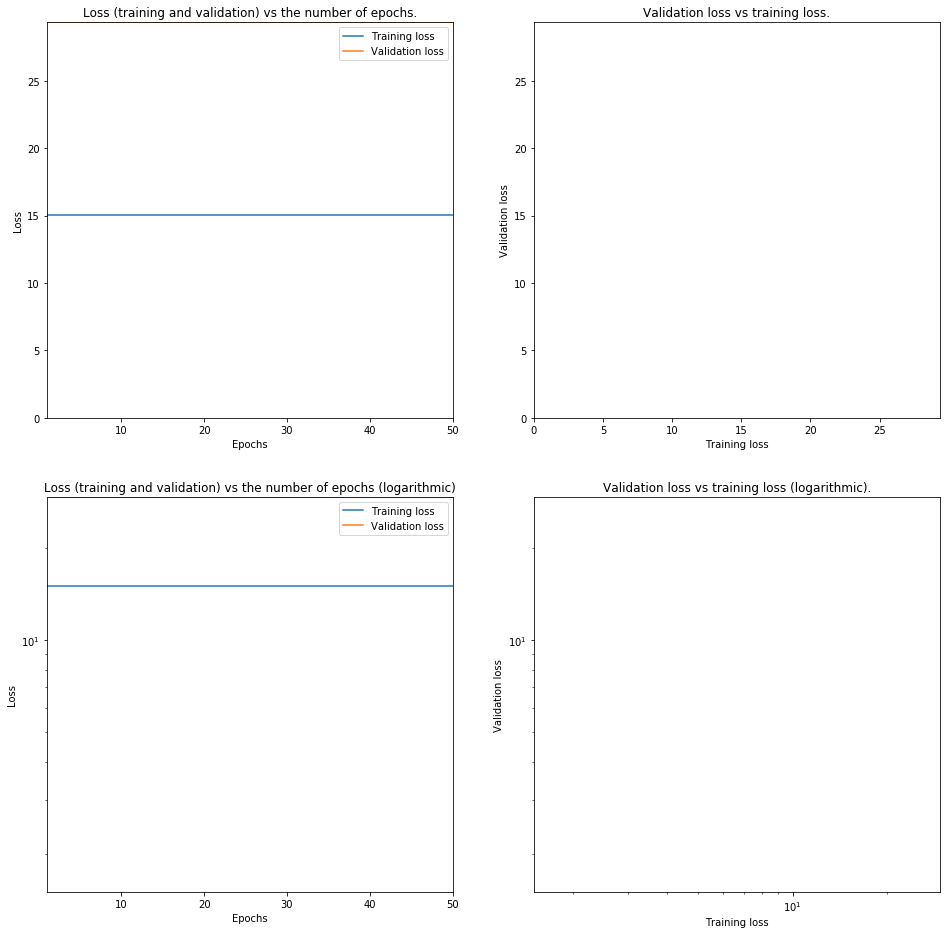

In [61]:
settingsLineaerNet = [['Dense', 1, 'linear', False]]
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=50, min_delta=2*10**-1)]

optimizers = [SGD, adam, nadam, adagrad, rmsprop, adadelta]

for i in range(len(optimizers)):
    for j in np.logspace(-4, -8, 9):
        print('Optimizer:', i, 'learning rate:', j)
        model = makeDenseNetwork(inputSize, settingsLineaerNet, j, kernalInitializer='he_uniform', lossFunction=MAE, optimizer=optimizers[i])
        model.layers[0].set_weights([np.array([[1] for i in range(inputSize)])])
        #model.layers[0].set_weights([np.array([[random.uniform(0.5, 1.5)] for i in range(inputSize)])])
        
        fitDetails = model.fit(trainingInput['input'], trainingInput['target'], validation_split=0.3, epochs=50, verbose=0, callbacks=callbacksNetwork)
        history = plotHistory(fitDetails)

## Linear network real data

In [17]:
name = 'LinearNetwork'
settingsLineaerNet = [['Dense', 1, 'linear', False]]
learningRate = 1.5*10**-8
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=50, min_delta=2*10**-1)]

model = makeDenseNetwork(inputSize, settingsLineaerNet, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, optimizer=adam)
model.layers[0].set_weights([np.array([[1] for i in range(inputSize)])])
#model.layers[0].set_weights([np.array([[random.uniform(0.5, 1.5)] for i in range(inputSize)])])


model.summary()
print(model.evaluate(validationInput['input'], validationInput['target'], verbose=1))
print(model.evaluate(trainingInput['input'], trainingInput['target'], verbose=1))
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 1)                 8         
Total params: 8
Trainable params: 8
Non-trainable params: 0
_________________________________________________________________
12990/12990 [==============================] - 1s 61us/step
9640.4832116765
51960/51960 [==============================] - 1s 24us/step
19.219714470731926
Layer 0:  [array([[1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]], dtype=float32)]


Train on 36372 samples, validate on 15588 samples
Epoch 1/100
36372/36372 [==============================] - 2s 58us/step - loss: 19.6417 - val_loss: 18.2351
Epoch 2/100
36372/36372 [==============================] - 2s 55us/step - loss: 55.7348 - val_loss: 3977.3794
Epoch 3/100
36372/36372 [==============================] - 2s 60us/step - loss: 6377.9884 - val_loss: 1400.6073
Epoch 4/100
36372/36372 [==============================] - 2s 57us/step - loss: 2442.7299 - val_loss: 3977.3794
Epoch 5/100
36372/36372 [==============================] - 2s 60us/step - loss: 6042.2041 - val_loss: 18.4683
Epoch 6/100
36372/36372 [==============================] - 2s 62us/step - loss: 369.1090 - val_loss: 5465.7415
Epoch 7/100
36372/36372 [==============================] - 3s 78us/step - loss: 8010.9012 - val_loss: 18.5118
Epoch 8/100
36372/36372 [==============================] - 2s 68us/step - loss: 560.6130 - val_loss: 5466.1222
Epoch 9/100
36372/36372 [==============================] - 2s 67us

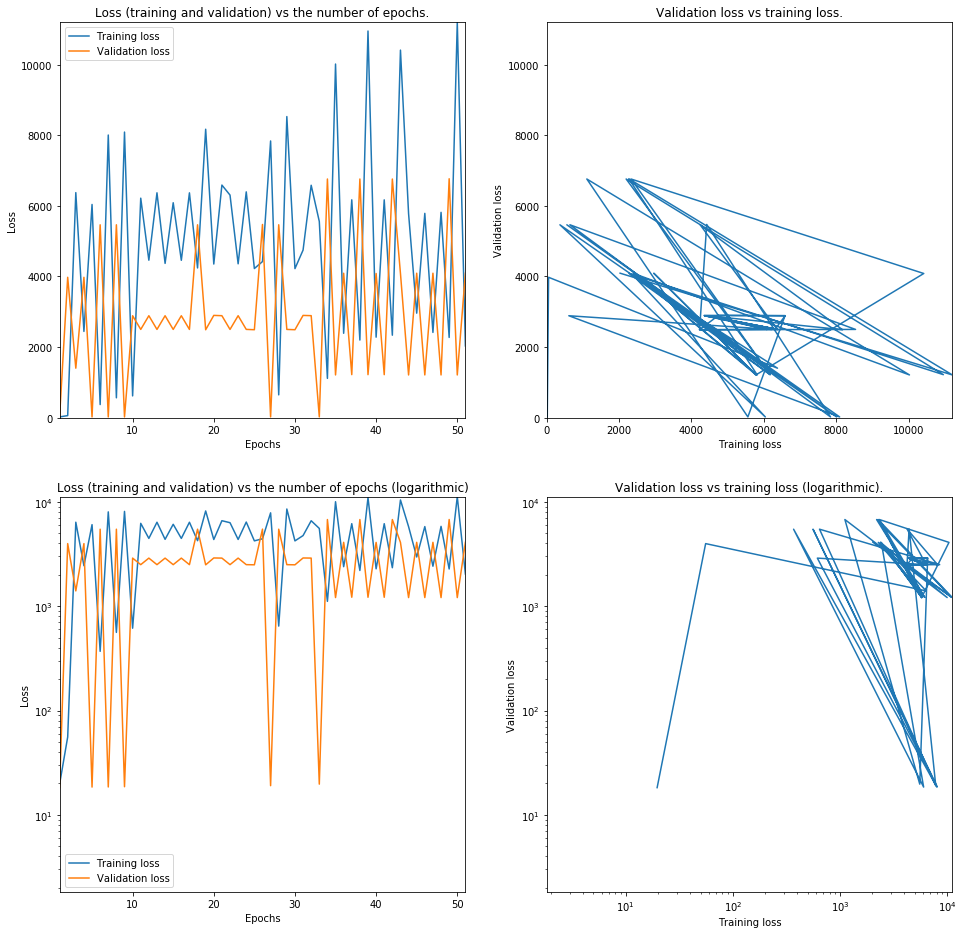

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 1)                 8         
Total params: 8
Trainable params: 8
Non-trainable params: 0
_________________________________________________________________
18378.469593534992
Layer 0:  [array([[1.        ],
       [1.        ],
       [0.9999997 ],
       [0.9999996 ],
       [0.99999994],
       [0.9999994 ],
       [0.9999996 ],
       [0.99999964]], dtype=float32)]


In [18]:
fitDetails = model.fit(trainingInput['input'], trainingInput['target'], validation_split=0.3, epochs=100, verbose=1, callbacks=callbacksNetwork)

history = plotHistory(fitDetails)

evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

model.summary()
print(evaluation)
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

## Real data complex network

In [53]:
name = '1DenseLayerNetwork'
settingsLineaerNet = [['Dense', 128, 'softplus', False], ['Dense', 1, 'linear', False]]
learningRate = 1*10**-4
callbacksNetwork = []#[keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=50, min_delta=2*10**-1)]

model = makeDenseNetwork(inputSize, settingsLineaerNet, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, optimizer=adam)
#model.layers[0].set_weights([np.array([[1] for i in range(inputSize)])])
#model.layers[0].set_weights([np.array([[random.uniform(0.5, 1.5)] for i in range(inputSize)])])


model.summary()
print(model.evaluate(validationInput['input'], validationInput['target'], verbose=1))
print(model.evaluate(trainingInput['input'], trainingInput['target'], verbose=1))
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_50 (Dense)             (None, 128)               1024      
_________________________________________________________________
dense_51 (Dense)             (None, 1)                 128       
Total params: 1,152
Trainable params: 1,152
Non-trainable params: 0
_________________________________________________________________
12990/12990 [==============================] - 0s 34us/step
10138101.232321737
51960/51960 [==============================] - 2s 29us/step
13982977.459925303
Layer 0:  [array([[-0.21204376, -0.67815095,  0.64836746, ...,  0.05559194,
         0.1809389 , -0.3408457 ],
       [ 0.534556  ,  0.5569897 , -0.5469795 , ..., -0.12806314,
         0.47275203,  0.3875751 ],
       [-0.8149342 , -0.05083203,  0.32706505, ..., -0.7265441 ,
         0.24996775, -0.7768595 ],
       ...,
       [-0.1010682 ,  0.4290579 

Train on 36372 samples, validate on 15588 samples
Epoch 1/100
36372/36372 [==============================] - 3s 73us/step - loss: 946755732.4539 - val_loss: 292677454.7228
Epoch 2/100
36372/36372 [==============================] - 3s 73us/step - loss: 851725699.6091 - val_loss: 629098609.7458
Epoch 3/100
36372/36372 [==============================] - 3s 73us/step - loss: 1910439164.7058 - val_loss: 55651015.8574
Epoch 4/100
36372/36372 [==============================] - 2s 68us/step - loss: 699592057.2532 - val_loss: 419277429.8953
Epoch 5/100
36372/36372 [==============================] - 2s 68us/step - loss: 1661601970.0293 - val_loss: 167468808.1473
Epoch 6/100
36372/36372 [==============================] - 2s 67us/step - loss: 244363722.1025 - val_loss: 752861126.0649
Epoch 7/100
36372/36372 [==============================] - 2s 68us/step - loss: 2157014189.1915 - val_loss: 574211993.2319
Epoch 8/100
36372/36372 [==============================] - 2s 68us/step - loss: 1879546041.810

36372/36372 [==============================] - 2s 68us/step - loss: 2762042566.6862 - val_loss: 244611583.1079
Epoch 68/100
36372/36372 [==============================] - 2s 69us/step - loss: 1391773102.8007 - val_loss: 457823881.7056
Epoch 69/100
36372/36372 [==============================] - 2s 69us/step - loss: 1786492897.4908 - val_loss: 289055803.0291
Epoch 70/100
36372/36372 [==============================] - 3s 70us/step - loss: 1414378141.4578 - val_loss: 118903920.9304
Epoch 71/100
36372/36372 [==============================] - 3s 69us/step - loss: 1058462787.0399 - val_loss: 471956315.7495
Epoch 72/100
36372/36372 [==============================] - 2s 68us/step - loss: 874002651.6409 - val_loss: 700999929.2542
Epoch 73/100
36372/36372 [==============================] - 3s 69us/step - loss: 985917086.4879 - val_loss: 906510847.0372
Epoch 74/100
36372/36372 [==============================] - 3s 74us/step - loss: 1838498954.0331 - val_loss: 765983167.2464
Epoch 75/100
36372/3637

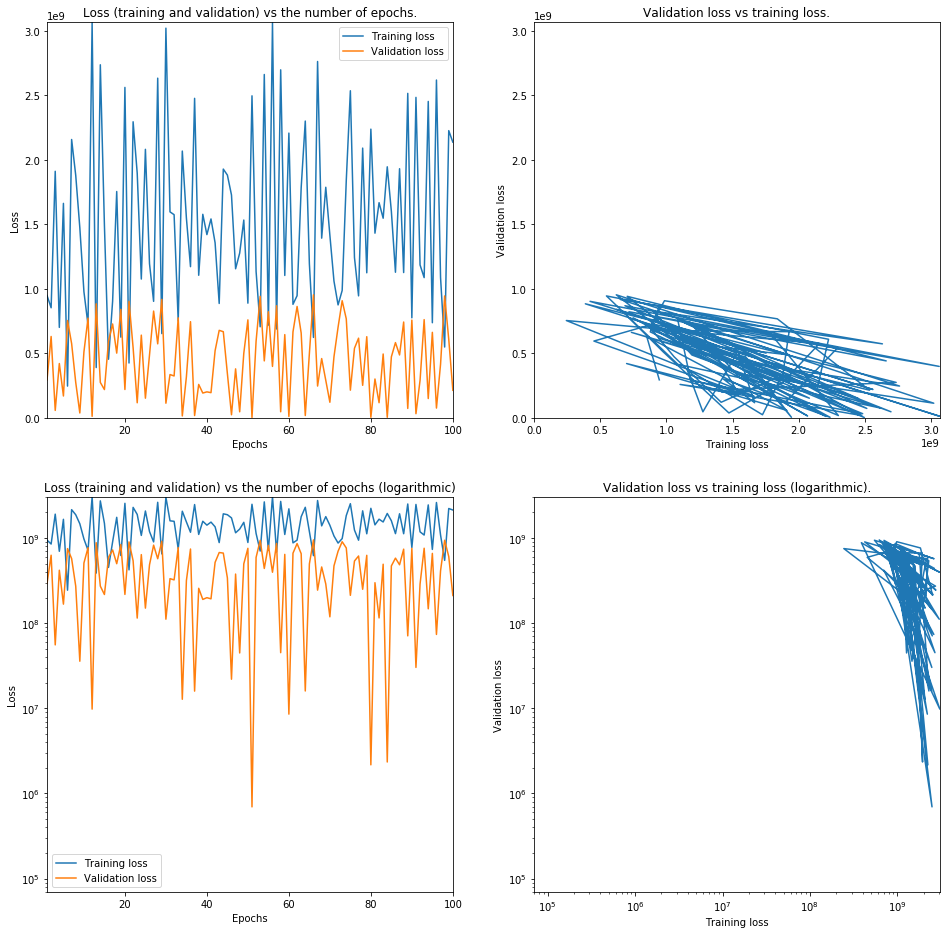

Model: "sequential_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_50 (Dense)             (None, 128)               1024      
_________________________________________________________________
dense_51 (Dense)             (None, 1)                 128       
Total params: 1,152
Trainable params: 1,152
Non-trainable params: 0
_________________________________________________________________
551777160.9520948
Layer 0:  [array([[-0.1852446 , -0.67815095,  0.64836746, ...,  0.02684007,
         0.1809389 , -0.3685373 ],
       [ 0.63136053,  0.5569897 , -0.5469795 , ..., -0.17302367,
         0.47275203,  0.34562445],
       [-0.87893236, -0.05083203,  0.32706505, ..., -0.624078  ,
         0.24996775, -0.67728263],
       ...,
       [-0.03374632,  0.4290579 ,  0.2767833 , ...,  0.22247759,
         0.10037446, -0.48361132],
       [ 0.3897636 , -0.03690642, -0.45982224, ...,  0.07552896,
       

In [54]:
fitDetails = model.fit(trainingInput['input'], trainingInput['target'], validation_split=0.3, epochs=100, verbose=1, callbacks=callbacksNetwork)

history = plotHistory(fitDetails)

evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

model.summary()
print(evaluation)
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

## Real very complex data

In [55]:
name = '2DenseLayerNetwork'
settingsLineaerNet = [['Dense', 128, 'softplus', False], ['Dense', 128, 'softplus', False], ['Dense', 1, 'linear', False]]
learningRate = 1*10**-4
callbacksNetwork = []#[keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=50, min_delta=2*10**-1)]

model = makeDenseNetwork(inputSize, settingsLineaerNet, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, optimizer=adam)
#model.layers[0].set_weights([np.array([[1] for i in range(inputSize)])])
#model.layers[0].set_weights([np.array([[random.uniform(0.5, 1.5)] for i in range(inputSize)])])


model.summary()
print(model.evaluate(validationInput['input'], validationInput['target'], verbose=1))
print(model.evaluate(trainingInput['input'], trainingInput['target'], verbose=1))
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_52 (Dense)             (None, 128)               1024      
_________________________________________________________________
dense_53 (Dense)             (None, 128)               16384     
_________________________________________________________________
dense_54 (Dense)             (None, 1)                 128       
Total params: 17,536
Trainable params: 17,536
Non-trainable params: 0
_________________________________________________________________
12990/12990 [==============================] - 0s 36us/step
7167808052.75791
51960/51960 [==============================] - 2s 33us/step
9933130093.66525
Layer 0:  [array([[-0.10803103, -0.53855217,  0.10796511, ..., -0.23663867,
        -0.16441911, -0.8333443 ],
       [ 0.18834895,  0.34916896,  0.01279491, ..., -0.20545715,
        -0.5041922 , -0.43787998],
       [-0.688

Train on 36372 samples, validate on 15588 samples
Epoch 1/200
36372/36372 [==============================] - 3s 81us/step - loss: 8554806595.1770 - val_loss: 2244173295.0944
Epoch 2/200
36372/36372 [==============================] - 3s 78us/step - loss: 3264919655.9606 - val_loss: 109568922.2016
Epoch 3/200
36372/36372 [==============================] - 3s 79us/step - loss: 2064654313.7370 - val_loss: 5839939006.2667
Epoch 4/200
36372/36372 [==============================] - 3s 82us/step - loss: 19384956403.5935 - val_loss: 1781673723.2536
Epoch 5/200
36372/36372 [==============================] - 3s 84us/step - loss: 4759591474.5749 - val_loss: 5076734170.3829
Epoch 6/200
36372/36372 [==============================] - 3s 80us/step - loss: 6827498326.9755 - val_loss: 4864865806.5301
Epoch 7/200
36372/36372 [==============================] - 3s 78us/step - loss: 5084651823.1268 - val_loss: 6970496098.6949
Epoch 8/200
36372/36372 [==============================] - 3s 79us/step - loss: 20

36372/36372 [==============================] - 3s 90us/step - loss: 6019416262.5806 - val_loss: 3089126231.0853
Epoch 67/200
36372/36372 [==============================] - 3s 80us/step - loss: 20246361643.7668 - val_loss: 2319520531.6934
Epoch 68/200
36372/36372 [==============================] - 3s 82us/step - loss: 11200845847.8326 - val_loss: 3431047841.4108
Epoch 69/200
36372/36372 [==============================] - 3s 82us/step - loss: 4742359908.4071 - val_loss: 6208237196.0244
Epoch 70/200
36372/36372 [==============================] - 3s 77us/step - loss: 14235633149.9688 - val_loss: 4351291634.6512
Epoch 71/200
36372/36372 [==============================] - 3s 75us/step - loss: 6395689022.9863 - val_loss: 6070306181.3028
Epoch 72/200
36372/36372 [==============================] - 3s 76us/step - loss: 18531565485.4051 - val_loss: 1163248959.2798
Epoch 73/200
36372/36372 [==============================] - 3s 75us/step - loss: 9633456786.1306 - val_loss: 1696712284.1000
Epoch 74/

36372/36372 [==============================] - 3s 76us/step - loss: 8812452391.5667 - val_loss: 304989992.5474
Epoch 197/200
36372/36372 [==============================] - 3s 78us/step - loss: 7633483497.4503 - val_loss: 2102546950.3206
Epoch 198/200
36372/36372 [==============================] - 3s 81us/step - loss: 7944708917.6535 - val_loss: 1622792290.9272
Epoch 199/200
36372/36372 [==============================] - 3s 81us/step - loss: 1896809328.0461 - val_loss: 4478695471.7497
Epoch 200/200
36372/36372 [==============================] - 3s 75us/step - loss: 13959879757.9971 - val_loss: 778481476.4718


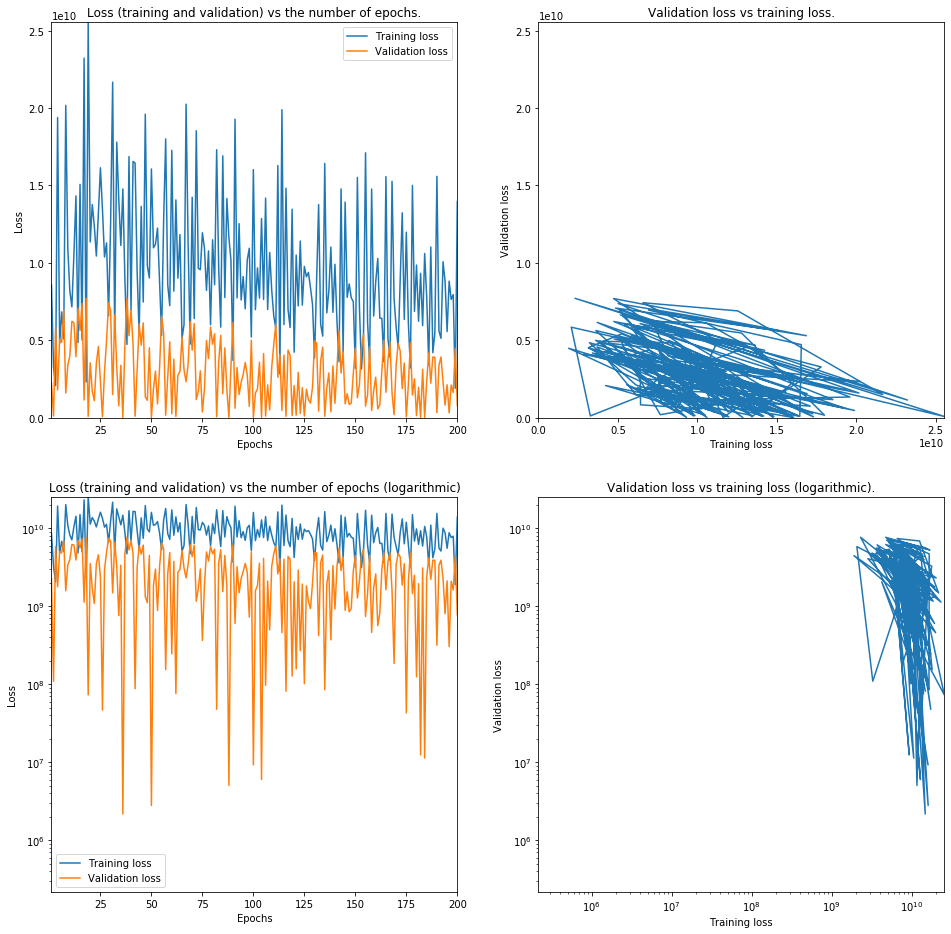

Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_52 (Dense)             (None, 128)               1024      
_________________________________________________________________
dense_53 (Dense)             (None, 128)               16384     
_________________________________________________________________
dense_54 (Dense)             (None, 1)                 128       
Total params: 17,536
Trainable params: 17,536
Non-trainable params: 0
_________________________________________________________________
2031907799.1020255
Layer 0:  [array([[-0.39344642, -0.53855217, -0.31499097, ..., -0.5807823 ,
        -0.16441911, -0.7434402 ],
       [-0.5528205 ,  0.34916896, -0.22863644, ..., -0.27901912,
        -0.5041922 , -0.1187879 ],
       [-1.2200503 , -0.28209943,  0.54319966, ...,  0.43323335,
         0.69649476, -0.8377868 ],
       ...,
       [ 0.09017767,  0.76487976, -0.

In [56]:
fitDetails = model.fit(trainingInput['input'], trainingInput['target'], validation_split=0.3, epochs=200, verbose=1, callbacks=callbacksNetwork)

history = plotHistory(fitDetails)

evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

model.summary()
print(evaluation)
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

# TEMP

In [ ]:
print(np.shape(trainingInput['input']))
print(np.shape(trainingInput['target']))

In [ ]:
dataset = np.loadtxt('pima-indians-diabetes.csv', delimiter=',')
#print(dataset)
# split into input (X) and output (y) variables
X = dataset[:,0:8]
y = dataset[:,8]

print(np.shape(X))
print(np.shape(y))
print(X)
print(y)

model = Sequential()
model.add(Dense(12, input_dim=8, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit(X, y, epochs=150, batch_size=10)